#Observational Techniques in Astrophysics (2024-2025)

### 3. Spectroscopy


Spectroscopic data reduction shares some steps with photometric data reduction (such as bias, dark, and flat-field corrections), but also has unique elements that allow us to extract and interpret spectral information from astronomical sources. In spectroscopy, we’re not only interested in the total brightness but in how the light is distributed across wavelengths, which can reveal information about an object’s temperature, composition, motion, and more.

In this notebook, we’ll walk through the steps necessary to process raw spectroscopic data, correct for instrumental effects, and extract the final one-dimensional (1D) spectrum. Our goals include:

- Preprocessing the data to remove instrumental signatures
- Extracting a clean 1D spectrum from the 2D spectroscopic image
- Calibrating the spectrum in wavelength
- Calibrating in flux

#Let's load the data
from google.colab import drive
drive.mount('/content/drive')

In [1]:
#We install some packages that we will use during the notebook
!pip install photutils

   ---------------------------------------- 0.0/871.9 kB ? eta -:--:--
   ---------------------------------------- 871.9/871.9 kB 9.8 MB/s  0:00:00


Let's import the libraries and functions that we will need in the following.

In [6]:
import numpy as np
import matplotlib.pyplot as plt
import os
import photutils as pho


from astropy.io import fits

from scipy import stats
from scipy.ndimage import rotate
from scipy.signal import find_peaks
from scipy.interpolate import interp1d
from scipy.signal import savgol_filter
from scipy.ndimage import gaussian_filter1d

The dataset for this tutorial consists of the images taken by the master’s students at Calar Alto during the 2023/2024 academic year. To easily run this notebook, you can either download the images and upload them to your drive or create a shortcut in your Drive to the repository.

https://drive.google.com/drive/folders/1GIYnE6Rzq3pkck4xNTObKzSAKEgshDog?usp=drive_link

In [8]:
base = "D:\Documents\Jupyter Notebooks\TEA 2025\Proyecto\M1\Datos\M1 Calar Alto 180216"
#Let's open a science image
science = base+'/UAM_0017.fits'
hdu = fits.open(science)

#To access the data:
data = hdu[0].data
print("Data Shape: ",data.shape)
header = hdu[0].header

Data Shape:  (1600, 1100)


In [9]:
#We will read a lot of fits files, so let's define a function to automatize this task
def read_data(fname):
  hdu = fits.open(fname)
  data = hdu[0].data
  header = hdu[0].header
  hdu.close()
  return data.astype(np.float64),header

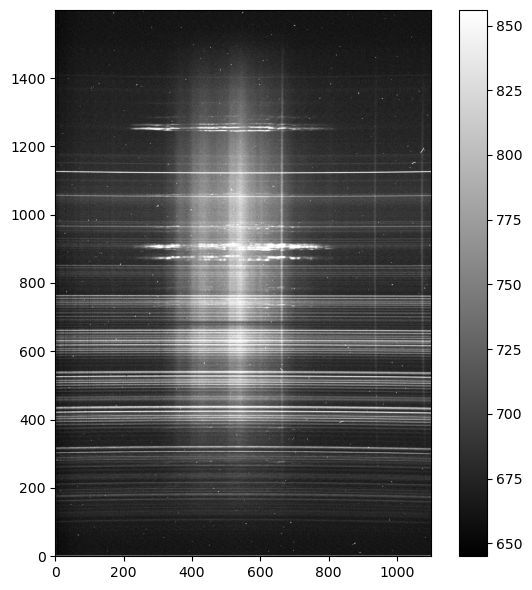

In [10]:
#And also for displaying the images
def show_image(data,vmin=None,vmax=None):
  if vmin is None:
    vmin = np.nanpercentile(data,1)
  if vmax is None:
    vmax = np.nanpercentile(data,99)

  plt.figure(figsize=[6,6],dpi=100)
  plt.imshow(data,vmin=vmin,vmax=vmax,origin='lower',interpolation=None,
             cmap="gray")
  plt.colorbar()
  plt.tight_layout()
  plt.show()
  return None

show_image(data)

In [11]:
header

SIMPLE  =                    T / file does conform to FITS standard             
BITPIX  =                   16 / number of bits per data pixel                  
NAXIS   =                    2 / number of data axes                            
NAXIS1  =                 1100 / length of data axis 1                          
NAXIS2  =                 1600 / length of data axis 2                          
COMMENT   FITS (Flexible Image Transport System) format is defined in 'Astronomy
COMMENT   and Astrophysics', volume 376, page 359; bibcode: 2001A&A...376..359H 
BLOCKED =                    T / true/false                                     
BZERO   =              32768.0 / real = fits-value*BSCALE + BZERO               
BSCALE  =                  1.0 / real = fits-value*BSCALE + BZERO               
BLANK   =                32768 / Value used for NULL pixels                     
DATAMAX =                  0.0 / Maximal pixel value                            
DATAMIN =                  0

In this 2D spectrum, the X-axis represents the spatial axis along the slit, and the Y-axis represents the spectral axis (wavelength).

Key Features:

- White Dwarf: Seen as a bright, narrow vertical streak at the center of the spatial axis, showing a continuous spectrum across wavelengths.

- Nebular Emission Lines: Horizontal streaks at specific wavelengths, corresponding to ionized elements like hydrogen (H-alpha), nitrogen ([N II]), and oxygen ([O III]). These lines are spatially extended along the X-axis, reflecting the physical size of the nebula.

- Sky Lines: Fainter horizontal lines across the entire spatial axis that originate from Earth’s atmosphere. These lines help identify background interference and are not associated with the nebula or white dwarf.

## Part 1: Preprocessing (Bias/Dark/Flat Corrections)
Since you’re already familiar with bias, dark, and flat corrections, let’s briefly review their purpose:

- Bias Correction removes the electronic offset present in all images.
- Dark Correction accounts for thermal noise in the sensor, especially relevant in long-exposure observations.
- Flat-Field Correction compensates for pixel-to-pixel sensitivity variations, creating a uniform response across the detector.

In spectroscopy, however, flat-fielding requires additional attention because sensitivity variations occur across wavelengths. However, since sensitivity also varies with wavelength, we later need to adjust the amplitude of the spectrum using a standard star. By comparing the spectrum of the standard star (which has a known flux distribution) with the observed spectrum, we reweight the data to achieve accurate wavelength-dependent sensitivity calibration. This final adjustment ensures that the spectral fluxes are correctly calibrated across the entire wavelength range.

Let's start by defining a function to read all the files under a given directory

In [20]:
def read_set(f_base):
  f_names = os.listdir(f_base)
  data_list = []
  texp_list = []
  for f_name in f_names:
    if f_name[-5:] =='.fits':   #Check that the file ends with ".fits"
      data,header = read_data(f_base+f_name) #Call to the function that reads a .fits file
      texp = header['EXPTIME']
      data_list.append(data) #We save in one numpy array the data and the exposure time in another array
      texp_list.append(texp)
  return np.array(data_list),np.array(texp_list)

In [22]:

def read_object(f_base):
    f_names = os.listdir(f_base)
    object_list = []
    for f_name in f_names:
        if f_name[-5:] =='.fits':   #Check that the file ends with ".fits"
          data,header = read_data(f_base+f_name) #Call to the function that reads a .fits file
          obj = header['Object']
          object_list.append(obj)
    return np.array(object_list)
    

In [24]:
base_bias = base+"/bias/"
objects_bias = read_object(base_bias)
print(objects_bias)

['[bias]' '[bias]' '[bias]' '[bias]' '[bias]' '[bias]' '[bias]' '[bias]'
 '[bias]' '[bias]']


In [25]:
base_flats_arcs = base+"/flat_arc_G200/"
objects_flat_arc = read_object(base_flats_arcs)
print(objects_flat_arc)

['[flat] Dome 3 arcsec G-200 N.0001' '[flat] Dome 3 arcsec G-200 N.0002'
 '[flat] Dome 3 arcsec G-200 N.0003' '[flat] Dome 3 arcsec G-200 N.0004'
 '[flat] Dome 3 arcsec G-200 N.0005' '[arc] 3 arcsec G200 N.0001'
 '[arc] 3 arcsec G200 N.0002' '[arc] 3 arcsec G200 N.0003']


In [26]:
len(objects_flat_arc)


8

In [28]:
def find_arcs(f_base):
    arcs_list = []
    f_names = os.listdir(f_base)
    for f_name in f_names:
        if f_name[-5:] =='.fits':   #Check that the file ends with ".fits"
            data,header = read_data(f_base+f_name) #Call to the function that reads a .fits file
            if header["OBJECT"].startswith("[arc]"):
                print("El fits con la lámpara de calibración es : ", f_name)
                arcs_list.append(data)
    return np.array(arcs_list)
                
                
            

In [32]:
arcs = find_arcs(base_flats_arcs)

El fits con la lámpara de calibración es :  cali_0033.fits
El fits con la lámpara de calibración es :  cali_0034.fits
El fits con la lámpara de calibración es :  cali_0035.fits


We now compute the master bias

TEXP :  0.0  s
Object :  M1 spec


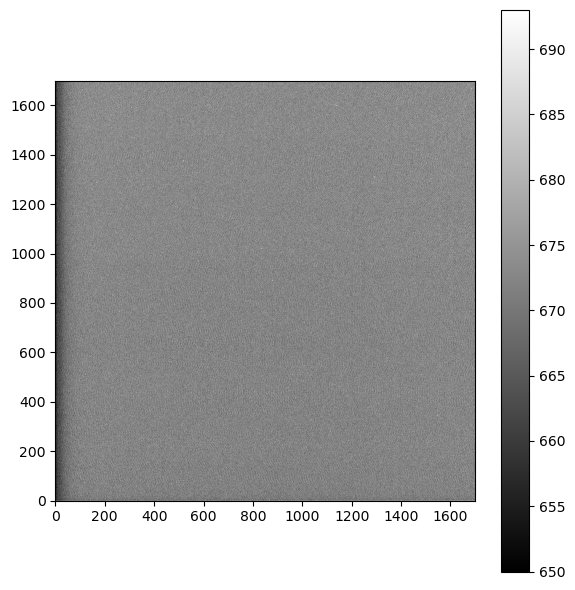

In [35]:
base_bias = base+"/bias/"
bias,_ =read_set(base_bias) #Load all the bias files
print("TEXP : ",_[0],' s' ) #Let's check that the exposure time is exactly 0 s
print("Object : ", header["OBJECT"])
show_image(bias[0]) #Plot one of the bias images

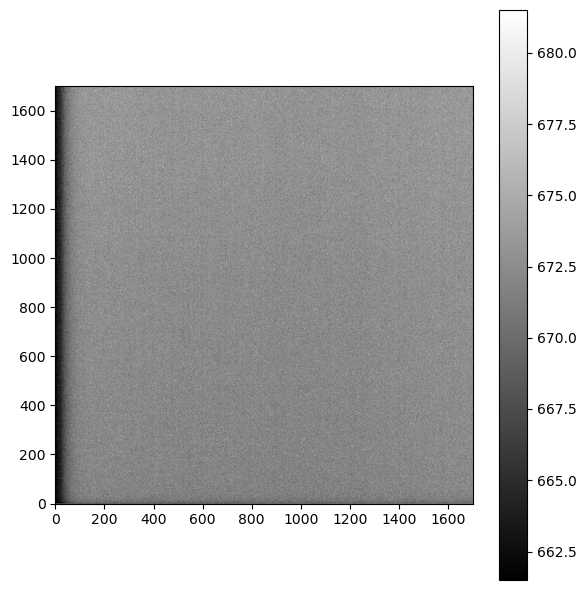

In [36]:
master_bias = np.nanmedian(bias,axis=0) #The master bias is simply the median of the files pixel-wise
show_image(master_bias)

In [37]:
print("Readout noise: ",np.nanstd(master_bias[1:,2:]),' counts') #Removing the outlier columns we estimate the readout noise as the std

Readout noise:  4.906068509023343  counts


Here should go the part about the master dark. But given that CAFOS is cooled with
liquid nitrogen, the dark current for that camera can be considered as 0, so
we will skip this computation in this tutorial

In [40]:
master_dark = np.zeros_like(master_bias)

And we now go for the master flat.

NOTE: Flats in spectroscopy are a bit different compared to photometry, as the sensitivity of the camera depends on the wavelength.

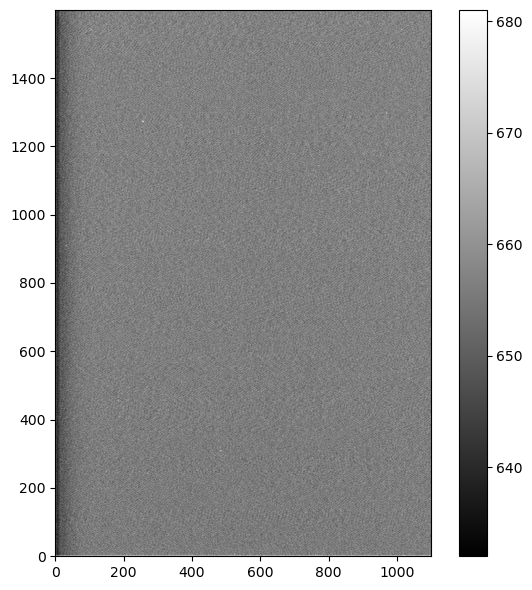

In [42]:
base_flat = base+"/flat_arc_G200/"
flats,_ =read_set(base_flat) #Read all the flat files
show_image(flats[0]) #Let's plot one of them

In [46]:
print(base+"/flat_arc_G200/")

D:\Documents\Jupyter Notebooks\TEA 2025\Proyecto\M1\Datos\M1 Calar Alto 180216/flat_arc_G200/


In [49]:
!dir "D:\Documents\Jupyter Notebooks\TEA 2025\Proyecto\M1\Datos\M1 Calar Alto 180216\flat_arc_G200\*.fits"


 O volume na unidade D não tem nome.
 O Número de Série do Volume é DE91-8D98

 Pasta de D:\Documents\Jupyter Notebooks\TEA 2025\Proyecto\M1\Datos\M1 Calar Alto 180216\flat_arc_G200

17/02/2018  18:30         3.539.520 cali_0028.fits
17/02/2018  18:31         3.539.520 cali_0029.fits
17/02/2018  18:32         3.539.520 cali_0030.fits
17/02/2018  18:34         3.539.520 cali_0031.fits
17/02/2018  18:35         3.539.520 cali_0032.fits
17/02/2018  18:39         3.539.520 cali_0033.fits
17/02/2018  18:41         3.539.520 cali_0034.fits
17/02/2018  18:42         3.539.520 cali_0035.fits
               8 arquivo(s)     28.316.160 bytes
               0 pasta(s)   923.701.305.344 bytes disponíveis


In [51]:
a,b = read_data(r'D:\Documents\Jupyter Notebooks\TEA 2025\Proyecto\M1\Datos\M1 Calar Alto 180216\flat_arc_G200\cali_0028.fits')
b['OBJECT']

'[flat] Dome 3 arcsec G-200 N.0001'

In this case, we normalize along the spatial axis, as we know that the

In [54]:
flats.shape


(8, 1600, 1100)

In [56]:
master_bias.shape

(1700, 1700)

In [58]:
master_bias = master_bias[:1600, :1100]

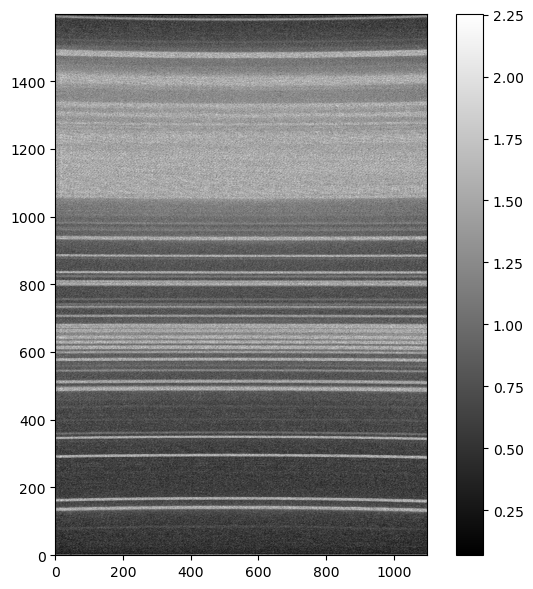

In [60]:
for i,flat in enumerate(flats):
  flat = flat - master_bias #-master_dark
  flats[i] = flat/np.nanmedian(flat,axis=0)
master_flat = np.nanmedian(flats,axis=0)
show_image(master_flat)

In [61]:
master_flat_new = master_flat.copy()
iden = np.where(master_flat_new<0.1)
master_flat_new[iden] = 0.1

Now we load the image of the calibration star (for which we already know their real spectrum) that we will use to compute the sensor response and we will use to calibrate our spectra in flux.

No será necesaria

base_science = base+"/HD93521_Cal/G200/"
science_raw,texp =read_set(base_science) #Read the calibration star file
show_image(science_raw[0]) #Plot the image

In [67]:
print(master_flat)

[[ 5.20500000e+01  9.13809524e+01  3.95851852e+01 ...  5.07923387e+01
   6.54130536e+01 -1.38382056e+01]
 [-2.13095238e-01  7.18085106e-01  4.81735160e-01 ... -7.99242424e-02
  -3.02884615e-02  1.52935606e-01]
 [ 1.75000000e-01  2.00000000e-01  2.29761905e-01 ...  5.68951613e-01
  -6.06060606e-02 -5.43064024e-01]
 ...
 [ 3.50000000e-01  7.95000000e-01  5.04892368e-01 ...  8.57862903e-01
   4.30769231e-01  2.49103943e-01]
 [ 5.00000000e-01  2.52100840e-01  3.52968037e-01 ...  5.19246519e-01
   5.58974359e-01  1.00000000e+00]
 [ 7.43181818e-01  2.44472257e-01  1.14285714e+00 ...  1.29308712e+00
   5.89903846e-01  6.59323367e-01]]


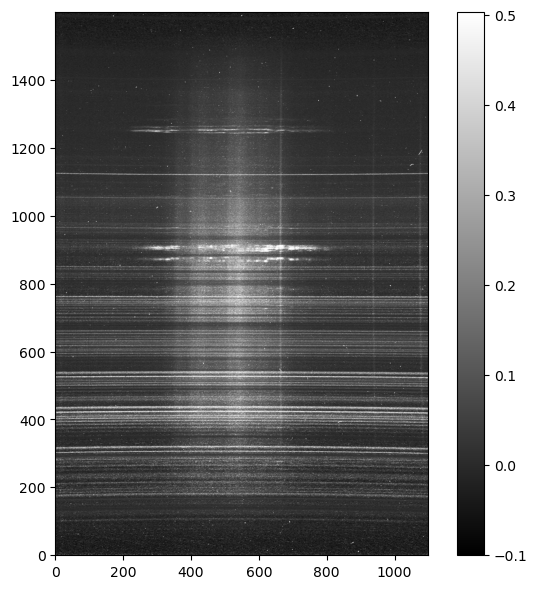

In [69]:
base_science = base+"/"
science_raw,texp = read_set(base_science) #Read the calibration star file
science_reduced = science_raw - master_bias #-master_dark
science_reduced = science_reduced/master_flat_new
science_reduced /= texp #This is now in counts/s
show_image(science_reduced[0])

sacamos un recorte del cielo

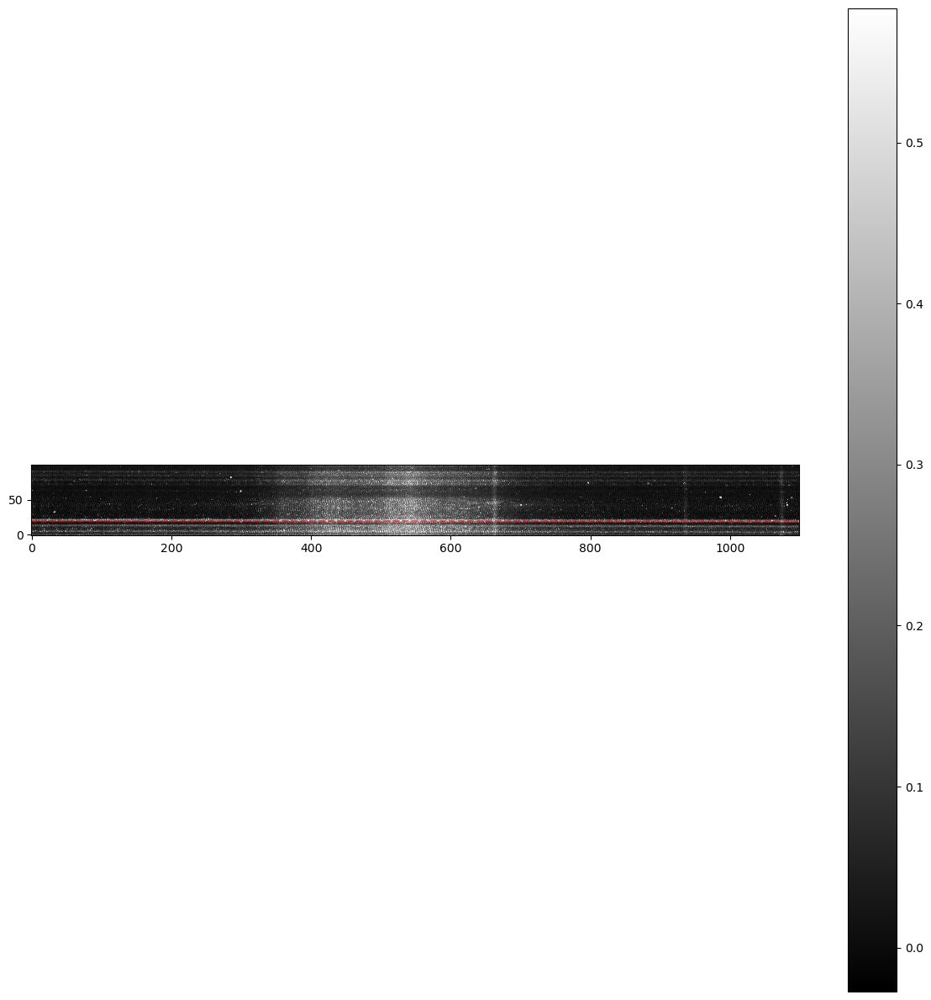

In [72]:
def show_sky(data,vmin=None,vmax=None):
    if vmin is None:
        vmin = np.nanpercentile(data,1)
    if vmax is None:
        vmax = np.nanpercentile(data,99)

    plt.figure(figsize=[12,12],dpi=100)
    plt.imshow(data,vmin=vmin,vmax=vmax,origin='lower',interpolation=None,
             cmap="gray")
    plt.axhline(y =20,color='r',ls='dashed',alpha=0.6)
    plt.colorbar()
    plt.tight_layout()
    plt.show()
    return None

show_sky(science_reduced[0,740:840,:])

In [74]:
size_m1 = 300*0.53
print("tamaño M1 en arcsec: ", size_m1)

tamaño M1 en arcsec:  159.0


## Part 2: Wavelength Calibration

In spectroscopy, calibrating the wavelength axis is critical because it allows us to determine the exact wavelengths of spectral features. Typically, this is done using an arc lamp, which emits light at known wavelengths.
Explanation

- Arc Lamp Calibration: Arc lamps contain gases (like neon, argon, or mercury) that produce emission lines at known, precise wavelengths when excited. We use images of these lamps to map pixel positions in the detector to specific wavelengths.
- Process: The reduction process involves identifying prominent lines in the arc lamp spectrum and mapping them to their known wavelengths. We will do this by a linear function  that converts pixel coordinates to wavelength units.

Let's load one of the arc lamps

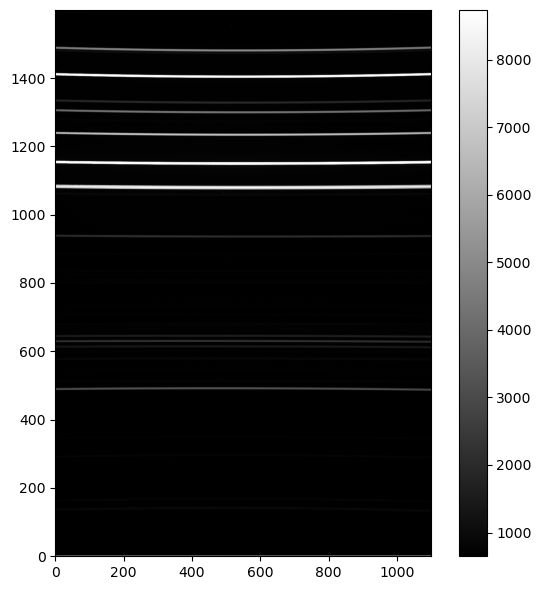

In [78]:

show_image(arcs[0]) #Let's plot one images


Let's see how to extract the 1D spectrum.

 In principle it would just be extracting 1 column along the spectral axis (axis=1). We can also select a small "spatial" region and compute the average. This implies selecting several columns and then computing the average/sum along the spatial axis.

We will select the same region that we will use later for the stellar spectrum

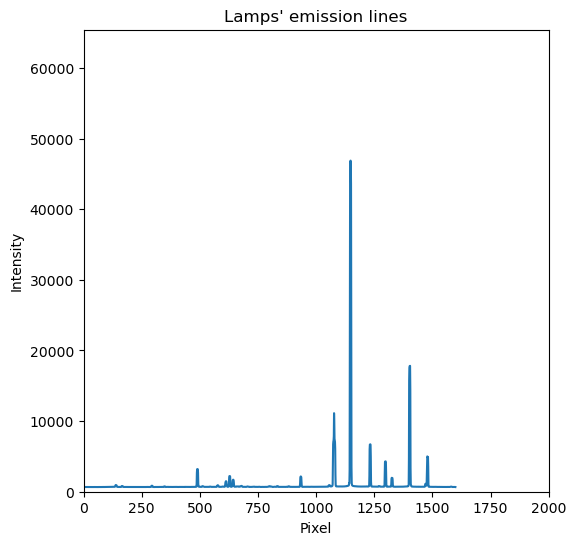

In [81]:
arc_spec = arcs[0][:,720:727].mean(axis=1)
plt.figure(figsize=[6,6],dpi=100)
plt.plot(arc_spec)
plt.xlabel("Pixel")
plt.ylabel("Intensity")
plt.title("Lamps' emission lines")
plt.xlim(0,2000)
plt.ylim(0,65400)
plt.show()

We use the "find_peaks" function to find out the positions of the emission lines

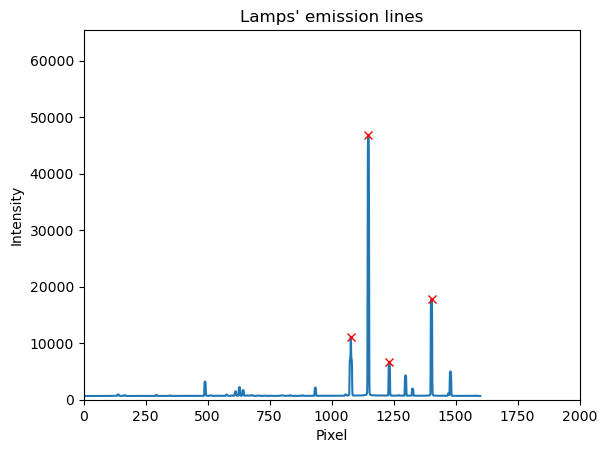

array([1077, 1148, 1233, 1404])

In [84]:
prominence = 5000
peaks, _ = find_peaks(arc_spec, prominence=prominence)

plt.plot(arc_spec)
plt.plot(peaks, arc_spec[peaks], "rx")
plt.xlabel("Pixel")
plt.ylabel("Intensity")
plt.title("Lamps' emission lines")
plt.xlim(0,2000)
plt.ylim(0,65400)
plt.show()
peaks

# Calar Alto Calibration Lamp reference: http://w3.caha.es/CAHA/Instruments/CAFOS/comp.html

You can check the wavelengths of the different peaks in the plot below

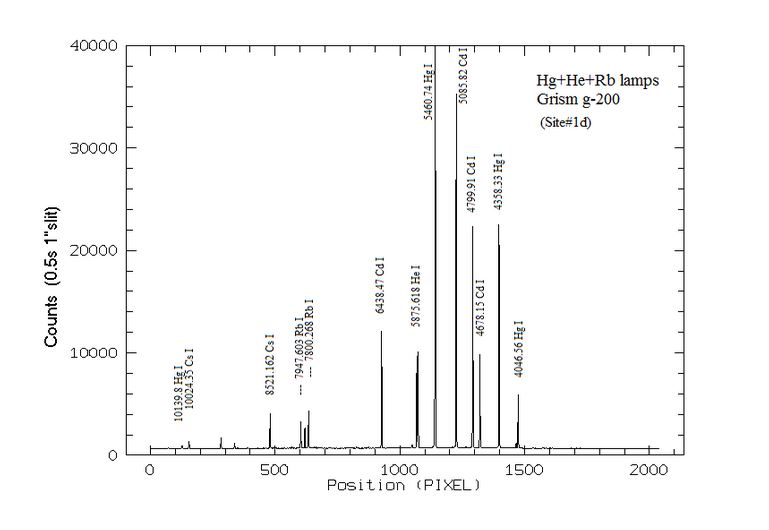

In [87]:
wavelenghts = np.array([
                          5875.618, #He I
                          5460.74,  #Hg I
                          5085.82,  #Cd I
                          4358.33,  #Hg I
])

We make a linear fit of the position of the peaks to their corresponding wavelengths. Over a wide range of the detector this is indeed linear, but as we go to the edges this might not be valid, and a higher order polinomial might be requiered

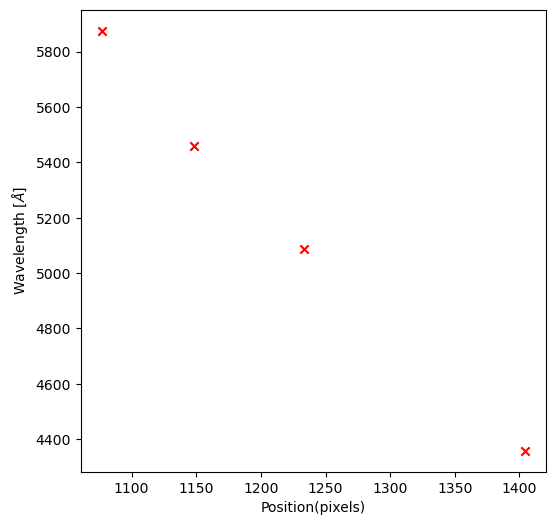

In [90]:
plt.figure(figsize=[6,6],dpi=100)
plt.scatter(peaks,wavelenghts, marker="x",color='r')
plt.xlabel("Position(pixels)")
plt.ylabel(r"Wavelength $[\AA]$")
plt.show()

Slope: -4.56260
Intercept: 10740.96664
R-squared: 0.99554
P-value: 0.00223


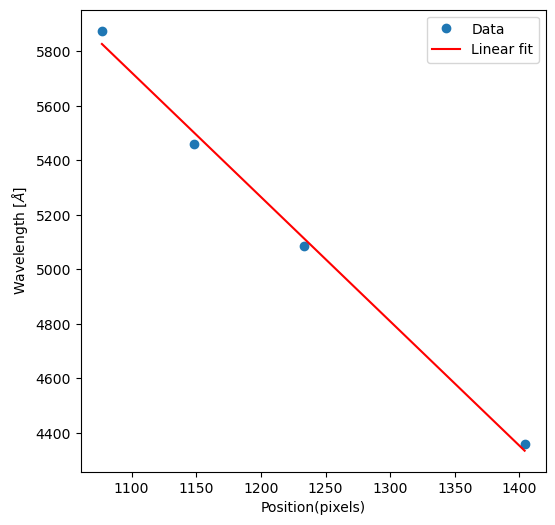

In [92]:
slope, intercept, r_value, p_value, std_err = stats.linregress(peaks, wavelenghts)
print(f"Slope: {slope:.5f}")
print(f"Intercept: {intercept:.5f}")
print(f"R-squared: {r_value**2:.5f}")
print(f"P-value: {p_value:.5f}")

fit_line = slope * np.array(peaks) + intercept

plt.figure(figsize=[6,6])
plt.plot(peaks, wavelenghts, 'o', label='Data')
plt.plot(peaks, fit_line, 'r', label='Linear fit')
plt.xlabel("Position(pixels)")
plt.ylabel(r"Wavelength $[\AA]$")
plt.legend()
plt.show()

wavelength_array = slope * np.arange(len(arc_spec)) + intercept

We create a wavelength array by applying this linear fit we have just obtained.

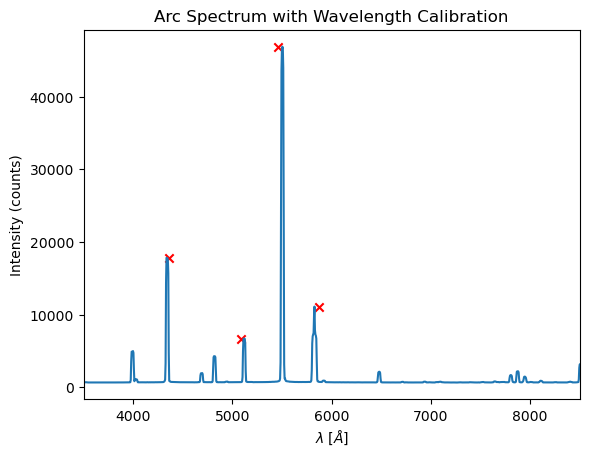

In [95]:
plt.plot(wavelength_array, arc_spec)
plt.scatter(wavelenghts,arc_spec[peaks], marker="x",color='r')
plt.xlim(3500,8500)
plt.xlabel(r"$\lambda \; [\AA]$")
plt.ylabel("Intensity (counts)")
plt.title("Arc Spectrum with Wavelength Calibration")
plt.show()

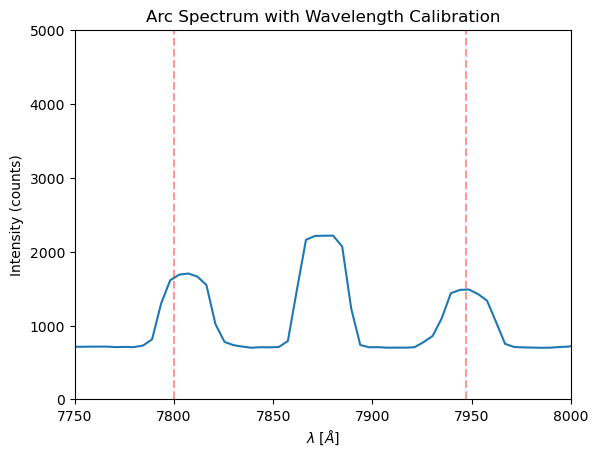

In [97]:
plt.plot(wavelength_array, arc_spec)
plt.scatter(wavelenghts,arc_spec[peaks], marker="x",color='r')
plt.xlim(3500,8500)
plt.xlabel(r"$\lambda \; [\AA]$")
plt.ylabel("Intensity (counts)")
plt.title("Arc Spectrum with Wavelength Calibration")
plt.xlim([7750,8000])
plt.axvline(7800,color='r',ls='dashed',alpha=0.4)
plt.axvline(7947,color='r',ls='dashed',alpha=0.4)
plt.ylim([0,5000])
plt.show()

## Ahora hay que restar el cielo

Once we have the mapping between pixels in the spectral axis and the corresponding wavelenght, we can just apply this map to all the other science images, including the standard calibration star.

Espectro de la primera estrella (pixel 600)

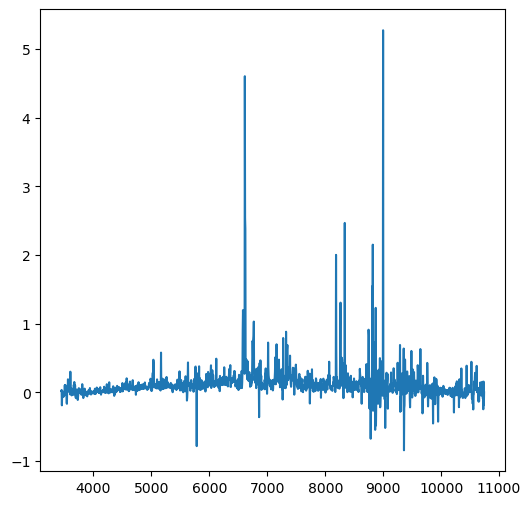

In [102]:
sky = science_reduced[0,:,50]
spec = science_reduced[0,:,664]
spec = spec - sky
plt.figure(figsize=[6,6],dpi=100)
plt.plot(wavelength_array,spec)

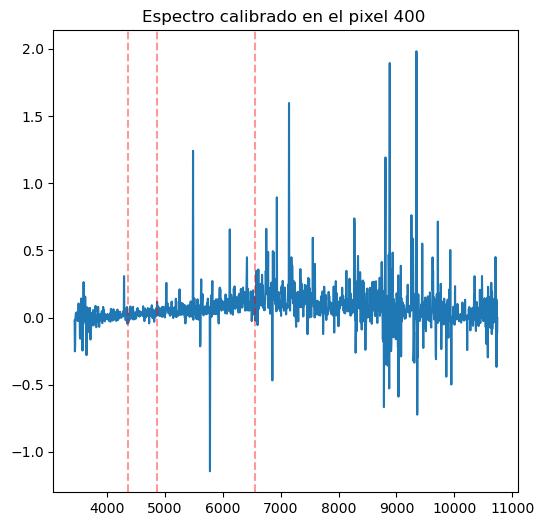

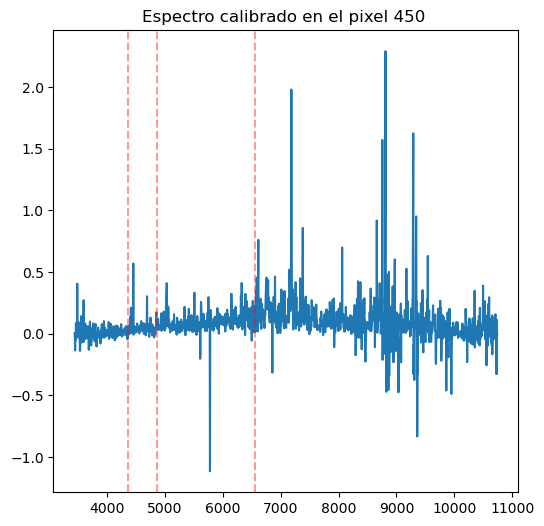

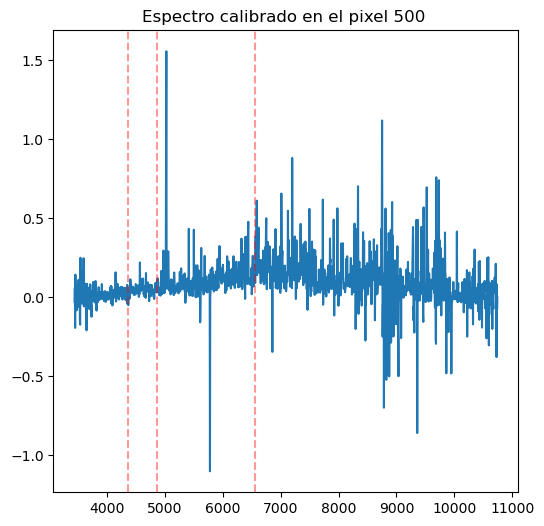

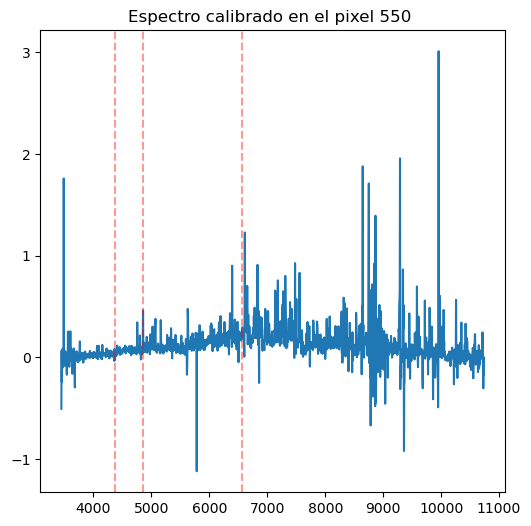

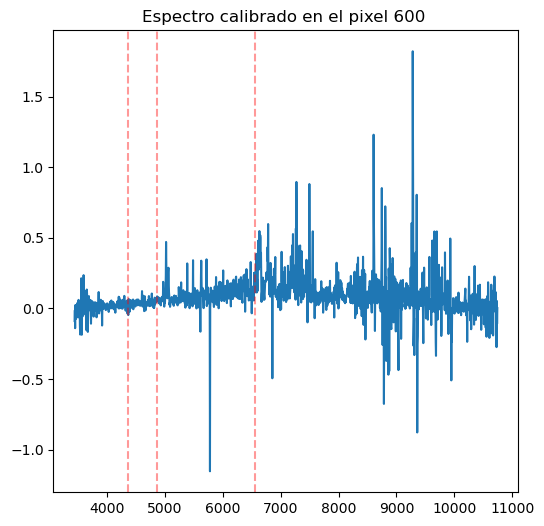

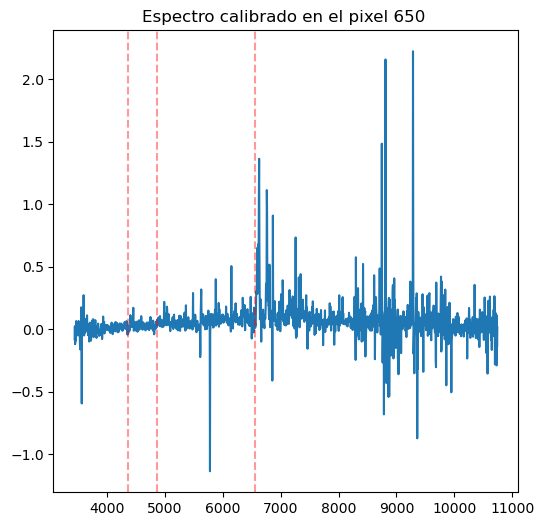

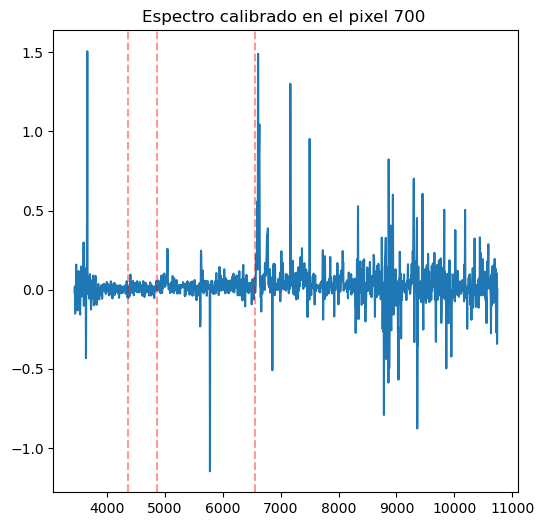

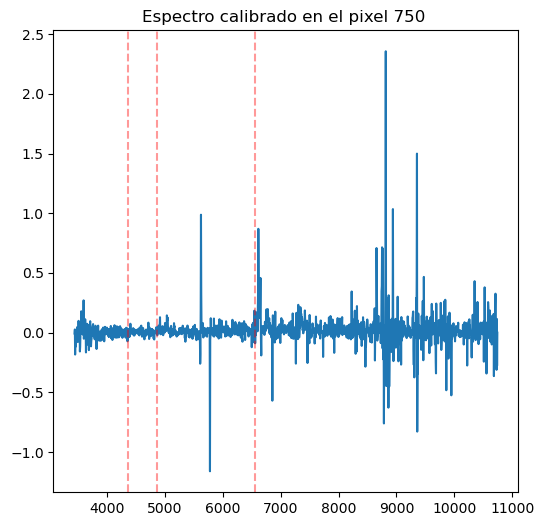

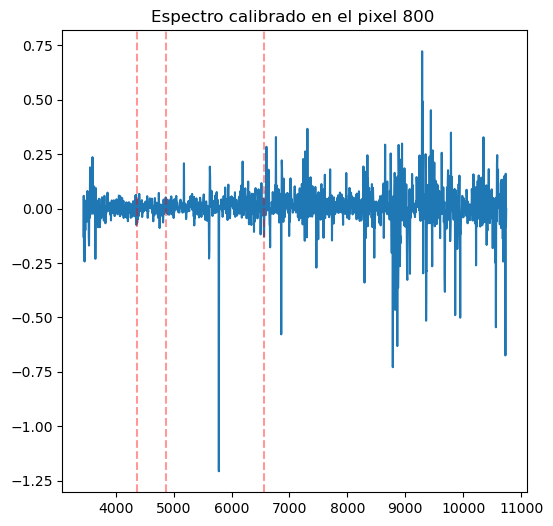

In [104]:
sky = science_reduced[0,:,50]
for i in range(9):
    spec = science_reduced[0,:,400 + 50*i]
    spec = spec- sky
    plt.figure(figsize=[6,6],dpi=100)
    plt.plot(wavelength_array,spec)
    plt.axvline(6563,color='r',ls='dashed',alpha=0.4)
    plt.axvline(4861,color='r',ls='dashed',alpha=0.4)
    plt.axvline(4363,color='r',ls='dashed',alpha=0.4)
    plt.title(f"Espectro calibrado en el pixel {str(400 + 50*i)} ")

Ahora sacamos los picos

In [106]:
peaks = []
for i in range(9):
    prominence = 5000
    peaks, _ = find_peaks(arc_spec, prominence=prominence)

## Esto sería una alternativa - integrar en una región del espacio (Código original)

Text(3500, -50, 'Linea de 4363 A')

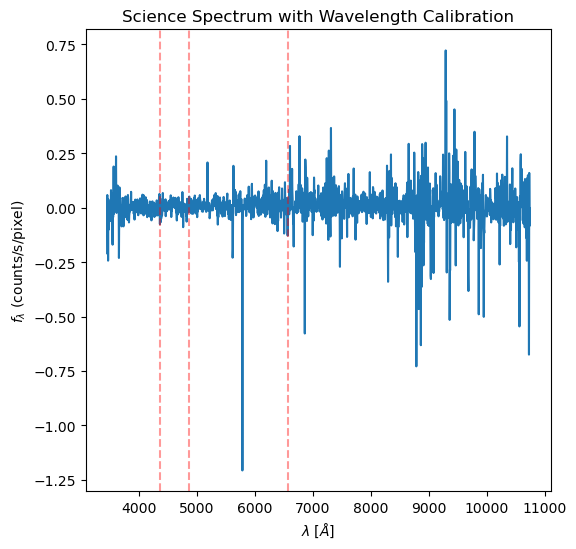

In [109]:
#spec = np.sum(spec,axis=1) # EN el código original se usaba un ancho en pixeles
plt.figure(figsize=[6,6],dpi=100)
plt.plot(wavelength_array,spec)
plt.axvline(6563,color='r',ls='dashed',alpha=0.4)
plt.axvline(4861,color='r',ls='dashed',alpha=0.4)
plt.axvline(4363,color='r',ls='dashed',alpha=0.4)
plt.xlabel(r'$\lambda \; [\AA]$')
plt.ylabel(r'$f_{\lambda}$ (counts/s/pixel)')
plt.title('Science Spectrum with Wavelength Calibration')
plt.annotate(
    'Linea de 4861 A',        # El texto de la etiqueta
    xy=(4861, -100),         # Coordenadas (x, y) donde apunta la línea discontinua
    xytext=(4870, -150), # Coordenadas (x, y) donde se coloca el texto
    arrowprops=dict(arrowstyle="->", connectionstyle="arc3,rad=0.1") # Estilo opcional de la flecha
)
plt.annotate(
    'Linea de 4363 A',        # El texto de la etiqueta
    xy=(4363, -10),         # Coordenadas (x, y) donde apunta la línea discontinua
    xytext=(3500, -50), # Coordenadas (x, y) donde se coloca el texto
    arrowprops=dict(arrowstyle="->", connectionstyle="arc3,rad=0.1") # Estilo opcional de la flecha
)


Formally, what we have just computed is $f_\lambda$, in units of counts per second per unit of $\lambda$.

Another popular way of reporting the spectra is using the quantity $f_\nu$. This and $f_\lambda$ are related via
$$f_\lambda = \frac{c}{\lambda^2} f_\nu$$

So a very convinient way of plotting these quantities is via either $\lambda f_\lambda$ or $\nu f_\nu$ as one has that:
$$\lambda f_\lambda = \nu  f_\nu$$

Text(0.5, 1.0, 'Science Spectrum with Wavelength Calibration')

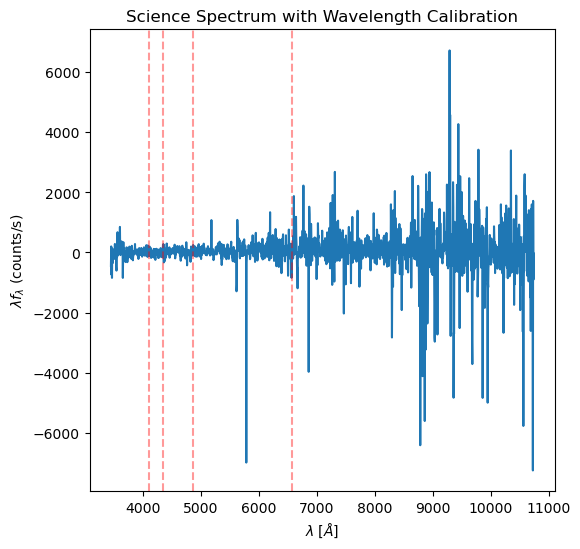

In [114]:
plt.figure(figsize=[6,6],dpi=100)
plt.plot(wavelength_array,spec*wavelength_array)
plt.axvline(6563,color='r',ls='dashed',alpha=0.4)
plt.axvline(4861,color='r',ls='dashed',alpha=0.4)
plt.axvline(4341,color='r',ls='dashed',alpha=0.4)
plt.axvline(4102,color='r',ls='dashed',alpha=0.4)
plt.xlabel(r'$\lambda \; [\AA]$')
plt.ylabel(r'$\lambda f_{\lambda}$ (counts/s)')
plt.title('Science Spectrum with Wavelength Calibration')

We can also make a zoom aroung the H-$\alpha$ line

(4700.0, 5000.0)

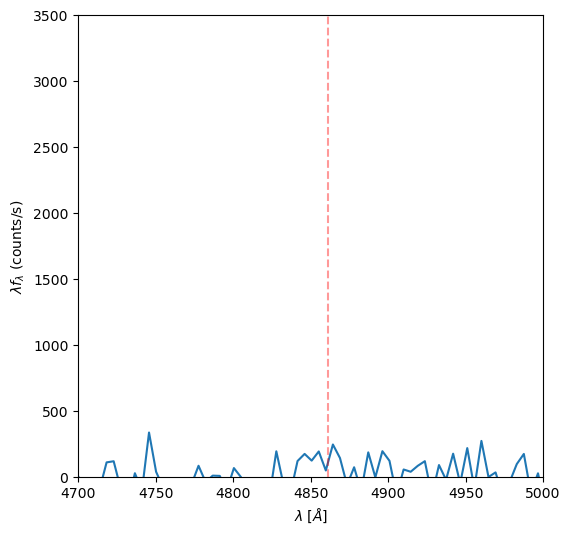

In [117]:
plt.figure(figsize=[6,6],dpi=100)
plt.plot(wavelength_array,spec*wavelength_array)
plt.axvline(4861,color='r',ls='dashed',alpha=0.4)
plt.xlabel(r'$\lambda \; [\AA]$')
plt.ylabel(r'$\lambda f_{\lambda}$ (counts/s)')
plt.ylim(0,3.5e3)
plt.xlim(4700,5000)

Text(0, 0.5, '$\\lambda f_{\\lambda}$ (counts/s)')

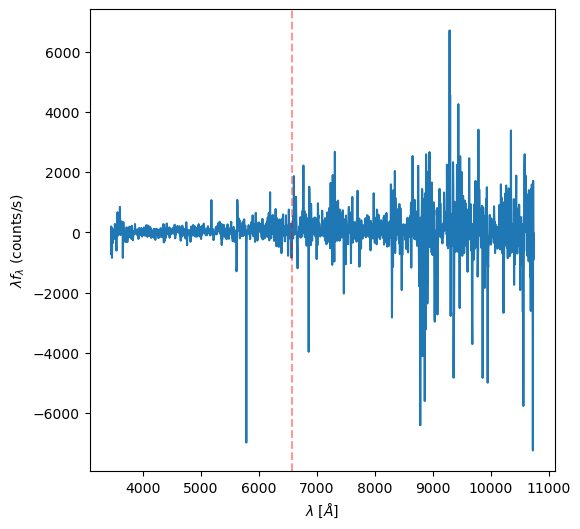

In [119]:
plt.figure(figsize=[6,6],dpi=100)
plt.plot(wavelength_array,spec*wavelength_array)
plt.axvline(6563,color='r',ls='dashed',alpha=0.4)
plt.xlabel(r'$\lambda \; [\AA]$')
plt.ylabel(r'$\lambda f_{\lambda}$ (counts/s)')

## Saltaré esta parte


# Part 3: Flux Calibration

A crucial step in spectroscopic data reduction is flux calibration. This process is essential for enabling meaningful scientific analysis, as it ensures that the spectrum’s flux values are accurate and comparable to theoretical models and other observations. Accurate flux calibration allows us to derive physical properties of the source, such as luminosity and temperature.


To perform this calibration, we observe a spectrophotometric standard star—a star with a well-known spectrum and accurately measured fluxes across wavelengths. By comparing the observed spectrum of this standard to its known flux values at each wavelength, we can derive a response curve or sensitivity curve for the detector. This response curve reflects the detector's sensitivity across the wavelength range, allowing us to apply it to the science spectrum and achieve true flux calibration.

Without this standard star calibration, our spectrum would lack reliable amplitude information, limiting our ability to interpret physical characteristics of the observed object.

You can find several spectrophotometric standard stars in:

https://www.eso.org/sci/observing/tools/standards/spectra/hd93521.html


In this notebook we are using the star HD-93521 which is included in that repository. You have already the file downloaded with the spectrum of this star in the Google Drive ;)

In [ ]:
f_cal = base+'/HD93521_Cal/mhd93521-1.dat'
#Columns: Wavelength // AB-mag // Bin
data_cal = np.loadtxt(f_cal)
wavelength_cal = data_cal[:,0]
ab_mag_cal = data_cal[:,1]

NOTE: The spectrum of the star is given in units of AB-magnitude.


Text(0.5, 1.0, 'Standard Spectrum for HD93521')

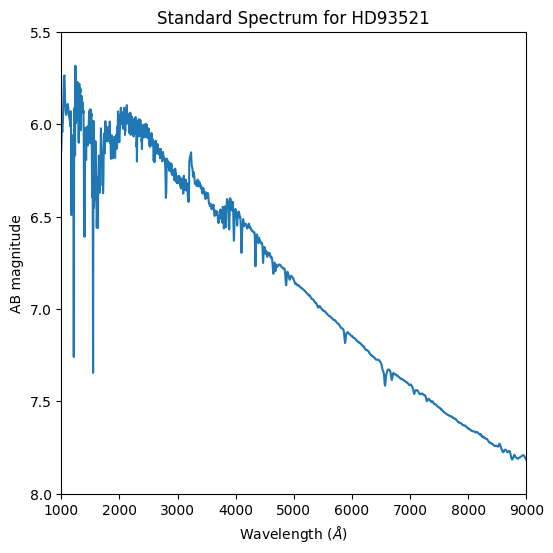

In [ ]:
plt.figure(figsize=[6,6],dpi=100)
plt.plot(wavelength_cal,ab_mag_cal)
plt.xlabel(r'Wavelength $(\AA)$')
plt.ylabel(r'AB magnitude')
plt.ylim(8,5.5)
plt.xlim(1000,9000)
plt.title('Standard Spectrum for HD93521')

The AB magnitude system is a photometric system where magnitudes are defined in relation to a constant flux density across frequencies. An object with an AB magnitude of 0 has a flux density of 3631 Janskys (Jy), where
$$1 Jy =10^{-26}\, W\, m^{-2} Hz^{-1} = 10^{-23} erg\, s^{-1} cm^{-2} Hz^{-1} $$

Then, the relationship between AB magnitudes and the flux density $f_\nu$ (in Janskys) is given by:

$$ABmag = -2.5\log_{10}\left(\frac{f_{\nu}}{3631\,Jy}\right)$$

Also, following https://www.eso.org/sci/observing/tools/standards/spectra/okestandards_rev.html#Caution we have the mapping between these AB magnitudes and $f_\nu$ given by:

$$ABmag = -2.5\log_{10}f_{\nu} -48.59$$

where $f_\nu$ is given in units of $erg\, s^{-1} \, cm^{-2}\,Hz^{-1}$

In [ ]:
#ABMAG = -2.5*log10_(Fnu) - 48.59
#Fnu = 10**((ABMAG+48.59)/(-2.5)) # erg/cm^2 /s /Hz
fnu = 10**((ab_mag_cal+48.59)/(-2.5)) #erg/cm2/s/Hz

Text(0.5, 0, 'Wavelength $(\\AA)$')

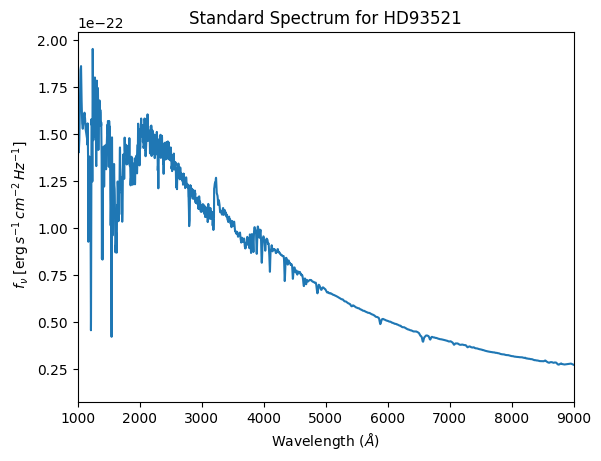

In [ ]:
plt.plot(wavelength_cal,fnu)
plt.xlim(1000,9000)
plt.ylabel(r' $ f_{\nu} \; [{\rm erg}\, s^{-1}\,cm^{-2}\, Hz^{-1}]$')
plt.title('Standard Spectrum for HD93521')
plt.xlabel(r'Wavelength $(\AA)$')


We have our spectrum given as $f_\lambda$, so let's transform the reference spectrum into that convention:

(0.0, 4e-11)

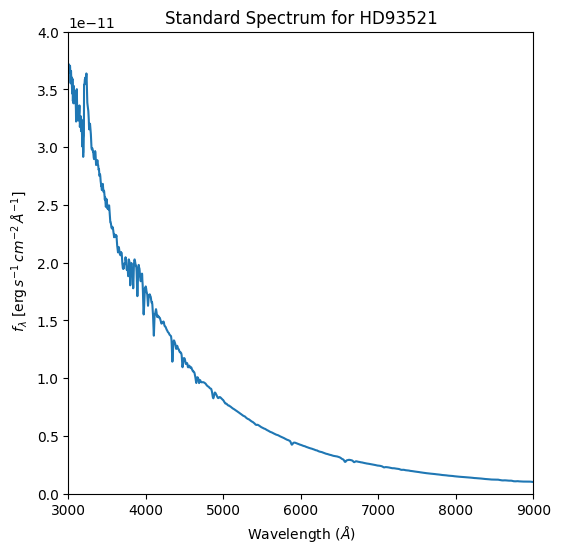

In [ ]:
prefac = 2.99792458e18/wavelength_cal**2
flam = fnu*prefac


plt.figure(figsize=[6,6],dpi=100)
plt.plot(wavelength_cal,flam)
plt.ylabel(r' $ f_{\lambda} \; [{\rm erg}\, s^{-1}\,cm^{-2}\, \AA^{-1}]$')
plt.title('Standard Spectrum for HD93521')
plt.xlabel(r'Wavelength $(\AA)$')
plt.xlim(3000,9000)
plt.ylim(0,4e-11)


If we compare the spectrum we have obtained and the one tabulated we will se that they are very different. This is because 1. They are not in the same units. 2. We have not corrected for the CCD sensitivity at different wavelenghts.



(0.0, 8e-08)

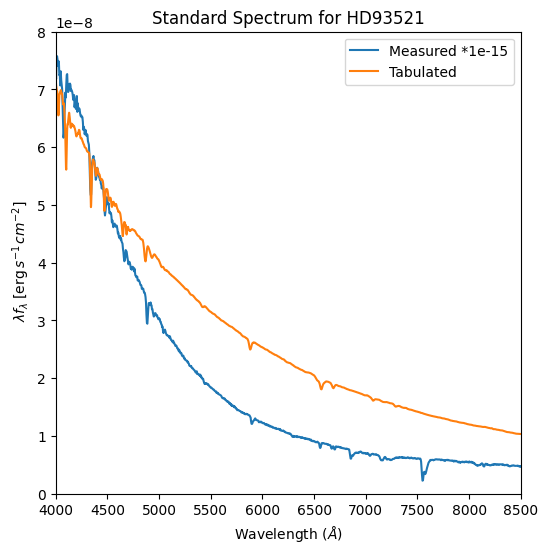

In [ ]:
plt.figure(figsize=[6,6],dpi=100)
plt.plot(wavelength_array,spec*wavelength_array*1e-15,label='Measured *1e-15')
plt.plot(wavelength_cal,flam *wavelength_cal,label='Tabulated')
plt.legend()
plt.ylabel(r' $ \lambda f_{\lambda} \; [{\rm erg}\, s^{-1}\,cm^{-2}]$')
plt.title('Standard Spectrum for HD93521')
plt.xlabel(r'Wavelength $(\AA)$')
plt.xlim(4000,8500)
plt.ylim(0,8e-8)

But as we know both spectrum should be the same, we can compute a "correction factor" for each wavelength.

As there are several features in the spectra (emission and absorption lines, sky lines, noise...) we should first smooth both spectra, the one measured and the one tabulated.

(0.0, 8e-08)

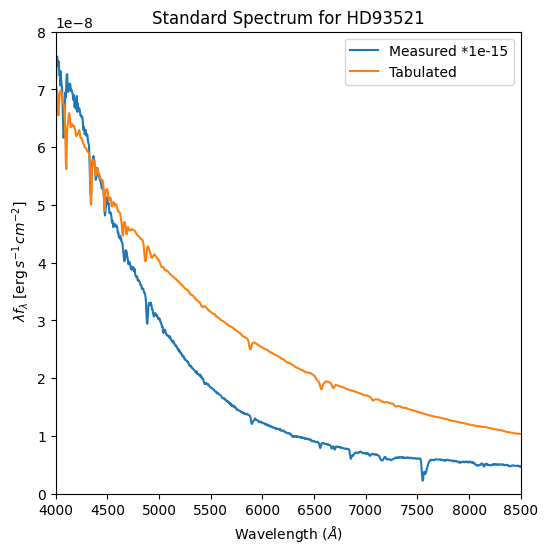

In [ ]:
spec_interp = interp1d(wavelength_cal,flam)(wavelength_array)

plt.figure(figsize=[6,6],dpi=100)
plt.plot(wavelength_array,spec*wavelength_array*1e-15,label='Measured *1e-15')
plt.plot(wavelength_array,spec_interp *wavelength_array,label='Tabulated')
plt.legend()
plt.ylabel(r' $ \lambda f_{\lambda} \; [{\rm erg}\, s^{-1}\,cm^{-2}]$')
plt.title('Standard Spectrum for HD93521')
plt.xlabel(r'Wavelength $(\AA)$')
plt.xlim(4000,8500)
plt.ylim(0,8e-8)


Text(0, 0.5, 'Tabulated/Measured')

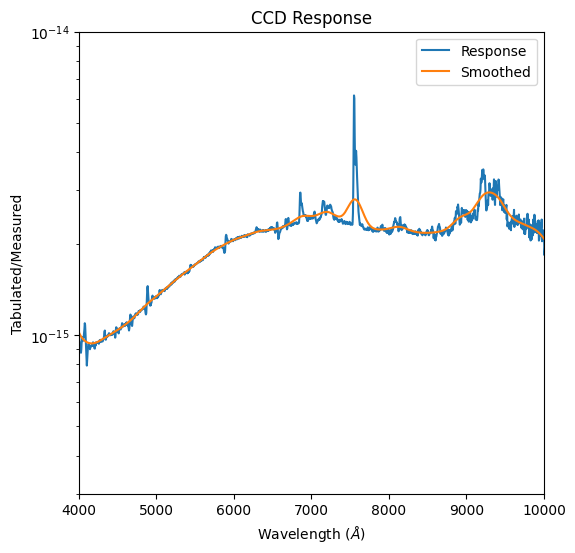

In [ ]:
response_noisy = spec_interp/spec
response = gaussian_filter1d(response_noisy,sigma=20)
plt.figure(figsize=[6,6])
plt.plot(wavelength_array,np.fabs(response_noisy),label='Response')
plt.plot(wavelength_array,np.fabs(response),label='Smoothed')
plt.xlim(4000,10000)
plt.legend()
plt.yscale('log')
plt.ylim(3e-16,1e-14)
plt.title('CCD Response')
plt.xlabel(r'Wavelength $(\AA)$')
plt.ylabel('Tabulated/Measured')

In [ ]:
########################################################################
########################################################################
########################################################################

#smooth_spec = savgol_filter(spec,window_length=300,polyorder=6)
#smooth_tab = savgol_filter(flam,window_length=300,polyorder=6)

smooth_spec = gaussian_filter1d(spec,sigma=20)
smooth_tab = gaussian_filter1d(flam,sigma=20)


plt.figure(figsize=[6,6])
plt.plot(wavelength_array,spec*wavelength_array*1e-15,label='Measured')
plt.plot(wavelength_array,smooth_spec*wavelength_array*1e-15,label='Smoothed')
plt.legend()
plt.title('Measured Spectrum for HD93521')
plt.xlabel(r'Wavelength $(\AA)$')
plt.xlim(1000,8500)
plt.ylim(-1e-9,1.2e-7)




"\nsmooth_spec = gaussian_filter1d(spec,sigma=20)\nsmooth_tab = gaussian_filter1d(flam,sigma=20)\n\n\nplt.figure(figsize=[6,6])\nplt.plot(wavelength_array,spec*wavelength_array*1e-15,label='Measured')\nplt.plot(wavelength_array,smooth_spec*wavelength_array*1e-15,label='Smoothed')\nplt.legend()\nplt.title('Measured Spectrum for HD93521')\nplt.xlabel(r'Wavelength $(\\AA)$')\nplt.xlim(1000,8500)\nplt.ylim(-1e-9,1.2e-7)\n\n"

Then we interpolate the tabulated spectra at the wavelengths we have measured our stellar spectrum. Then we can compute the response correction that we have to apply to every science image as:
$$response = \frac{smooth\,tabulated}{smooth\,measured}$$

In [ ]:

interp_tab = interp1d(wavelength_cal,smooth_tab)(wavelength_array)

response = interp_tab/smooth_spec

plt.figure(figsize=[6,6])
plt.plot(wavelength_array,np.fabs(response))
plt.xlim(4000,10000)
plt.yscale('log')
plt.ylim(3e-16,1e-14)
plt.title('CCD Response')
plt.xlabel(r'Wavelength $(\AA)$')
plt.ylabel('Tabulated/Measured')


"\ninterp_tab = interp1d(wavelength_cal,smooth_tab)(wavelength_array)\n\nresponse = interp_tab/smooth_spec\n\nplt.figure(figsize=[6,6])\nplt.plot(wavelength_array,np.fabs(response))\nplt.xlim(4000,10000)\nplt.yscale('log')\nplt.ylim(3e-16,1e-14)\nplt.title('CCD Response')\nplt.xlabel(r'Wavelength $(\\AA)$')\nplt.ylabel('Tabulated/Measured')\n"

Finally, the wavelength and flux calibrated spectrum is obtained by multiplying the 1D measured spectrum by the response curve.

In [ ]:
plt.figure(figsize=[6,6])
plt.plot(wavelength_array,spec*response*wavelength_array,label='Measured')
plt.plot(wavelength_cal,flam *wavelength_cal,label='Tabulated')
plt.legend()
plt.ylabel(r' $ \lambda f_{\lambda} \; [{\rm erg}\, s^{-1}\,cm^{-2}]$')
plt.title('Standard Spectrum for HD93521')
plt.xlabel(r'Wavelength $(\AA)$')
plt.xlim(4000,8500)
plt.ylim(0,8e-8)

We have all the ingredients to calibrate any other spectrum taken with the G-200 at CAFOS that night.

Let's apply what we have learned to NGC-2392, the Eskimo nebula. In the first image, you will see the nebula as well as the position of the slit. This will help us to understand that the spatial axis really means.

## Continuo aquí

## Continuo aquí

In [141]:
f_slit = base+'/NGC2392/G200/uamA_0100.fits'
slit,_ = read_data(f_slit)
show_image(slit)

FileNotFoundError: [Errno 2] No such file or directory: 'D:\\Documents\\Jupyter Notebooks\\TEA 2025\\Proyecto\\M1\\Datos\\M1 Calar Alto 180216/NGC2392/G200/uamA_0100.fits'

Then we have here the spectrum of the nebula, including also the white dwarf in the center of that planetary nebula.
There are pretty strong emission lines which can be clearly seen in the 2D spectrum.

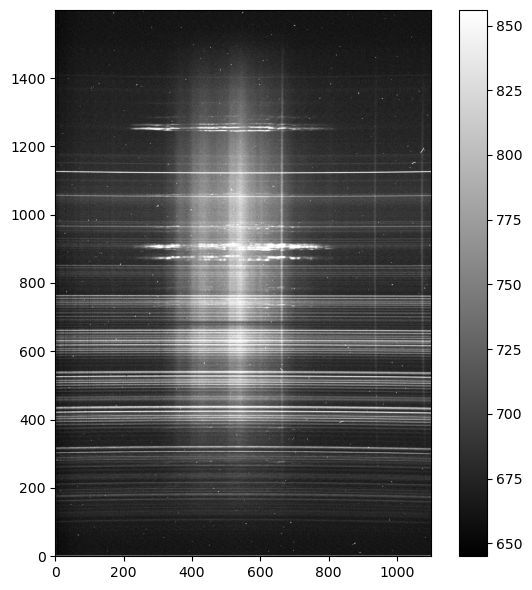

In [123]:
f_neb = base+'/UAM_0017.fits'
neb_spec_raw,header_neb = read_data(f_neb)
texp_neb = header_neb['EXPTIME']
show_image(neb_spec_raw)

So first thing first: let's calibrate the images and get the 1D spectra.

Sacaré un recorte del espectro

In [127]:
def show_image_full(data,vmin=None,vmax=None):
  if vmin is None:
    vmin = np.nanpercentile(data,1)
  if vmax is None:
    vmax = np.nanpercentile(data,99)

  plt.figure(figsize=[6,6],dpi=100)
  plt.imshow(data,vmin=vmin,vmax=vmax,origin='lower',interpolation=None,
             cmap="gray", aspect = 'auto')
  plt.colorbar()
  plt.tight_layout()
  plt.show()
  return None

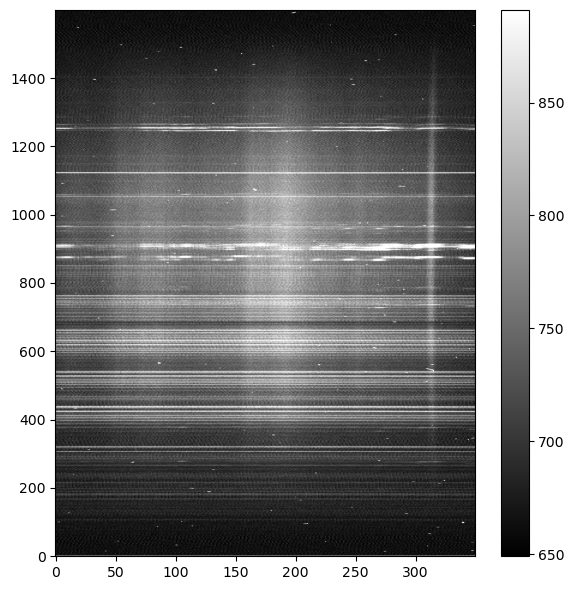

In [129]:
show_image_full(neb_spec_raw[:,350:700])

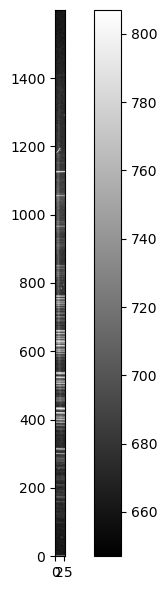

In [130]:
show_image(neb_spec_raw[:,1065:1095])

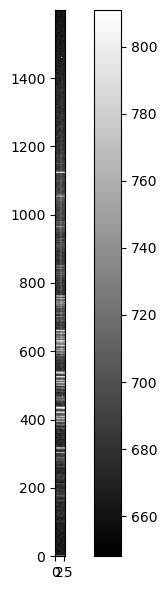

In [132]:
show_image(neb_spec_raw[:,920:950])

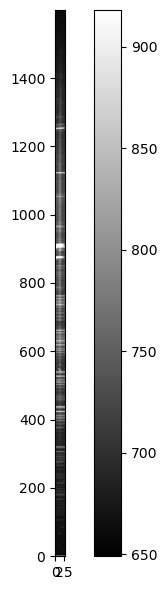

In [134]:
show_image(neb_spec_raw[:,650:680])

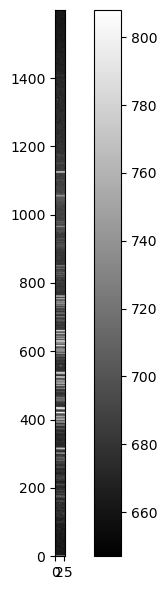

In [137]:
show_image(neb_spec_raw[:,1000:1030])

In [139]:
(neb_spec_raw).shape

(1600, 1100)

In [141]:
master_bias.shape

(1600, 1100)

In [143]:
master_dark.shape

(1700, 1700)

In [145]:
master_dark = master_dark[:1600,:1100]

Sacamos el espectro del cielo

In [148]:
LINEAS_LAB = {
    'O_III_2' : 4959,
    'O_III' : 5007,
    'H_alpha': 6562.8,  # Ejemplo de línea conocida
    'N_II': 6583.4,    # Ejemplo de otra línea conocida
    'S_II': 6717,
    'S_II_2': 6731
    
}
    

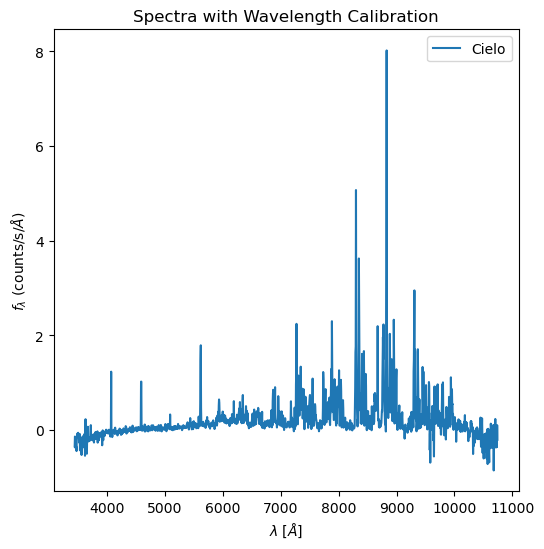

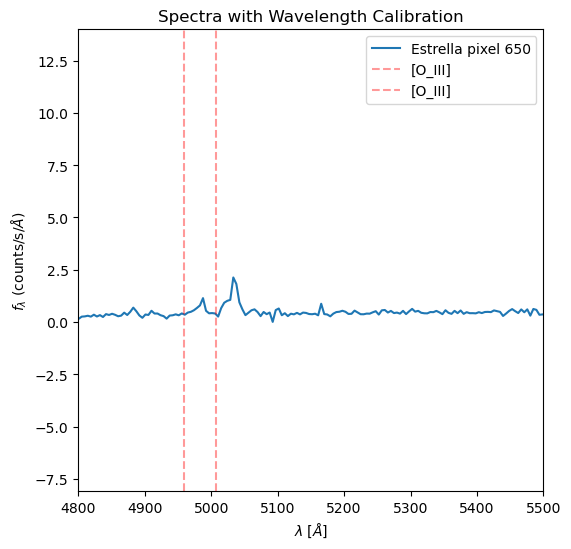

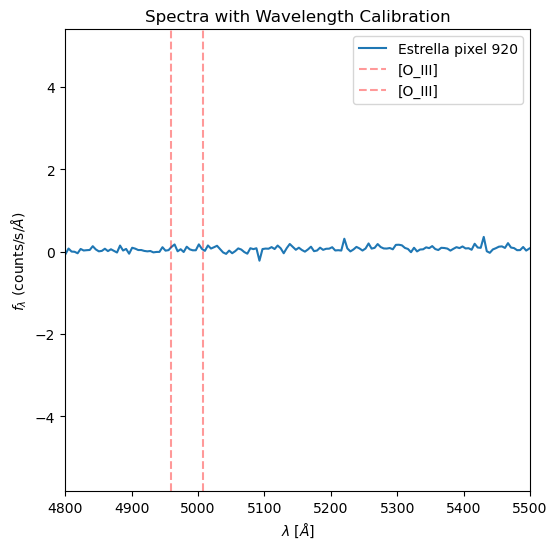

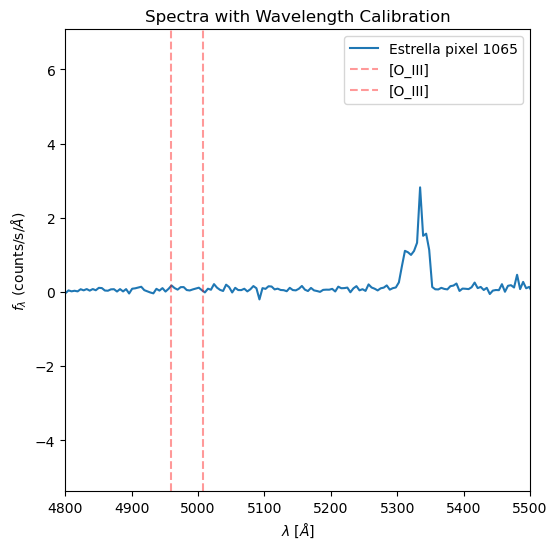

In [150]:
neb_spec_red = neb_spec_raw - master_bias - master_dark
neb_spec_red = neb_spec_red/master_flat_new
neb_spec_red /= texp_neb

star_spec_660 = neb_spec_red[:,660:666]
star_spec_933 = neb_spec_red[:,933:939]
star_spec_1072 = neb_spec_red[:,1072:1078]
sky_spec_6 = neb_spec_red[:,1000:1006]
#neb_spec = neb_spec_red[:,700:705]

#wd_spec = np.sum(wd_spec,axis=1)
#neb_spec = np.sum(neb_spec,axis=1)
sky_spec_6 = np.sum(sky_spec_6, axis=1)
star_spec_660 = np.sum(star_spec_660,axis=1)
star_spec_933 = np.sum(star_spec_933,axis=1)
star_spec_1072 = np.sum(star_spec_1072,axis=1)
star_spec_660 = star_spec_660 - sky_spec_6
star_spec_933 = star_spec_933 - sky_spec_6
star_spec_1072 = star_spec_1072 - sky_spec_6


plt.figure(figsize=[6,6],dpi=100)
#plt.plot(wavelength_array,wd_spec,label='White Dwarf + Nebula')
plt.plot(wavelength_array,sky_spec_6,label='Cielo')
plt.xlabel(r'$\lambda \; [\AA]$')
plt.ylabel(r'$f_{\lambda}$ (counts/s/$\AA$)')
plt.title('Spectra with Wavelength Calibration')
plt.legend()

plt.figure(figsize=[6,6],dpi=100)
#plt.plot(wavelength_array,wd_spec,label='White Dwarf + Nebula')
plt.plot(wavelength_array,star_spec_660,label='Estrella pixel 650')
plt.xlabel(r'$\lambda \; [\AA]$')
plt.ylabel(r'$f_{\lambda}$ (counts/s/$\AA$)')
plt.title('Spectra with Wavelength Calibration')
plt.axvline(6563,color='r',ls='dashed',alpha=0.4)
plt.axvline(6717,color='r',ls='dashed',alpha=0.4)
plt.axvline(6731,color='r',ls='dashed',alpha=0.4)
plt.axvline(6583,color='r',ls='dashed',alpha=0.4)
plt.axvline(4959,color='r',ls='dashed',alpha=0.4, label = '[O_III]')
plt.axvline(5007,color='r',ls='dashed',alpha=0.4, label = '[O_III]')
plt.xlim([4800,5500])
plt.legend()
nombre_archivo = " Espectro_estrella_pixel_650.png" 
ruta_1 = os.path.join("D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Espectro_estrellas", nombre_archivo)
plt.savefig(ruta_1, bbox_inches='tight')

plt.figure(figsize=[6,6],dpi=100)
#plt.plot(wavelength_array,wd_spec,label='White Dwarf + Nebula')
plt.plot(wavelength_array,star_spec_933,label='Estrella pixel 920')
plt.xlabel(r'$\lambda \; [\AA]$')
plt.ylabel(r'$f_{\lambda}$ (counts/s/$\AA$)')
plt.title('Spectra with Wavelength Calibration')
plt.axvline(6563,color='r',ls='dashed',alpha=0.4)
plt.axvline(6717,color='r',ls='dashed',alpha=0.4)
plt.axvline(6731,color='r',ls='dashed',alpha=0.4)
plt.axvline(6583,color='r',ls='dashed',alpha=0.4)
plt.axvline(4959,color='r',ls='dashed',alpha=0.4, label = '[O_III]')
plt.axvline(5007,color='r',ls='dashed',alpha=0.4, label = '[O_III]')
plt.xlim([4800,5500])
plt.legend()
nombre_archivo = " Espectro_estrella_pixel_920.png" 
ruta_2 = os.path.join("D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Espectro_estrellas", nombre_archivo)
plt.savefig(ruta_2, bbox_inches='tight')

plt.figure(figsize=[6,6],dpi=100)
#plt.plot(wavelength_array,wd_spec,label='White Dwarf + Nebula')
plt.plot(wavelength_array,star_spec_1072,label='Estrella pixel 1065')
plt.xlabel(r'$\lambda \; [\AA]$')
plt.ylabel(r'$f_{\lambda}$ (counts/s/$\AA$)')
plt.title('Spectra with Wavelength Calibration')
plt.axvline(6563,color='r',ls='dashed',alpha=0.4)
plt.axvline(6717,color='r',ls='dashed',alpha=0.4)
plt.axvline(6731,color='r',ls='dashed',alpha=0.4)
plt.axvline(6583,color='r',ls='dashed',alpha=0.4)
plt.axvline(4959,color='r',ls='dashed',alpha=0.4, label = '[O_III]')
plt.axvline(5007,color='r',ls='dashed',alpha=0.4, label = '[O_III]')
plt.xlim([4800,5500])
plt.legend()
nombre_archivo = " Espectro_estrella_pixel_1065.png" 
ruta_3 = os.path.join("D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Espectro_estrellas", nombre_archivo)
plt.savefig(ruta_3, bbox_inches='tight')


In [152]:
import numpy as np
import matplotlib.pyplot as plt
import os
import warnings
warnings.filterwarnings('ignore') 
plt.ion() # Permite la ejecución interactiva si es un entorno de notebook

# --- DEFINICIÓN DE LÍNEAS DE REFERENCIA (Completa para incluir el azul y el rojo) ---
LINEAS_LAB = {
    'H_beta': 4861.32,
    '[OIII]_4959': 4959.0,
    '[OIII]_5007': 5007.0,
    '[OI]_6300': 6300.3, # <--- Incluida en el nuevo rango 6100-6900
    '[OI]_6363': 6363.8, # <--- Incluida en el nuevo rango 6100-6900
    '[NII]_6548': 6548.1,
    'H_alpha': 6562.8,
    '[NII]_6584': 6583.4,
    '[SII]_6717': 6716.4,
    '[SII]_6731': 6730.8
}

# --- PARÁMETROS DE PLOTEO UNIFICADOS ---
RANGO_MIN_PLOT = 6100 # Rango solicitado
RANGO_MAX_PLOT = 6900 # Rango solicitado
RUTA_BASE_GUARDADO = r"D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Espectro_estrellas"

# Asegurar que el directorio de guardado existe
os.makedirs(RUTA_BASE_GUARDADO, exist_ok=True)

# ==============================================================================

# ==============================================================================
## 2. FUNCIÓN DE PLOTEO UNIFICADA (MODIFICADA)
# ==============================================================================

def generar_espectro_estelar(data_spec, nombre_plot, nombre_archivo, wavelength_array, lineas_lab, min_lambda, max_lambda):
    """
    Genera y guarda un gráfico para un espectro estelar/cielo específico,
    trazando las líneas de referencia en el rango dado, con leyenda simplificada
    dentro del plot.
    """
    plt.figure(figsize=[10, 6]) # Ajustar tamaño para mejor visualización
    
    # 1. Plotear el Espectro
    plt.plot(wavelength_array, data_spec, label=nombre_plot, color='darkblue', linewidth=0.8)
    
    # --- Trazar Líneas de Referencia y Preparar Leyenda ---
    etiqueta_ref_usada = False
    ETIQUETA_UNICA_REF = 'Referencias Lab ($\lambda_0$)'
    
    # 2. Trazar líneas que caen dentro del rango [min_lambda, max_lambda]
    for nombre, lambda_0 in lineas_lab.items():
        
        if min_lambda <= lambda_0 <= max_lambda:
            
            # Línea de Referencia (Lab) - Rojas discontinuas
            label_ref = ETIQUETA_UNICA_REF if not etiqueta_ref_usada else None
            plt.axvline(x=lambda_0, color='r', linestyle='--', alpha=0.5, label=label_ref)
            etiqueta_ref_usada = True

    # 3. Configuración de Ejes y Títulos
    plt.xlim([min_lambda, max_lambda])
    
    # Ajustar el límite Y
    idx_rango = np.where((wavelength_array >= min_lambda) & (wavelength_array <= max_lambda))
    if len(idx_rango[0]) > 0:
        max_y_rango = np.max(data_spec[idx_rango])
        plt.ylim([0, max_y_rango * 1.2]) 
        
    plt.xlabel(r'$\lambda \; [\AA]$')
    plt.ylabel(r'$f_{\lambda}$ (counts/s/$\AA$)')
    plt.title(f'Espectro {nombre_plot} ($\lambda$: {min_lambda}-{max_lambda} Å)')
    plt.grid(True, linestyle=':')

    # 4. Leyenda SIMPLIFICADA (dentro del plot, sin bbox_to_anchor)
    # Solo incluye la etiqueta del espectro y la etiqueta única de las referencias Lab (si hay líneas en el rango)
    plt.legend(loc='upper right', fontsize='small') # 'upper right' coloca la leyenda dentro del plot
    
    plt.tight_layout()

    # 5. Guardar
    ruta_guardado = os.path.join(RUTA_BASE_GUARDADO, nombre_archivo)
    plt.savefig(ruta_guardado, bbox_inches='tight')
    plt.close()
    print(f"✅ Gráfico guardado: {nombre_archivo} en {RUTA_BASE_GUARDADO}")


# ==============================================================================
## 3. EJECUCIÓN PARA LOS 4 ESPECTROS
# ==============================================================================

try:
    # 1. Cielo
    generar_espectro_estelar(
        sky_spec_6, 
        'Cielo', 
        "Espectro_cielo_6100_6900.png", 
        wavelength_array, 
        LINEAS_LAB, 
        RANGO_MIN_PLOT, 
        RANGO_MAX_PLOT
    )

    # 2. Estrella Pixel 650
    generar_espectro_estelar(
        star_spec_660, 
        'Esectro estrella pixel 660 ', 
        "Espectro_estrella_pixel_660_6100_6900.png", 
        wavelength_array, 
        LINEAS_LAB, 
        RANGO_MIN_PLOT, 
        RANGO_MAX_PLOT
    )

    # 3. Estrella Pixel 920
    generar_espectro_estelar(
        star_spec_933, 
        'Espectro estrella pixel 933 ', 
        "Espectro_estrella_pixel_933_6100_6900.png", 
        wavelength_array, 
        LINEAS_LAB, 
        RANGO_MIN_PLOT, 
        RANGO_MAX_PLOT
    )

    # 4. Estrella Pixel 1065
    generar_espectro_estelar(
        star_spec_1072, 
        'Espectro estrella pixel 1072 ', 
        "Espectro_estrella_pixel_1072_6100_6900.png", 
        wavelength_array, 
        LINEAS_LAB, 
        RANGO_MIN_PLOT, 
        RANGO_MAX_PLOT
    )

except NameError:
    print("\nERROR: Asegúrate de que las variables de datos (sky_spec_6, star_spec_660, star_spec_933, star_spec_1072, y 'wavelength_array') estén definidas y pobladas en el entorno antes de ejecutar este código.")
except Exception as e:
    print(f"\nERROR AL GENERAR LOS GRÁFICOS: {e}")

✅ Gráfico guardado: Espectro_cielo_6100_6900.png en D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Espectro_estrellas
✅ Gráfico guardado: Espectro_estrella_pixel_660_6100_6900.png en D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Espectro_estrellas
✅ Gráfico guardado: Espectro_estrella_pixel_933_6100_6900.png en D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Espectro_estrellas
✅ Gráfico guardado: Espectro_estrella_pixel_1072_6100_6900.png en D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Espectro_estrellas


In [267]:
import numpy as np
import matplotlib.pyplot as plt
import os
import warnings
warnings.filterwarnings('ignore') 
plt.ion()

# --- CONSTANTE DE CONVERSIÓN ---
FACTOR_CONVERSION_ARCSEC = 0.58 # 1 pixel = 0.58''
PIXEL_ORIGEN = 0 # Origen en el Píxel 0 (inicio de la rendija)

# --- DEFINICIÓN DE LÍNEAS DE REFERENCIA (Completa) ---
LINEAS_LAB = {
    'H_beta': 4861.32,
    '[OIII]_4959': 4959.0,
    '[OIII]_5007': 5007.0,
    '[OI]_6300': 6300.3,
    '[OI]_6363': 6363.8,
    '[NII]_6548': 6548.1,
    'H_alpha': 6562.8,
    '[NII]_6584': 6583.4,
    '[SII]_6717': 6716.4,
    '[SII]_6731': 6730.8
}

# --- PARÁMETROS DE PLOTEO AJUSTADOS: AMBOS RANGOS ---
RANGOS_A_PLOTEAR = [
    {'min': 6100, 'max': 6900, 'nombre_region': 'Roja'},
    {'min': 4500, 'max': 6000, 'nombre_region': 'Azul_Verde'}
]
RUTA_BASE_GUARDADO = r"D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Espectro_estrellas"

os.makedirs(RUTA_BASE_GUARDADO, exist_ok=True)

# ==============================================================================
# 1. FUNCIÓN DE CONVERSIÓN DE ARCESG A MINUTOS/SEGUNDOS
# ==============================================================================

def format_arcsec_to_sexagesimal(arcsec_total):
    """Convierte segundos de arco totales a formato x'y''"""
    if arcsec_total == 0:
        return "0' 00.00''"
        
    minutes = int(arcsec_total // 60)
    seconds = arcsec_total % 60
    
    return f"{minutes}' {seconds:.2f}''"

# ==============================================================================
## 2. FUNCIÓN DE PLOTEO UNIFICADA (AJUSTADA PARA EL TÍTULO)
# ==============================================================================

def generar_espectro_estelar(data_spec, nombre_plot, nombre_archivo, wavelength_array, lineas_lab, min_lambda, max_lambda, posicion_sexagesimal):
    """
    Genera y guarda un gráfico para un espectro estelar/cielo específico.
    """
    plt.figure(figsize=[10, 6])
    
    # 1. Plotear Espectro: Usamos el nombre simple para la leyenda (Espectro Estrella/Cielo)
    plt.plot(wavelength_array, data_spec, label=nombre_plot, color='darkblue', linewidth=0.8) 
    
    etiqueta_ref_usada = False
    ETIQUETA_UNICA_REF = 'Referencias Lab ($\lambda_0$)'
    
    for nombre, lambda_0 in lineas_lab.items():
        if min_lambda <= lambda_0 <= max_lambda:
            label_ref = ETIQUETA_UNICA_REF if not etiqueta_ref_usada else None
            plt.axvline(x=lambda_0, color='r', linestyle='--', alpha=0.5, label=label_ref)
            etiqueta_ref_usada = True

    # 3. Configuración de Ejes y Títulos
    plt.xlim([min_lambda, max_lambda])
    
    idx_rango = np.where((wavelength_array >= min_lambda) & (wavelength_array <= max_lambda))
    if len(idx_rango[0]) > 0:
        max_y_rango = np.max(data_spec[idx_rango])
        plt.ylim([0, max_y_rango * 1.2]) 
        
    plt.xlabel(r'$\lambda \; [\AA]$')
    plt.ylabel(r'$f_{\lambda}$ (cuentas/s/$\AA$)') 
    
    # ✅ LÓGICA DE TÍTULO SOLICITADA
    if nombre_plot == 'Espectro Estrella':
        title_base = f"Espectro para la estrella en la posición: {posicion_sexagesimal}"
    elif nombre_plot == 'Espectro Cielo':
        title_base = f"Espectro para el cielo en la posición: {posicion_sexagesimal}"

    # Añadir el rango lambda al final
    plt.title(f'{title_base} ($\lambda$: {min_lambda}-{max_lambda} Å)') 
    
    plt.grid(True, linestyle=':')

    # 4. Leyenda
    plt.legend(loc='upper right', fontsize='small')
    
    plt.tight_layout()

    # 5. Guardar
    ruta_guardado = os.path.join(RUTA_BASE_GUARDADO, nombre_archivo)
    plt.savefig(ruta_guardado, bbox_inches='tight')
    plt.close()
    print(f"✅ Gráfico guardado: {nombre_archivo} en {RUTA_BASE_GUARDADO}")


# ==============================================================================
## 3. EJECUCIÓN PARA LOS 4 ESPECTROS Y LOS 2 RANGOS (8 PLOTS TOTALES)
# ==============================================================================

# --- CALCULAR Y CONVERTIR POSICIONES RELATIVAS (Origen = Píxel 0) ---
def calcular_posicion_arcsec(pixel):
    return (pixel - PIXEL_ORIGEN) * FACTOR_CONVERSION_ARCSEC

POSICEL_MAP = { 
    # Asumo un píxel 6 para el cielo (ej. del borde)
    'sky': 6,
    660: 660,
    933: 933,
    1072: 1072
}

POSICIONES_ARCSEC = {
    p: calcular_posicion_arcsec(p_val) for p, p_val in POSICEL_MAP.items()
}

POSICIONES_SEXAGESIMAL = {
    p: format_arcsec_to_sexagesimal(arcsec) for p, arcsec in POSICIONES_ARCSEC.items()
}

def get_clean_filename_pos(sexagesimal_str):
    """Limpia el string x'y'' para usarlo en el nombre de archivo."""
    # Corrige el error de sintaxis anterior
    return sexagesimal_str.replace("'", '-').replace(' ', '_').replace('.', '_').replace('"', '').replace('-', '_') + "arcseg"


# --- DEFINICIÓN DE ESPECTROS CON LEYENDAS SIMPLIFICADAS ---
ESPECTROS_A_ANALIZAR = [
    # Espectro Cielo (Pixel 6 = 0' 03.48'')
    {'data': 'sky_spec_6', 'nombre_plot_simple': 'Espectro Cielo', 'base_archivo': "Espectro_cielo", 
     'posicion_pixel': 6, 'posicion_sexagesimal': POSICIONES_SEXAGESIMAL['sky']},
    
    # Espectros Estrella
    # 660 (6' 22.80'')
    {'data': 'star_spec_660', 'nombre_plot_simple': 'Espectro Estrella', 'base_archivo': "Espectro_estrella_pos", 
     'posicion_pixel': 660, 'posicion_sexagesimal': POSICIONES_SEXAGESIMAL[660]}, 
    
    # 933 (9' 01.14'')
    {'data': 'star_spec_933', 'nombre_plot_simple': 'Espectro Estrella', 'base_archivo': "Espectro_estrella_pos", 
     'posicion_pixel': 933, 'posicion_sexagesimal': POSICIONES_SEXAGESIMAL[933]},
    
    # 1072 (10' 21.76'')
    {'data': 'star_spec_1072', 'nombre_plot_simple': 'Espectro Estrella', 'base_archivo': "Espectro_estrella_pos", 
     'posicion_pixel': 1072, 'posicion_sexagesimal': POSICIONES_SEXAGESIMAL[1072]}
]

print(f"Iniciando la generación de {len(ESPECTROS_A_ANALIZAR) * len(RANGOS_A_PLOTEAR)} gráficos (4 por región)...")

try:
    for rango in RANGOS_A_PLOTEAR:
        min_l = rango['min']
        max_l = rango['max']
        nombre_reg = rango['nombre_region']
        
        for espectro_info in ESPECTROS_A_ANALIZAR:
            
            data_spec = globals()[espectro_info['data']]
            
            # Construcción del nombre de archivo 
            pos_sex_str = espectro_info['posicion_sexagesimal']
            
            if espectro_info['nombre_plot_simple'] == 'Espectro Cielo':
                 # Para el cielo, el nombre de archivo no incluye la etiqueta 'pos' ni la posición
                 nombre_archivo = f"{espectro_info['base_archivo']}_{min_l}_{max_l}_{nombre_reg}.png"
            else:
                # Para la estrella, incluimos la posición
                pos_filename = get_clean_filename_pos(pos_sex_str)
                nombre_archivo = f"{espectro_info['base_archivo']}_{pos_filename}_{min_l}_{max_l}_{nombre_reg}.png"
            
            generar_espectro_estelar(
                data_spec,
                espectro_info['nombre_plot_simple'],
                nombre_archivo,
                wavelength_array,
                LINEAS_LAB,
                min_l,
                max_l,
                pos_sex_str
            )

except KeyError as e:
    print(f"\nERROR: No se pudo encontrar la variable de espectro '{e}'. Asegúrate de que las variables {', '.join([e['data'] for e in ESPECTROS_A_ANALIZAR])} y 'wavelength_array' estén definidas en el entorno.")
except NameError:
    print(f"\nERROR: Asegúrate de que las variables de datos ({', '.join([e['data'] for e in ESPECTROS_A_ANALIZAR])}) y 'wavelength_array' estén definidas y pobladas en el entorno antes de ejecutar este código.")
except Exception as e:
    print(f"\nERROR AL GENERAR LOS GRÁFICOS: {e}")

Iniciando la generación de 8 gráficos (4 por región)...
✅ Gráfico guardado: Espectro_cielo_6100_6900_Roja.png en D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Espectro_estrellas
✅ Gráfico guardado: Espectro_estrella_pos_6__22_80__arcseg_6100_6900_Roja.png en D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Espectro_estrellas
✅ Gráfico guardado: Espectro_estrella_pos_9__1_14__arcseg_6100_6900_Roja.png en D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Espectro_estrellas
✅ Gráfico guardado: Espectro_estrella_pos_10__21_76__arcseg_6100_6900_Roja.png en D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Espectro_estrellas
✅ Gráfico guardado: Espectro_cielo_4500_6000_Azul_Verde.png en D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Espectro_estrellas
✅ Gráfico guardado: Espectro_estrella_pos_6__22_80__arcseg_4500_6000_Azul_Verde.png en D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Espectro_estrellas
✅ Gráfico guardado: Espectro_estrella_pos_9__1_14__arcseg_4500_6000_Azul_Verde.png en D:\Doc

## Nebulosa entera

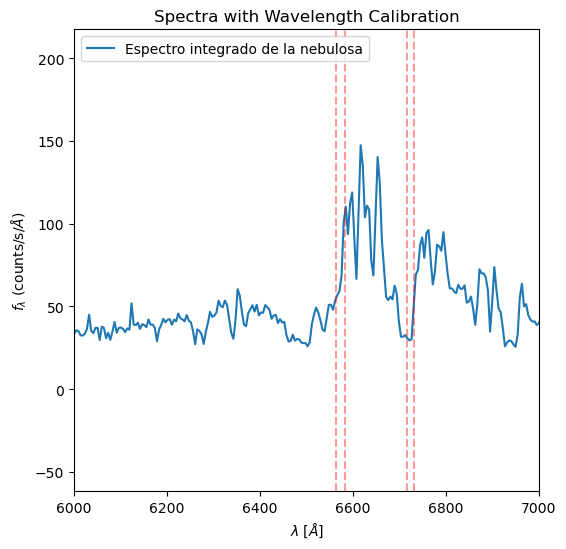

In [154]:
neb_spec_full = neb_spec_red[:,350:700]
sky_neb_spec = neb_spec_red[:,0:350]
neb_spec_full = np.sum(neb_spec_full, axis=1)
sky_neb_spec = np.sum(sky_neb_spec, axis=1)
neb_spec_full = neb_spec_full - sky_neb_spec
plt.figure(figsize=[6,6],dpi=100)
#plt.plot(wavelength_array,wd_spec,label='White Dwarf + Nebula')
plt.plot(wavelength_array,neb_spec_full,label='Espectro integrado de la nebulosa')
plt.xlabel(r'$\lambda \; [\AA]$')
plt.ylabel(r'$f_{\lambda}$ (counts/s/$\AA$)')
plt.title('Spectra with Wavelength Calibration')
plt.axvline(6563,color='r',ls='dashed',alpha=0.4)
plt.axvline(6717,color='r',ls='dashed',alpha=0.4)
plt.axvline(6731,color='r',ls='dashed',alpha=0.4)
plt.axvline(6583,color='r',ls='dashed',alpha=0.4)
plt.xlim([6000,7000])
plt.legend()

In [65]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

# --- CONSTANTES ---
# Velocidad de la luz en km/s
C_LIGHT = 299792.458 

# --- DATOS DE ENTRADA (Reemplaza con tus datos reales) ---
# A: Datos de la gráfica (Eje X)
# wavelength_array = ... 
# B: Datos de la gráfica (Eje Y)
# flux_array = ...

# --- EJEMPLO de DATOS SIMULADOS BASADO EN LA IMAGEN (Ajustar a la Crab Nebula) ---
# Las líneas de emisión principales de la Crab Nebula están cerca de 6583.4 Å ([N II]) y 6562.8 Å (H-alpha).
#wavelength_array = np.linspace(6000, 7000, 500) # Usaré la que ya tengo
# Simular un desplazamiento de +4 Å (alejándose)

# --- 1. DEFINICIÓN DE LÍNEAS DE REFERENCIA (Las discontinuas rojas) ---
# Los valores de laboratorio (en reposo)
LINEAS_LAB = {
    'O_III_2' : 4959,
    'O_III' : 5007,
    'H_alpha': 6562.8,  # Ejemplo de línea conocida
    'N_II': 6583.4,    # Ejemplo de otra línea conocida
    'S_II': 6717,
    'S_II_2': 6731
    
    
    
}
# Lista para almacenar los resultados del cálculo de Vr
resultados_vr = [] 
# --------------------------------------------------------------------------------

## 2. DETECCIÓN DE PICOS Y CÁLCULO DE VR POR LÍNEA ##
for i in range(2): # Quiero generar 2 gráficas centradas en regiones diferentes
    nombre_archivo =  f"espectro_nebulosa_entera_{i}.png"  # :03d formatea el índice a 3 dígitos (ej: 001, 002)
    ruta = os.path.join("D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Espectro_nebulosa_entera", nombre_archivo)
    plt.figure(figsize=(10, 6))
    plt.plot(wavelength_array, neb_spec, label='Espectro Observado')
    
    for nombre, lambda_0 in LINEAS_LAB.items():
        
        # 2a. Definir la Ventana de Búsqueda
        # Buscamos el pico observado solo alrededor de la posición de laboratorio (± 20 Å)
        ventana_min = lambda_0 - 50
        ventana_max = lambda_0 + 50
        
        # Filtrar datos solo en la ventana
        idx_ventana = np.where((wavelength_array >= ventana_min) & (wavelength_array <= ventana_max))
        
        # Si la ventana está vacía, saltar
        if len(idx_ventana[0]) == 0:
            continue
            
        flux_ventana = neb_spec[idx_ventana]
        wave_ventana = wavelength_array[idx_ventana]
        
        # 2b. Detección de Pico
        # Usar un umbral de prominencia (ajustar si es necesario)
        # Buscamos el pico más alto dentro de la ventana
        picos, _ = find_peaks(flux_ventana, prominence=5)
        
        if len(picos) > 0:
            # Encontramos el índice del pico más alto (si hay múltiples)
            idx_pico_max = picos[np.argmax(flux_ventana[picos])]
            
            # Longitud de onda observada del pico
            lambda_obs = wave_ventana[idx_pico_max]
            
            # 2c. Calcular Desplazamiento y Vr
            delta_lambda = lambda_obs - lambda_0
            velocidad_radial = C_LIGHT * (delta_lambda / lambda_0)
            
            resultados_vr.append(velocidad_radial)
    
            # 2d. Marcar y anotar en el Plot
            plt.axvline(lambda_0, color='r', linestyle='--', alpha=0.5, label=f'Ref. {nombre} ({lambda_0:.1f} Å)') ### Para poner las lineas teoricas
            
            # Marcar el pico observado con una 'X'
            #for i in enumerate(lambda_obs):
                #plt.axvline(lambda_obs[i], color='b', linestyle='--', alpha=0.5, label = f"Lineas observadas: {lamda_obs[i]} Å")
    
              
                    
            plt.axvline(
                    x=lambda_obs, 
                    color='k', 
                    linestyle='--', 
                    alpha=0.5,
                    label = f' Linea observada: {lambda_obs: .1f} Å' 
                )
                
            
            plt.scatter(lambda_obs, flux_ventana[idx_pico_max], 
                        marker='x', color='darkgreen', s=100, linewidth=2, 
                        #label=f'Pico Obs. ({lambda_obs:.1f} Å)')
                       )
            plt.annotate(f'$V_r$: {velocidad_radial:.0f} km/s', 
                         xy=(lambda_obs, flux_ventana[idx_pico_max]), 
                         xytext=(lambda_obs + 5, flux_ventana[idx_pico_max] + 5), 
                         fontsize=9, color='darkgreen')
        else:
            print(f"No se detectó pico para {nombre} en la ventana de búsqueda.")
    
    # --- 3. RESULTADOS FINALES ---
    if i == 0:
        plt.xlim([4500,6000])
    else:
        plt.xlim([6500,7500])        
    plt.title("Espectro con Desplazamiento Doppler para la nebulosa entera")
    plt.xlabel("$\lambda$ [Å]")
    plt.ylabel("$f_{\lambda}$ (counts/s/Å)")
    plt.grid(True, linestyle=':')
    plt.legend()
    plt.legend(
        loc='center right',  # La leyenda se ancla desde su centro-izquierda...
        bbox_to_anchor=(1.0, 0.75), # ...a las coordenadas (1.0, 0.5) del plot (justo fuera del borde derecho)
        fontsize='x-small' # Opcional: reducir el tamaño
    )
    plt.savefig(ruta, bbox_inches='tight')
    plt.show()
    plt.close()
    
    if resultados_vr:
        vr_media = np.mean(resultados_vr)
        print("\n----------------------------------------------------")
        print(f"Velocidades radiales individuales: {np.round(resultados_vr, 0)} km/s")
        print(f"VELOCIDAD RADIAL MEDIA (Vr): {vr_media:.0f} km/s (Alejándose si es positivo)")
        print("----------------------------------------------------")

NameError: name 'neb_spec' is not defined

<Figure size 1000x600 with 0 Axes>

## Versión corregida

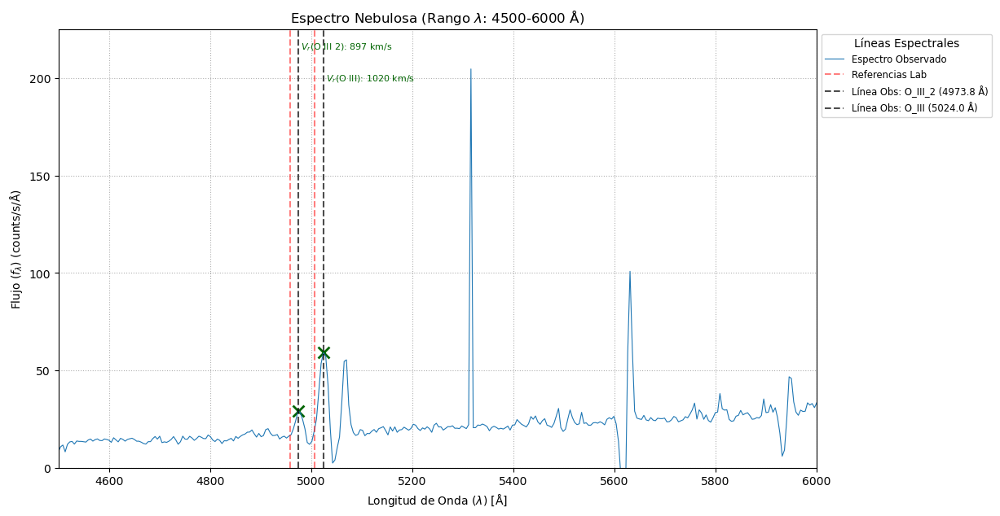


--- Resultados Gráfico 1 (4500-6000 Å) ---
Velocidades radiales detectadas: [ 897. 1020.] km/s
MEDIA de Vr en este rango: 958 km/s


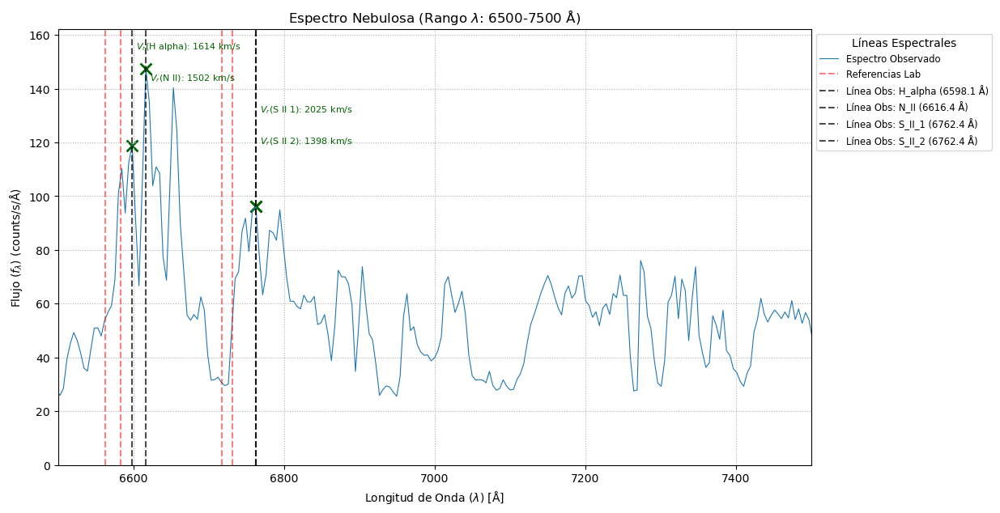


--- Resultados Gráfico 2 (6500-7500 Å) ---
Velocidades radiales detectadas: [1614. 1502. 2025. 1398.] km/s
MEDIA de Vr en este rango: 1635 km/s

VELOCIDAD RADIAL MEDIA GLOBAL (Vr): 1409 km/s


In [1124]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
import os 

# --- CONSTANTES ---
C_LIGHT = 299792.458 # Velocidad de la luz en km/s



# --- DEFINICIÓN DE LÍNEAS DE REFERENCIA ---
LINEAS_LAB = {
    'O_III_2' : 4959.0,
    'O_III' : 5007.0,
    'H_alpha': 6562.8, 
    'N_II': 6583.4,
    'S_II_1': 6717.0,
    'S_II_2': 6731.0
}
# Lista global para el resultado final (media total)
resultados_vr_global = [] 
# --------------------------------------------------------------------------------

rango_graficas = [ (4500, 6000), (6500, 7500) ]
UMBRAL_PROMINENCE = 5 # <--- ¡REVISAR ESTE VALOR SI FALTAN LÍNEAS!

for idx_graph, (rango_min, rango_max) in enumerate(rango_graficas):
    
    nombre_archivo = f"espectro_nebulosa_entera_{idx_graph:03d}.png" 
    ruta = os.path.join(r"D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Espectro_nebulosa_entera", nombre_archivo)
    
    plt.figure(figsize=(12, 7))
    
    etiqueta_ref_usada = False
    ETIQUETA_UNICA_REF = f'Referencias Lab'
    
    # Preparación para el cálculo dinámico de Y
    idx_rango = np.where((wavelength_array >= rango_min) & (wavelength_array <= rango_max))
    max_y_rango = np.max(neb_spec_full[idx_rango])
    
    plt.plot(wavelength_array, neb_spec_full, label='Espectro Observado', linewidth=0.8)
    
    # Lista temporal y contador para el gráfico actual
    velocidades_por_grafico = [] 
    line_counter = 0 # Contador para el offset visual de las anotaciones (reseteado por gráfico)
    
    # 2.3. Detección y Marcado de Picos
    for i, (nombre, lambda_0) in enumerate(LINEAS_LAB.items()):
        
        if lambda_0 < rango_min or lambda_0 > rango_max:
            continue
            
        ventana_min = lambda_0 - 50
        ventana_max = lambda_0 + 50
        
        idx_ventana = np.where((wavelength_array >= ventana_min) & (wavelength_array <= ventana_max))
        
        if len(idx_ventana[0]) == 0:
            continue
            
        flux_ventana = neb_spec_full[idx_ventana]
        wave_ventana = wavelength_array[idx_ventana]
        
        # Detección de Pico (con el umbral de prominencia definido)
        picos, _ = find_peaks(flux_ventana, prominence=UMBRAL_PROMINENCE)
        
        if len(picos) > 0:
            idx_pico_max = picos[np.argmax(flux_ventana[picos])]
            lambda_obs = wave_ventana[idx_pico_max]
            
            delta_lambda = lambda_obs - lambda_0
            velocidad_radial = C_LIGHT * (delta_lambda / lambda_0)
            
            # --- ACUMULACIÓN DE RESULTADOS Y CONTADOR DE PICO ---
            velocidades_por_grafico.append(velocidad_radial) 
            resultados_vr_global.append(velocidad_radial)           
            line_counter += 1 # Solo incrementamos si se detectó un pico
            
            # --------------------------------------------------------
            # 1. Trazar líneas
            # --------------------------------------------------------
            
            # Línea de Referencia (Lab)
            label_ref = ETIQUETA_UNICA_REF if not etiqueta_ref_usada else None
            plt.axvline(x=lambda_0, color='r', linestyle='--', alpha=0.5, label=label_ref)
            etiqueta_ref_usada = True
            
            # Línea Observada (Peak)
            label_obs = f'Línea Obs: {nombre} ({lambda_obs:.1f} Å)'
            # CORRECCIÓN: Estilo punteado negro
            plt.axvline(x=lambda_obs, color='k', linestyle='--', alpha=0.7, label=label_obs)
            
            peak_flux_val = flux_ventana[idx_pico_max]
            
            plt.scatter(lambda_obs, peak_flux_val, marker='x', color='darkgreen', s=100, linewidth=2)
            
            # --------------------------------------------------------
            # 2. ANOTACIÓN CORREGIDA (SOLUCIÓN A LA SUPERPOSICIÓN)
            # --------------------------------------------------------
            
            # 1. Preparar el nombre (reemplazar _ por espacio)
            nombre_anotacion_simple = nombre.replace('_', ' ')
            
            # 2. Crear la anotación Vr (compatible con Mathtext)
            vr_annotation_text = r'$V_r($' + nombre_anotacion_simple + r'$)$: ' + f'{velocidad_radial:.0f} km/s'
            
            # 3. Ajuste de posición Y: Staggered offset (4 posiciones de manera más agresiva)
            # Usamos line_counter para garantizar que solo las líneas detectadas se separen
            # El offset se basa en el máximo Y para evitar que se salga del gráfico
            offset_step = 0.08 # Un paso de 8% del eje Y
            y_offset_factor = 1.05 - ( (line_counter - 1) % 4 ) * offset_step
            
            plt.annotate(
                vr_annotation_text, 
                xy=(lambda_obs, peak_flux_val), 
                # La posición x se mantiene en el pico, la posición y usa el offset calculado
                xytext=(lambda_obs + 5, max_y_rango * y_offset_factor), 
                fontsize=8, 
                color='darkgreen',
            )
    
    # --- 3. RESULTADOS FINALES Y Configuración del Plot ---
    
    plt.xlim([rango_min, rango_max]) 
    plt.ylim([0, max_y_rango * 1.1]) 
    
    plt.title(f"Espectro Nebulosa (Rango $\lambda$: {rango_min}-{rango_max} Å)")
    plt.xlabel(r"Longitud de Onda ($\lambda$) [Å]")
    plt.ylabel(r"Flujo ($f_{\lambda}$) (counts/s/Å)") 

    plt.grid(True, linestyle=':')
    
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0), fontsize='small', title="Líneas Espectrales")
    
    plt.savefig(ruta, bbox_inches='tight')
    plt.show()
    plt.close()
    
    # --- RESULTADOS CONSOLA (Media por gráfico) ---
    if velocidades_por_grafico:
        vr_media = np.mean(velocidades_por_grafico)
        print(f"\n--- Resultados Gráfico {idx_graph+1} ({rango_min}-{rango_max} Å) ---")
        print(f"Velocidades radiales detectadas: {np.round(velocidades_por_grafico, 0)} km/s")
        print(f"MEDIA de Vr en este rango: {vr_media:.0f} km/s")

# --- RESULTADO FINAL GLOBAL (Media total) ---
if resultados_vr_global:
    vr_media_total = np.mean(resultados_vr_global)
    print("\n====================================================")
    print(f"VELOCIDAD RADIAL MEDIA GLOBAL (Vr): {vr_media_total:.0f} km/s")
    print("====================================================")

# Versión final automatizada

In [66]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
import os 
import warnings
warnings.filterwarnings('ignore') # Opcional: para evitar warnings si no se usa find_peaks correctamente

# --- CONSTANTES ---
C_LIGHT = 299792.458 # Velocidad de la luz en km/s


# --- DEFINICIÓN DE LÍNEAS DE REFERENCIA (Actualizado para incluir todas las líneas) ---
LINEAS_LAB = {
    'H_beta': 4861.32,          # Añadida
    'O_III_2': 4959.0,          # [OIII]_4959
    'O_III': 5007.0,            # [OIII]_5007
    'O_I_1': 6300.3,            # [OI]_6300
    'O_I_2': 6363.8,            # [OI]_6363
    'N_II_1': 6548.1,           # [NII]_6548
    'H_alpha': 6562.8,          
    'N_II': 6583.4,             # [NII]_6584
    'S_II_1': 6717.0,           # [SII]_6717
    'S_II_2': 6731.0            # [SII]_6731
}

# Lista global para el resultado final (media total)
resultados_vr_global = [] 
# --------------------------------------------------------------------------------

rango_graficas = [ (4500, 6000), (6500, 7500) ]
UMBRAL_PROMINENCE = 5 # <--- ¡REVISAR ESTE VALOR SI FALTAN LÍNEAS!

for idx_graph, (rango_min, rango_max) in enumerate(rango_graficas):
    
    nombre_archivo = f"espectro_nebulosa_entera_{idx_graph:03d}.png" 
    ruta = os.path.join(r"D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Espectro_nebulosa_entera", nombre_archivo)
    
    plt.figure(figsize=(12, 7))
    
    etiqueta_ref_usada = False
    ETIQUETA_UNICA_REF = 'Referencias Lab ($\lambda_0$)'
    
    # Preparación para el cálculo dinámico de Y
    try:
        idx_rango = np.where((wavelength_array >= rango_min) & (wavelength_array <= rango_max))
        
        if len(idx_rango[0]) == 0:
            plt.close()
            print(f"Advertencia: No hay datos en el rango {rango_min}-{rango_max} Å. Saltando gráfico.")
            continue
            
        max_y_rango = np.max(neb_spec_full[idx_rango])
        
        plt.plot(wavelength_array, neb_spec_full, label='Espectro Observado', linewidth=0.8)
        
    except NameError:
        print("ERROR: Variables de datos (neb_spec_full, wavelength_array) no definidas.")
        break
    
    # Lista para almacenar información detallada de las líneas detectadas para la leyenda
    lineas_detectadas_grafico = []
    velocidades_por_grafico = [] 
    
    # 2.3. Detección y Marcado de Picos
    for i, (nombre, lambda_0) in enumerate(LINEAS_LAB.items()):
        
        if lambda_0 < rango_min or lambda_0 > rango_max:
            continue
            
        # A. LÍNEA DE REFERENCIA (Lab) - Todas (Rojas discontinuas)
        label_ref = ETIQUETA_UNICA_REF if not etiqueta_ref_usada else None
        plt.axvline(x=lambda_0, color='r', linestyle='--', alpha=0.5, label=label_ref)
        etiqueta_ref_usada = True
        
        ventana_min = lambda_0 - 50
        ventana_max = lambda_0 + 50
        
        idx_ventana = np.where((wavelength_array >= ventana_min) & (wavelength_array <= ventana_max))
        
        if len(idx_ventana[0]) == 0:
            continue
            
        flux_ventana = neb_spec_full[idx_ventana]
        wave_ventana = wavelength_array[idx_ventana]
        
        # Detección de Pico (con el umbral de prominencia definido)
        picos, _ = find_peaks(flux_ventana, prominence=UMBRAL_PROMINENCE)
        
        if len(picos) > 0:
            idx_pico_max = picos[np.argmax(flux_ventana[picos])]
            lambda_obs = wave_ventana[idx_pico_max]
            
            delta_lambda = lambda_obs - lambda_0
            velocidad_radial = C_LIGHT * (delta_lambda / lambda_0)
            
            # --- ALMACENAMIENTO DE RESULTADOS PARA LA LEYENDA Y MEDIA ---
            velocidades_por_grafico.append(velocidad_radial) 
            resultados_vr_global.append(velocidad_radial) 
            
            lineas_detectadas_grafico.append({
                'nombre': nombre,
                'lambda_0': lambda_0,
                'lambda_obs': lambda_obs,
                'vr': velocidad_radial
            })
            
            # Línea Observada (Peak)
            plt.axvline(x=lambda_obs, color='k', linestyle=':', alpha=0.9)
            
            peak_flux_val = flux_ventana[idx_pico_max]
            plt.scatter(lambda_obs, peak_flux_val, marker='x', color='darkgreen', s=70, linewidth=1.5, zorder=5)
            
            # 📢 ANOTACIÓN DE V_R ELIMINADA DE LA GRÁFICA

    # --- 3. CONFIGURACIÓN FINAL DEL PLOT Y LEYENDA DETALLADA ---
    
    plt.xlim([rango_min, rango_max]) 
    plt.ylim([0, max_y_rango * 1.25]) # Aumentado el límite Y para dar espacio a la leyenda/título
    
    plt.title(f"Espectro Nebulosa Entera (Rango $\lambda$: {rango_min}-{rango_max} Å)")
    plt.xlabel(r"Longitud de Onda ($\lambda$) [Å]")
    plt.ylabel(r"Flujo ($f_{\lambda}$)") 

    plt.grid(True, linestyle=':')
    
    # 📢 LÓGICA DE LEYENDA DETALLADA (Lambdas y VR)
    
    handles, labels = plt.gca().get_legend_handles_labels()
    
    if lineas_detectadas_grafico:
        # Proxy para la Línea Observada (Picos)
        proxy_obs = plt.Line2D([0], [0], color='k', linestyle=':', alpha=0.9)
        handles.append(proxy_obs)
        labels.append('Líneas Obs. (Picos)')
        
        # Separador / Encabezado
        proxy_header = plt.Line2D([0], [0], linestyle='None', marker='None', 
                                  label='--- Valores de Velocidad Radial ($V_r$) ---')
        handles.append(proxy_header)
        labels.append('--- Valores de Velocidad Radial ($V_r$) ---')
        
        # Lista detallada de cada pico detectado
        for item in lineas_detectadas_grafico:
            # Reemplazar los '_' por espacios para el nombre en la leyenda
            nombre_formateado = item['nombre'].replace('_', ' ')
            
            label_completo = (
                f'{nombre_formateado}: '
                r'$\lambda_0=$' f'{item["lambda_0"]:.1f} Å, '
                r'$\lambda_{obs}=$' f'{item["lambda_obs"]:.1f} Å, '
                r'$V_r=$' f'{item["vr"]:.0f} km/s' 
            )
            
            # Proxy para la entrada detallada (sin línea ni marcador)
            proxy_detail = plt.Line2D([0], [0], linestyle='None', marker='None', label=label_completo) 
            handles.append(proxy_detail)
            labels.append(label_completo)

    
    plt.legend(handles, labels, loc='upper left', 
               bbox_to_anchor=(1.0, 1.0), fontsize='small', title="Líneas Espectrales")
    
    # Crear la ruta de guardado si no existe
    try:
        os.makedirs(os.path.dirname(ruta), exist_ok=True)
        plt.savefig(ruta, bbox_inches='tight')
        print(f"Gráfico guardado en: {ruta}")
    except Exception as e:
        print(f"ERROR AL GUARDAR {nombre_archivo}: {e}")
        
    # plt.show() # Descomentar para ver el gráfico en tiempo real
    plt.close()
    
    # --- RESULTADOS CONSOLA (Media por gráfico) ---
    if velocidades_por_grafico:
        vr_media = np.mean(velocidades_por_grafico)
        print(f"\n--- Resultados Gráfico {idx_graph+1} ({rango_min}-{rango_max} Å) ---")
        # Mostrar VR por línea detectada en la consola
        print("Vr por línea (km/s):")
        for item in lineas_detectadas_grafico:
             print(f"  - {item['nombre']}: {item['vr']:.0f}")
        print(f"MEDIA de Vr en este rango: {vr_media:.0f} km/s")

# --- RESULTADO FINAL GLOBAL (Media total) ---
if resultados_vr_global:
    vr_media_total = np.mean(resultados_vr_global)
    print("\n====================================================")
    print(f"VELOCIDAD RADIAL MEDIA GLOBAL (Vr): {vr_media_total:.0f} km/s")
    print("====================================================")

Gráfico guardado en: D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Espectro_nebulosa_entera\espectro_nebulosa_entera_000.png

--- Resultados Gráfico 1 (4500-6000 Å) ---
Vr por línea (km/s):
  - O_III_2: 897
  - O_III: 1020
MEDIA de Vr en este rango: 958 km/s
Gráfico guardado en: D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Espectro_nebulosa_entera\espectro_nebulosa_entera_001.png

--- Resultados Gráfico 2 (6500-7500 Å) ---
Vr por línea (km/s):
  - N_II_1: 1664
  - H_alpha: 1614
  - N_II: 1502
  - S_II_1: 2025
  - S_II_2: 1398
MEDIA de Vr en este rango: 1640 km/s

VELOCIDAD RADIAL MEDIA GLOBAL (Vr): 1446 km/s




# $\textbf{Versión final moviendo las lineas a ojo}$

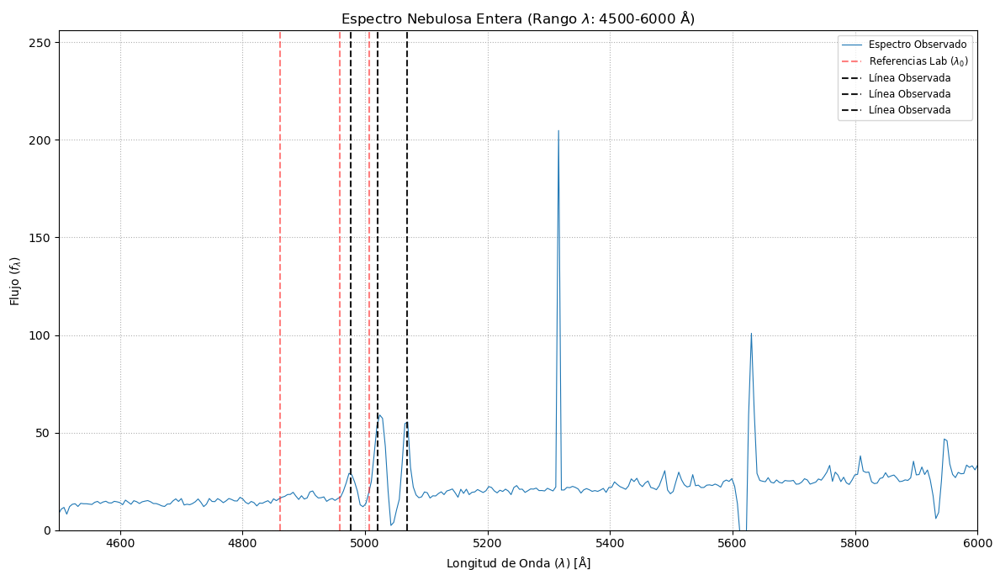

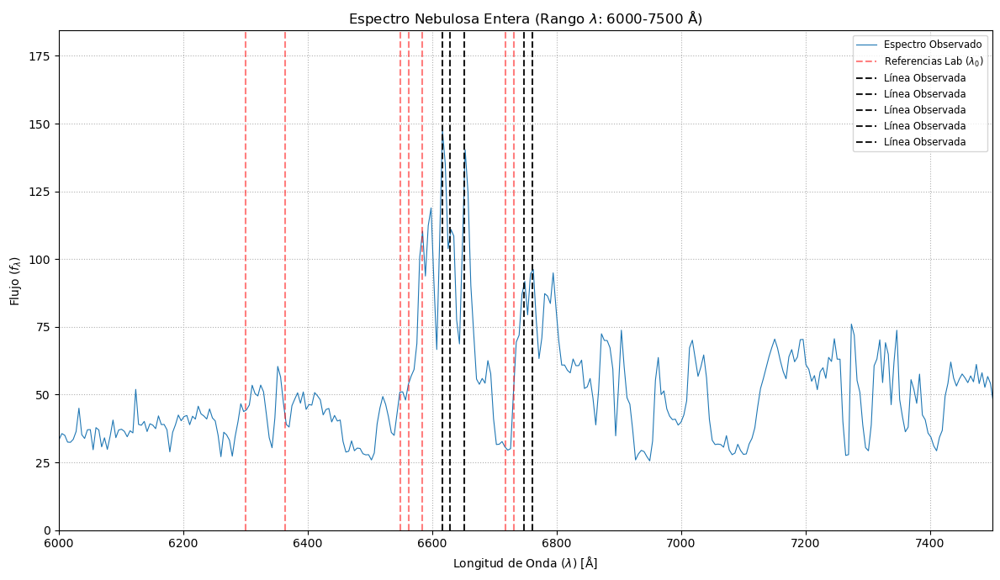

In [298]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
import os 
import warnings
warnings.filterwarnings('ignore')

# --- CONSTANTES ---
C_LIGHT = 299792.458 # Velocidad de la luz en km/s


# --- DEFINICIÓN DE LÍNEAS DE REFERENCIA ---
LINEAS_LAB = {
    'H_beta': 4861.32, 
    'O_III_2': 4959.0, 
    'O_III': 5007.0, 
    'O_I_1': 6300.3, 
    'O_I_2': 6363.8, 
    'N_II': 6548.1, 
    'H_alpha': 6562.8, 
    'N_II_2': 6583.4, 
    'S_II_1': 6717.0, 
    'S_II_2': 6731.0 
}

rango_graficas = [ (4500, 6000), (6000, 7500) ]
UMBRAL_PROMINENCE = 5 

# ⚠️ ADVERTENCIA: Asegúrate de que las variables 'wavelength_array' y 'neb_spec_full'
# estén definidas y cargadas con tus datos antes de ejecutar este bucle.
# Por ejemplo:
# wavelength_array = ...
# neb_spec_full = ...

for idx_graph, (rango_min, rango_max) in enumerate(rango_graficas):
    
    plt.figure(figsize=(12, 7))
    
    etiqueta_ref_usada = False
    ETIQUETA_UNICA_REF = 'Referencias Lab ($\lambda_0$)'
    
    try:
        idx_rango = np.where((wavelength_array >= rango_min) & (wavelength_array <= rango_max))
        
        if len(idx_rango[0]) == 0:
            plt.close()
            print(f"Advertencia: No hay datos en el rango {rango_min}-{rango_max} Å. Saltando gráfico.")
            continue
            
        max_y_rango = np.max(neb_spec_full[idx_rango])
        
        # 1. Plotear el Espectro Observado
        plt.plot(wavelength_array, neb_spec_full, label='Espectro Observado', linewidth=0.8)
        
    except NameError:
        print("ERROR: Variables de datos (neb_spec_full, wavelength_array) no definidas.")
        break
    
    # 2. Plotear SÓLO las Líneas de Referencia (Lab)
    for nombre, lambda_0 in LINEAS_LAB.items():
        
        if lambda_0 < rango_min or lambda_0 > rango_max:
            continue
            
        # A. LÍNEA DE REFERENCIA (Lab) - Rojas Discontinuas
        label_ref = ETIQUETA_UNICA_REF if not etiqueta_ref_usada else None
        plt.axvline(x=lambda_0, color='r', linestyle='--', alpha=0.5, label=label_ref)
        etiqueta_ref_usada = True
        
    
    # --------------------------------------------------------------------------
    # 📢 BLOQUE PARA DETECCIÓN VISUAL (COMENTADO)
    # --- DESCOMENTA ESTAS LÍNEAS PARA PLOTEAR LÍNEAS NEGRAS DE REFERENCIA ---
    # --------------------------------------------------------------------------
    
    # Ejemplo para el primer gráfico (4500-6000 Å):
    if 4500 <= rango_min < 6000:
        a = 115
        b = 62 
        lambda_obs__hbeta = 4861.32 + a # <--- CAMBIA ESTE VALOR A TU LECTURA VISUAL
        plt.axvline(x=lambda_obs__hbeta, color='k', linestyle='--', linewidth=1.5, alpha=0.9, label='Línea Observada')
        lambda_obs__o3 = 4959.0 + b # <--- CAMBIA ESTE VALOR A TU LECTURA VISUAL
        plt.axvline(x=lambda_obs__o3, color='k', linestyle='--', linewidth=1.5, alpha=0.9, label='Línea Observada')
        lambda_obs__o3_2 = 5007.0 + b # <--- CAMBIA ESTE VALOR A TU LECTURA VISUAL
        plt.axvline(x=lambda_obs__o3_2, color='k', linestyle='--', linewidth=1.5, alpha=0.9, label='Línea Observada')
    
    # Ejemplo para el segundo gráfico (6500-7500 Å):
    if 6000 <= rango_min < 7500:
         a = 30
         b = 68
         c = 65
         d = 30
         #lambda_obs_o1_1 = LINEAS_LAB.get('O_I_1') + a # <--- CAMBIA ESTE VALOR A TU LECTURA VISUAL
         #plt.axvline(x=lambda_obs_o1_1, color='k', linestyle='--', linewidth=1.5, alpha=0.9, label='Línea Observada')
         #lambda_obs_o1_2 = LINEAS_LAB.get('O_I_2') + a # <--- CAMBIA ESTE VALOR A TU LECTURA VISUAL
         #plt.axvline(x=lambda_obs_o1_2, color='k', linestyle='--', linewidth=1.5, alpha=0.9, label='Línea Observada')
         lambda_obs_n2_1 = LINEAS_LAB.get('N_II') + b # <--- CAMBIA ESTE VALOR A TU LECTURA VISUAL
         plt.axvline(x=lambda_obs_n2_1, color='k', linestyle='--', linewidth=1.5, alpha=0.9, label='Línea Observada')
         lambda_obs_n2_2 = LINEAS_LAB.get('N_II_2') + b # <--- CAMBIA ESTE VALOR A TU LECTURA VISUAL
         plt.axvline(x=lambda_obs_n2_2, color='k', linestyle='--', linewidth=1.5, alpha=0.9, label='Línea Observada')
         lambda_obs_halfa = LINEAS_LAB.get('H_alpha') + c # <--- CAMBIA ESTE VALOR A TU LECTURA VISUAL
         plt.axvline(x=lambda_obs_halfa, color='k', linestyle='--', linewidth=1.5, alpha=0.9, label='Línea Observada')
         lambda_obs_s2_1 = LINEAS_LAB.get('S_II_1') + d # <--- CAMBIA ESTE VALOR A TU LECTURA VISUAL
         plt.axvline(x=lambda_obs_s2_1, color='k', linestyle='--', linewidth=1.5, alpha=0.9, label='Línea Observada')
         lambda_obs_s2_2 = LINEAS_LAB.get('S_II_2') + d # <--- CAMBIA ESTE VALOR A TU LECTURA VISUAL
         plt.axvline(x=lambda_obs_s2_2, color='k', linestyle='--', linewidth=1.5, alpha=0.9, label='Línea Observada')


    # --------------------------------------------------------------------------


    # --- 3. CONFIGURACIÓN FINAL DEL PLOT ---
    
    plt.xlim([rango_min, rango_max]) 
    plt.ylim([0, max_y_rango * 1.25]) 
    
    plt.title(f"Espectro Nebulosa Entera (Rango $\lambda$: {rango_min}-{rango_max} Å)")
    plt.xlabel(r"Longitud de Onda ($\lambda$) [Å]")
    plt.ylabel(r"Flujo ($f_{\lambda}$)") 
    

    plt.grid(True, linestyle=':')
    
    # Leyenda simplificada: solo Espectro Observado y Referencias Lab
    plt.legend(loc='upper right', fontsize='small')
    
    plt.tight_layout(rect=[0, 0, 1, 1]) 
     
        
    plt.show() # 🖼️ Muestra el gráfico
    plt.close()
    
# Se han eliminado todos los prints de resultados de consola, manteniendo el enfoque visual.

✅ Gráfico guardado: D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Espectro_nebulosa_entera\espectro_4500-6000.png


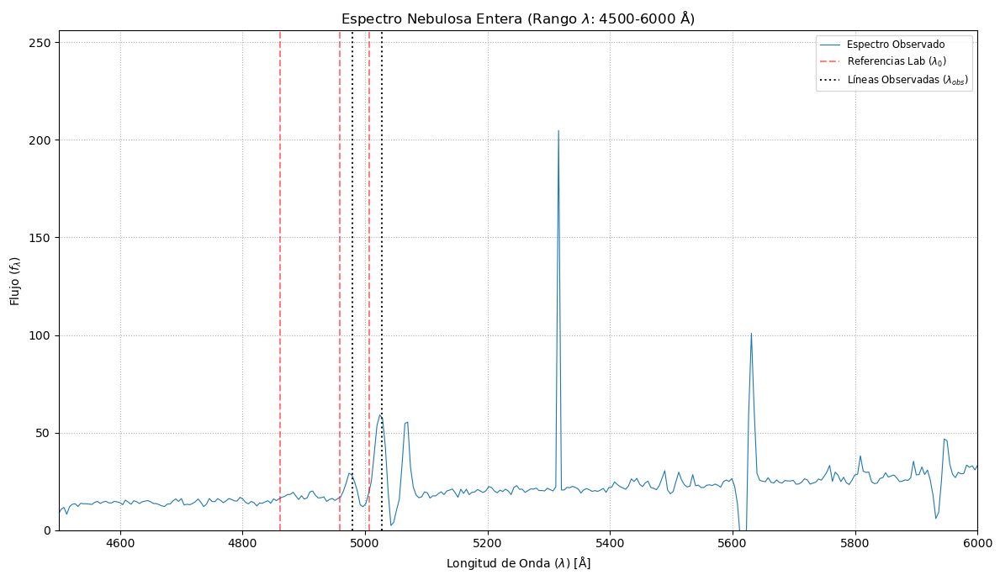

✅ Gráfico guardado: D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Espectro_nebulosa_entera\espectro_6000-7500.png


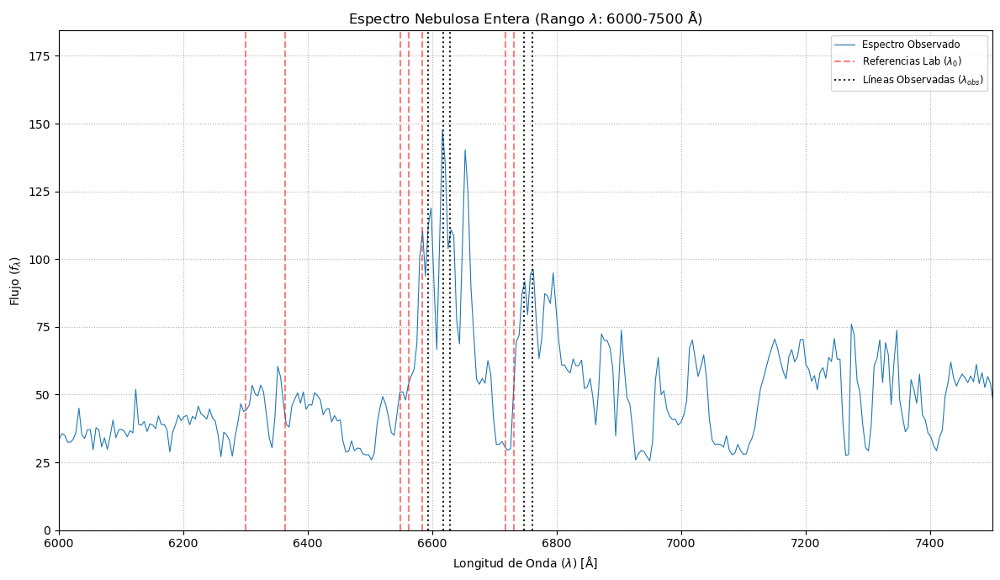


             CÁLCULOS DE VELOCIDAD RADIAL MEDIA
Velocidades individuales [km/s]:
  O_III_2 : v = 1209.08 ± 302.27
  O_III   : v = 1197.49 ± 299.37
  N_II    : v = 2060.24 ± 228.92
  H_alpha : v = 2512.43 ± 228.40
  N_II_2  : v = 2049.19 ± 227.69
  S_II_1  : v = 1338.96 ± 223.16
  S_II_2  : v = 1336.17 ± 222.70

--------------------------------------------------
Número de líneas usadas: 7
Velocidad Media Radial (Ponderada):
V_radial = 1730.18 ± 91.33 km/s
--------------------------------------------------

Resultado Final: $V_{radial} = (1730.18 \pm 91.33)\ 	ext{km/s}$


In [158]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
import os
import warnings
import csv
import math # Importamos math
# import pandas as pd # No es necesario para este bloque
warnings.filterwarnings('ignore')
plt.ion()

# --- RUTA DE GUARDADO ---
# Reemplaza esta ruta con tu ruta base
RUTA_BASE_DESEADA = r"D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Espectro_nebulosa_entera"
# Asegurarse de que la carpeta exista
os.makedirs(RUTA_BASE_DESEADA, exist_ok=True)
# Definición de la variable faltante
GRAFICOS_OUTPUT_DIR = RUTA_BASE_DESEADA

# --- CONSTANTES ---
C_LIGHT = 299792.458 # Velocidad de la luz en km/s (¡No cambiar!)


# --- DEFINICIÓN DE LÍNEAS DE REFERENCIA ---
LINEAS_LAB = {
    'H_beta': 4861.32, 
    'O_III_2': 4959.0, 
    'O_III': 5007.0, 
    'O_I_1': 6300.3, 
    'O_I_2': 6363.8, 
    'N_II': 6548.1, 
    'H_alpha': 6562.8, 
    'N_II_2': 6583.4, 
    'S_II_1': 6717.0, 
    'S_II_2': 6731.0 
}

rango_graficas = [ (4500, 6000), (6000, 7500) ]
UMBRAL_PROMINENCE = 5 

# --- CONSOLIDACIÓN DE DESPLAZAMIENTOS VISUALES (Tus valores) ---
# Si el valor es 0, la línea observada no se ploteará y no se usará en el cálculo.
DESPLAZAMIENTOS = {
    # Primer Rango
    'H_beta': 0,
    'O_III_2': 20,
    'O_III': 20,
    # Segundo Rango
    'O_I_1': 0,
    'O_I_2': 0, 
    'N_II': 45,
    'N_II_2': 45,
    'H_alpha': 55,
    'S_II_1': 30,
    'S_II_2': 30,
}
# --------------------------------------------------------------------------

# --- PARÁMETROS DE ERROR ---
ERROR_LAMBDA_OBS = 5.0 # Error aproximado en la determinación de lambda_obs [Å]


# ⚠️ ADVERTENCIA: Asegúrate de que las variables 'wavelength_array' y 'neb_spec_full'
# estén definidas y cargadas con tus datos antes de ejecutar este bucle.

# Inicializar lista para recopilar las velocidades y sus errores
velocidades_individuales = []


for idx_graph, (rango_min, rango_max) in enumerate(rango_graficas):
    
    plt.figure(figsize=(12, 7))
    
    etiqueta_ref_usada = False
    ETIQUETA_UNICA_REF = 'Referencias Lab ($\lambda_0$)'
    etiqueta_obs_usada = False
    ETIQUETA_UNICA_OBS = 'Líneas Observadas ($\lambda_{obs}$)'
    
    try:
        # Nota: Asumimos que wavelength_array y neb_spec_full están definidos correctamente aquí
        idx_rango = np.where((wavelength_array >= rango_min) & (wavelength_array <= rango_max))
        
        if len(idx_rango[0]) == 0:
            plt.close()
            print(f"Advertencia: No hay datos en el rango {rango_min}-{rango_max} Å. Saltando gráfico.")
            continue
            
        max_y_rango = np.max(neb_spec_full[idx_rango])
        
        # 1. Plotear el Espectro Observado
        plt.plot(wavelength_array, neb_spec_full, label='Espectro Observado', linewidth=0.8)
        
    except NameError:
        print("ERROR: Variables de datos (neb_spec_full, wavelength_array) no definidas. Terminando el loop de plots.")
        break
    
    # 2. Plotear Líneas de Referencia (Lab) - Rojas Discontinuas
    for nombre, lambda_0 in LINEAS_LAB.items():
        if lambda_0 < rango_min or lambda_0 > rango_max:
            continue
            
        label_ref = ETIQUETA_UNICA_REF if not etiqueta_ref_usada else None
        plt.axvline(x=lambda_0, color='r', linestyle='--', alpha=0.5, label=label_ref)
        etiqueta_ref_usada = True
    
    
    # --------------------------------------------------------------------------
    # 📢 BLOQUE PARA PLOTEAR LÍNEAS OBSERVADAS Y CALCULAR V INDIVIDUALES
    # --------------------------------------------------------------------------
    
    lineas_a_plotear = []
    
    # Recopilar las líneas con desplazamiento que caen en el rango actual
    for nombre, lambda_0 in LINEAS_LAB.items():
        if rango_min <= lambda_0 < rango_max and nombre in DESPLAZAMIENTOS:
            desplazamiento = DESPLAZAMIENTOS[nombre]
            
            # Condición: Solo procesar si el desplazamiento no es 0
            if desplazamiento != 0: 
                lambda_obs = lambda_0 + desplazamiento
                
                # --- CÁLCULO DE VELOCIDAD INDIVIDUAL ---
                
                # 1. Velocidad Doppler no relativista: v = c * (Delta_lambda / lambda_0)
                v = C_LIGHT * (desplazamiento / lambda_0)
                
                # 2. Propagación de Error: Delta_v = v * (Delta_lambda_obs / Delta_lambda)
                # NOTA: Error en Delta_lambda es igual a Error en lambda_obs
                # Delta_v = C_LIGHT * (Delta_lambda_obs / lambda_0)
                
                # Usamos la definición de propagación de error:
                # v = c * f(lambda_obs, lambda_0) donde f = (lambda_obs - lambda_0) / lambda_0
                # Delta_v = |derivada(v) respecto a lambda_obs| * Delta_lambda_obs
                # Derivada(v) respecto a lambda_obs = c / lambda_0
                
                delta_v = C_LIGHT * (ERROR_LAMBDA_OBS / lambda_0)
                
                velocidades_individuales.append({
                    'Elemento': nombre,
                    'v': v,
                    'Delta_v': delta_v
                })
                
                # --- Fin del Cálculo ---
                
                lineas_a_plotear.append((nombre, lambda_0, desplazamiento, lambda_obs))
    
    # Plotear las líneas observadas
    for nombre, lambda_0, desplazamiento, lambda_obs in lineas_a_plotear:
        
        label_obs = ETIQUETA_UNICA_OBS if not etiqueta_obs_usada else None
        
        # Las líneas observadas son negras punteadas (linestyle=':')
        plt.axvline(x=lambda_obs, color='k', linestyle=':', linewidth=1.5, alpha=0.9, label=label_obs)
        etiqueta_obs_usada = True

    # --------------------------------------------------------------------------

    # --- 3. CONFIGURACIÓN FINAL DEL PLOT ---
    
    plt.xlim([rango_min, rango_max]) 
    plt.ylim([0, max_y_rango * 1.25]) 
    
    titulo_plot = f"Espectro Nebulosa Entera (Rango $\lambda$: {rango_min}-{rango_max} Å)"
    plt.title(titulo_plot)
    plt.xlabel(r"Longitud de Onda ($\lambda$) [Å]")
    plt.ylabel(r"Flujo ($f_{\lambda}$)") 
    
    plt.grid(True, linestyle=':')
    
    # Leyenda simplificada
    plt.legend(loc='upper right', fontsize='small')
    plt.tight_layout(rect=[0, 0, 1, 1]) 
    
    # 💾 Guardar el gráfico
    nombre_archivo = f"espectro_{rango_min}-{rango_max}.png"
    ruta_guardado_png = os.path.join(GRAFICOS_OUTPUT_DIR, nombre_archivo)
    plt.savefig(ruta_guardado_png, dpi=300)
    print(f"✅ Gráfico guardado: {ruta_guardado_png}")
    
    plt.show() 
    plt.close()

# ==============================================================================
# 4. 📈 CÁLCULO DE VELOCIDAD MEDIA Y ERROR
# ==============================================================================

print("\n" + "="*70)
print("             CÁLCULOS DE VELOCIDAD RADIAL MEDIA")
print("="*70)

if not velocidades_individuales:
    print("Advertencia: No se encontraron líneas con desplazamiento (Delta_lambda != 0) para calcular la velocidad.")
else:
    # Convertir a arrays para cálculos de NumPy
    v_array = np.array([item['v'] for item in velocidades_individuales])
    dv_array = np.array([item['Delta_v'] for item in velocidades_individuales])
    
    # ------------------------------------------------------------------
    # Cálculo de la Media Ponderada (Recomendado para errores variables)
    # ------------------------------------------------------------------
    
    # Pesos (w) son inversamente proporcionales al cuadrado del error (1 / Delta_v^2)
    weights = 1 / dv_array**2
    
    # Velocidad Media Ponderada
    v_media_ponderada = np.sum(v_array * weights) / np.sum(weights)
    
    # Error de la Media Ponderada (Error en la Media de la Media Ponderada)
    # Delta_v_media = 1 / sqrt(Sum(1 / Delta_v^2)) = 1 / sqrt(Sum(weights))
    delta_v_media = np.sqrt(1 / np.sum(weights))
    
    # ------------------------------------------------------------------
    # Resultados
    # ------------------------------------------------------------------

    print("Velocidades individuales [km/s]:")
    for item in velocidades_individuales:
        print(f"  {item['Elemento']:<8}: v = {item['v']:.2f} ± {item['Delta_v']:.2f}")

    print("\n--------------------------------------------------")
    print(f"Número de líneas usadas: {len(v_array)}")
    print(f"Velocidad Media Radial (Ponderada):")
    print(f"V_radial = {v_media_ponderada:.2f} ± {delta_v_media:.2f} km/s")
    print("--------------------------------------------------")
    
    # --- LÍNEA SOLICITADA ---
    print(f"\nResultado Final: $V_{{radial}} = ({v_media_ponderada:.2f} \pm {delta_v_media:.2f})\ \text{{km/s}}$")

In [162]:
import pandas as pd

# 4. 📝 GENERACIÓN DE ARCHIVO CSV USANDO PANDAS 🚀
# ==============================================================================

NOMBRE_ARCHIVO_CSV = "desplazamiento_espectros_nebulosa_entera.csv"
RUTA_BASE_DESEADA = r"D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Espectro_nebulosa_entera" 
os.makedirs(RUTA_BASE_DESEADA, exist_ok=True)
RUTA_GUARDADO_CSV = os.path.join(RUTA_BASE_DESEADA, NOMBRE_ARCHIVO_CSV)

# --- Creación del DataFrame de Pandas ---
data = {
    'Elemento': [],
    'Lambda_Laboratorio (Ang)': [],
    'Lambda_Observada (Ang)': []
}

for nombre, lambda_lab in LINEAS_LAB.items():
    if nombre in DESPLAZAMIENTOS:
        desplazamiento = DESPLAZAMIENTOS[nombre]
        lambda_obs = lambda_lab + desplazamiento
        
        data['Elemento'].append(nombre)
        data['Lambda_Laboratorio (Ang)'].append(f"{lambda_lab:.4f}")
        data['Lambda_Observada (Ang)'].append(f"{lambda_obs:.4f}")

df = pd.DataFrame(data)

# --- Exportación a CSV ---
try:
    # Utilizamos el método .to_csv(). key arguments:
    # sep=';'  -> Forzamos el punto y coma para Excel (si la coma falla).
    # index=False -> Para no incluir la columna numérica del índice de Pandas.
    df.to_csv(RUTA_GUARDADO_CSV, sep=';', index=False, encoding='utf-8')
    
    print("\n=================================================================")
    print(f"✅ Archivo CSV generado CORRECTAMENTE con Pandas: {NOMBRE_ARCHIVO_CSV}")
    print(f"Ruta de guardado: {RUTA_GUARDADO_CSV}")
    print("Nota: Usa PUNTO Y COMA (;) como separador para asegurar la separación en columnas.")
    print("=================================================================")

except Exception as e:
    print(f"\n❌ ERROR al escribir el archivo CSV con Pandas: {e}")


✅ Archivo CSV generado CORRECTAMENTE con Pandas: desplazamiento_espectros_nebulosa_entera.csv
Ruta de guardado: D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Espectro_nebulosa_entera\desplazamiento_espectros_nebulosa_entera.csv
Nota: Usa PUNTO Y COMA (;) como separador para asegurar la separación en columnas.


## Ahora sacaré para regiones de la nebulosa

In [67]:
peaks_tot = []
sky_spec_30 = neb_spec_red[:,1000:1030]
sky_spec_30 = np.sum(sky_spec_30, axis = 1)
for i in range(9):
    spec = neb_spec_red[:,400 + 50*i: 430 + 50*i]
    spec =  np.sum(spec,axis=1)
    spec = spec- sky_spec
    plt.figure(figsize=[6,6],dpi=100)
    plt.plot(wavelength_array,spec)
    plt.axvline(6563,color='r',ls='dashed',alpha=0.4)
    plt.axvline(6717,color='r',ls='dashed',alpha=0.4)
    plt.axvline(6731,color='r',ls='dashed',alpha=0.4)
    plt.axvline(6583,color='r',ls='dashed',alpha=0.4)
    plt.xlim([6000,7000])
    plt.ylim([-10,max(spec) + 10])
    plt.annotate(
    'Linea de H alfa',        # El texto de la etiqueta
    xy=(6563, 20),         # Coordenadas (x, y) donde apunta la línea discontinua
    xytext=(6200, 40), # Coordenadas (x, y) donde se coloca el texto
    arrowprops=dict(arrowstyle="->", connectionstyle="arc3,rad=0.1") # Estilo opcional de la flecha
    )
    plt.annotate(
    'Linea de [NII]',        # El texto de la etiqueta
    xy=(6583, 40),         # Coordenadas (x, y) donde apunta la línea discontinua
    xytext=(6300, 50), # Coordenadas (x, y) donde se coloca el texto
    arrowprops=dict(arrowstyle="->", connectionstyle="arc3,rad=0.1") # Estilo opcional de la flecha
    )
    plt.title(f"Espectro calibrado en el pixel {str(400 + 50*i)} ")
    plt.annotate(
    'Linea de [SII]',        # El texto de la etiqueta
    xy=(6715, 35),         # Coordenadas (x, y) donde apunta la línea discontinua
    xytext=(6800, 40), # Coordenadas (x, y) donde se coloca el texto
    arrowprops=dict(arrowstyle="->", connectionstyle="arc3,rad=0.1") # Estilo opcional de la flecha
    )
    plt.title(f"Espectro calibrado en el pixel {str(400 + 50*i)} ")
    plt.annotate(
    'Linea de [SII]',        # El texto de la etiqueta
    xy=(6731, 25),         # Coordenadas (x, y) donde apunta la línea discontinua
    xytext=(6800, 20), # Coordenadas (x, y) donde se coloca el texto
    arrowprops=dict(arrowstyle="->", connectionstyle="arc3,rad=0.1") # Estilo opcional de la flecha
    )
    prominence = 2
    min_distance = 3
    peaks, _ = find_peaks(spec, prominence=prominence, distance = min_distance)
    peaks_tot.append(peaks)
    plt.scatter(wavelength_array[peaks],spec[peaks], marker="x",color='r')
    plt.title(f"Espectro calibrado en el pixel {str(400 + 50*i)} ")
    nombre_archivo = f"espectro_pixel{i:03d}.png"  # :03d formatea el índice a 3 dígitos (ej: 001, 002)
    ruta_completa = os.path.join("D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Picos_espectro_por_posicion", nombre_archivo)
    
    # Guarda la figura en la ruta especificada
    plt.savefig(ruta_completa, bbox_inches='tight') 
    
    # 4. CERRAR LA FIGURA
    # Esto es CRÍTICO para liberar memoria, especialmente en bucles grandes.
    #plt.close()

NameError: name 'sky_spec' is not defined

## Ahora calcularé las velocidades radiales


--- Analizando Región 0: Pixels 400 a 430 ---


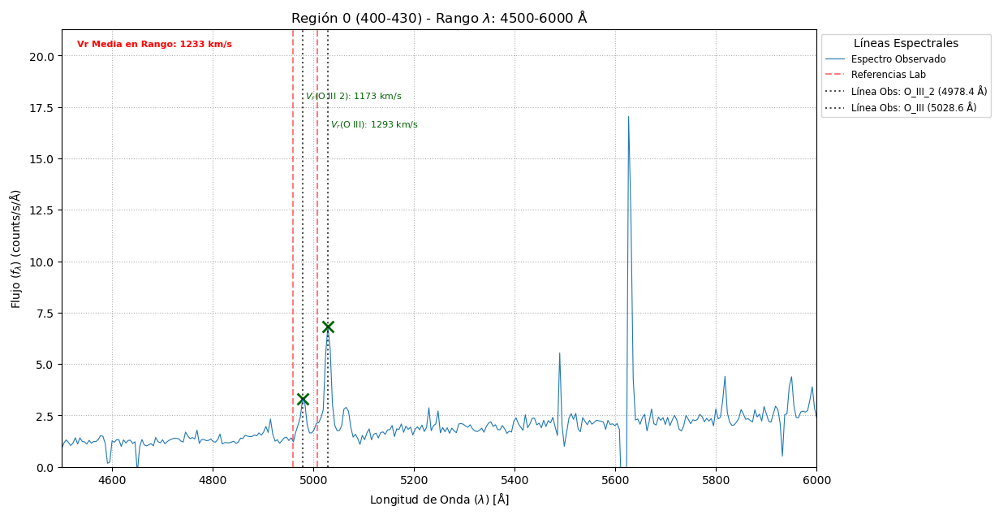

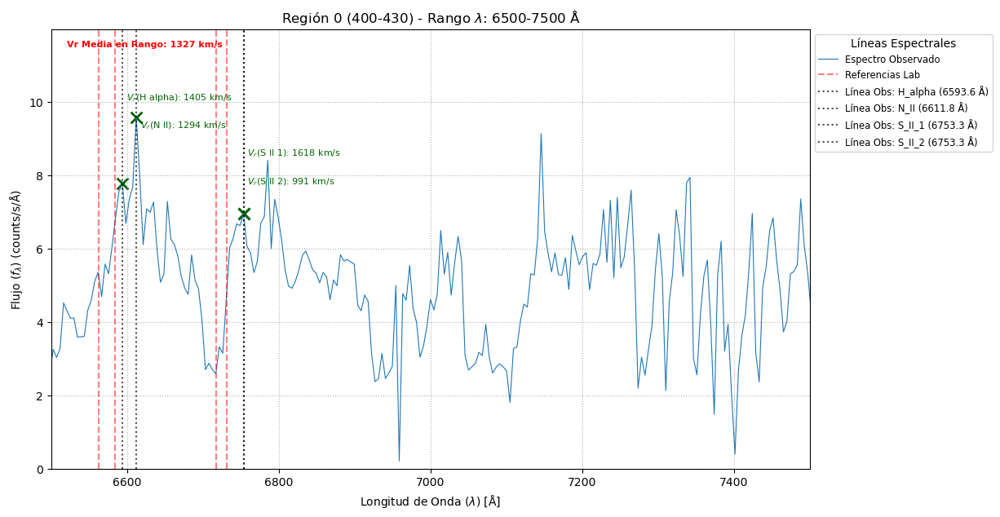


--- Analizando Región 1: Pixels 450 a 480 ---


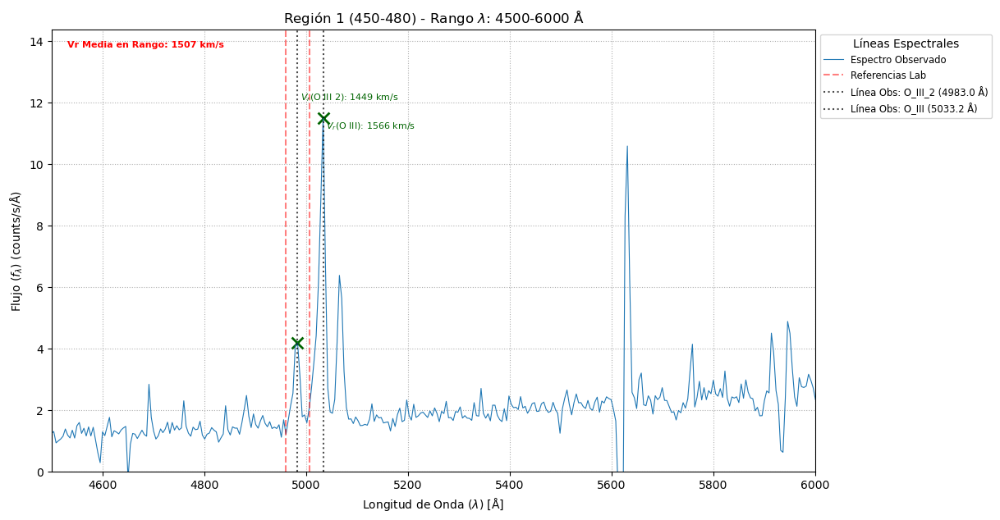

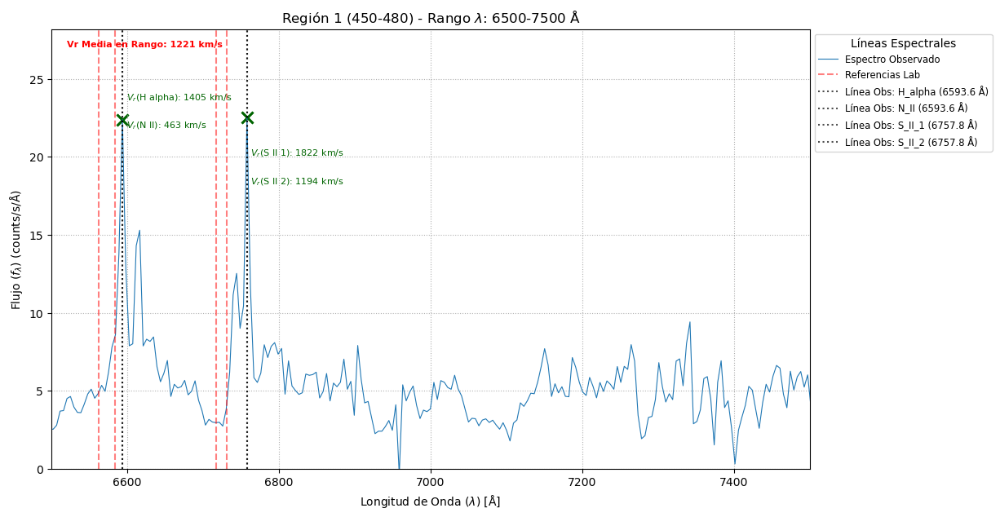


--- Analizando Región 2: Pixels 500 a 530 ---


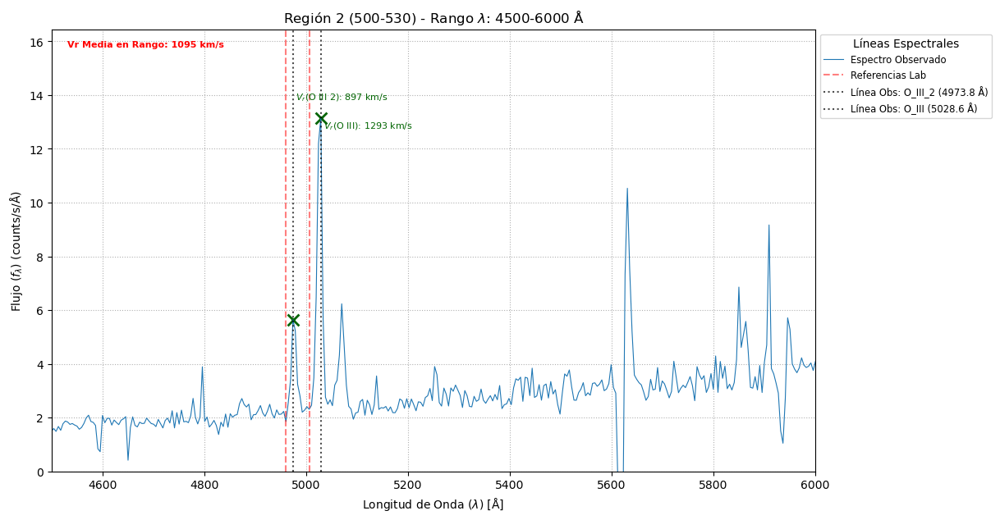

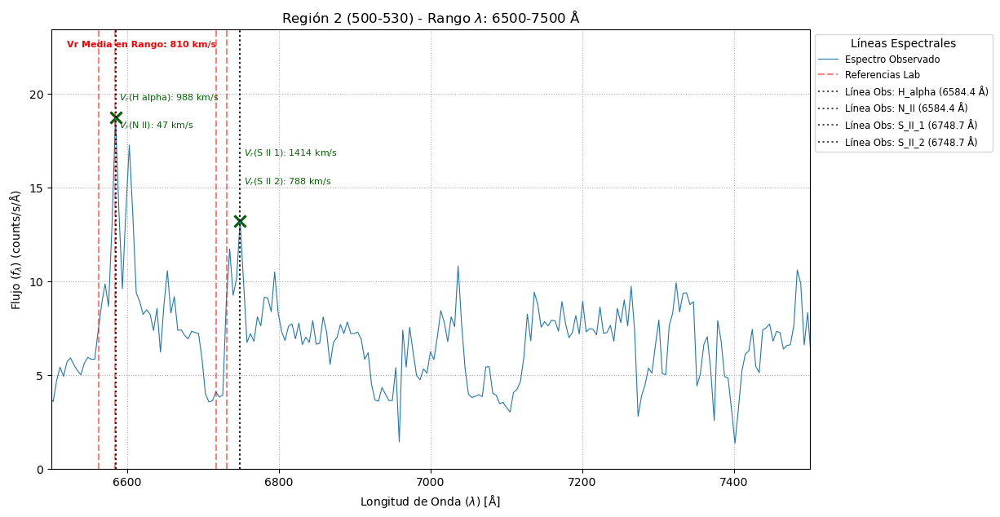


--- Analizando Región 3: Pixels 550 a 580 ---


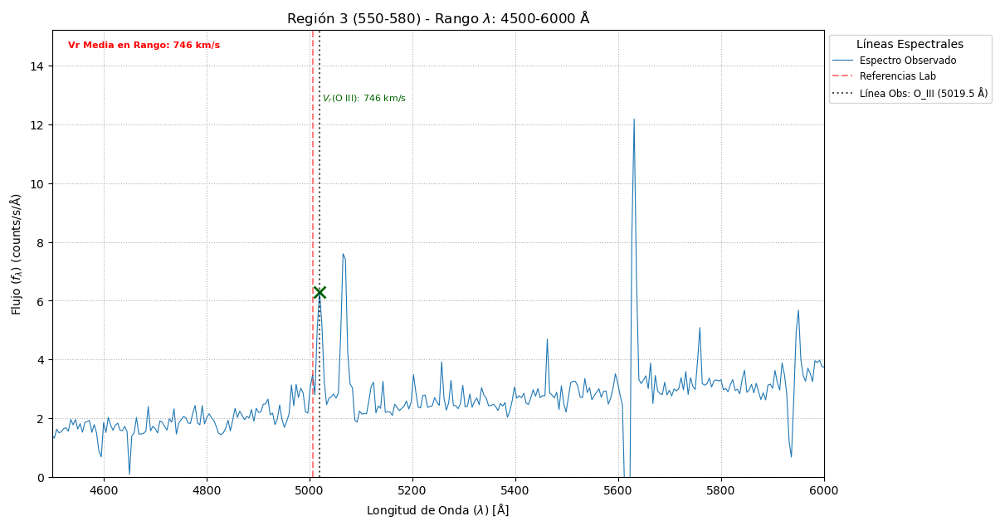

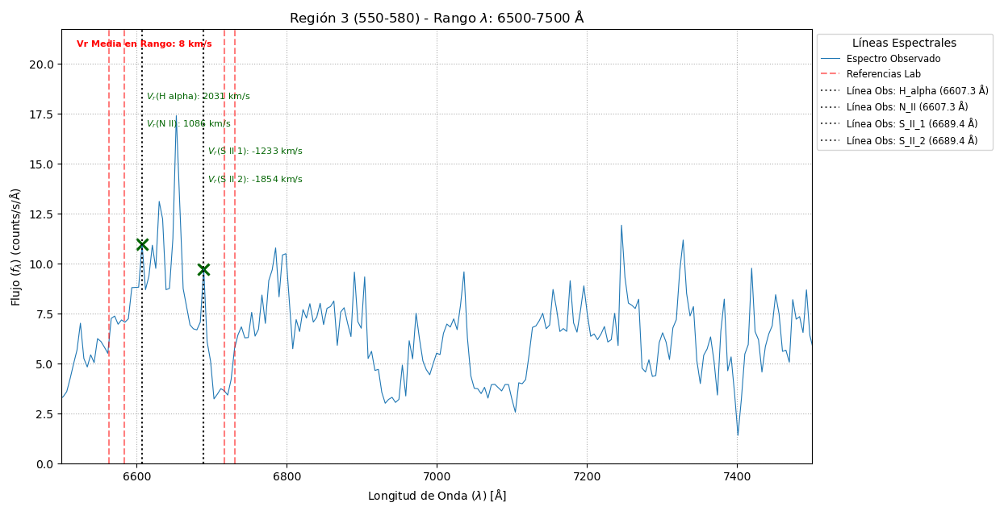


--- Analizando Región 4: Pixels 600 a 630 ---


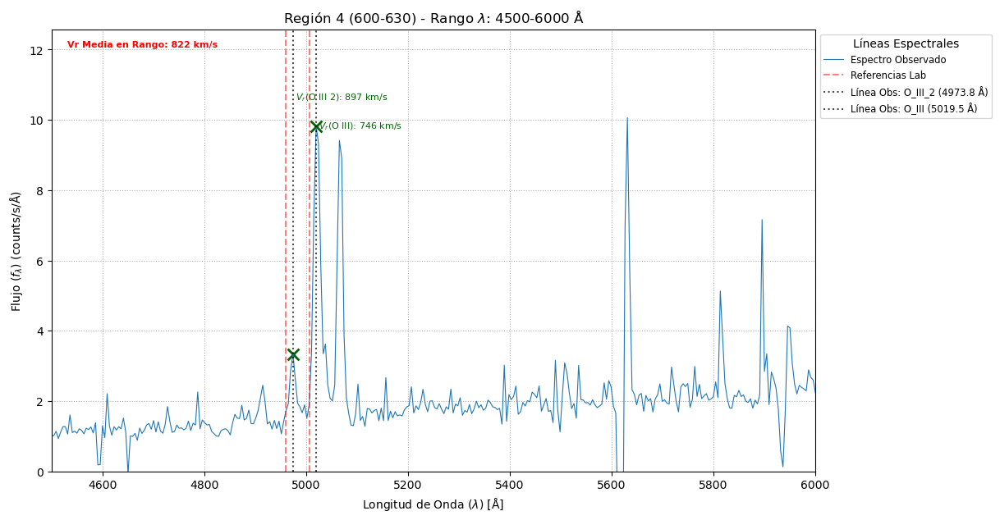

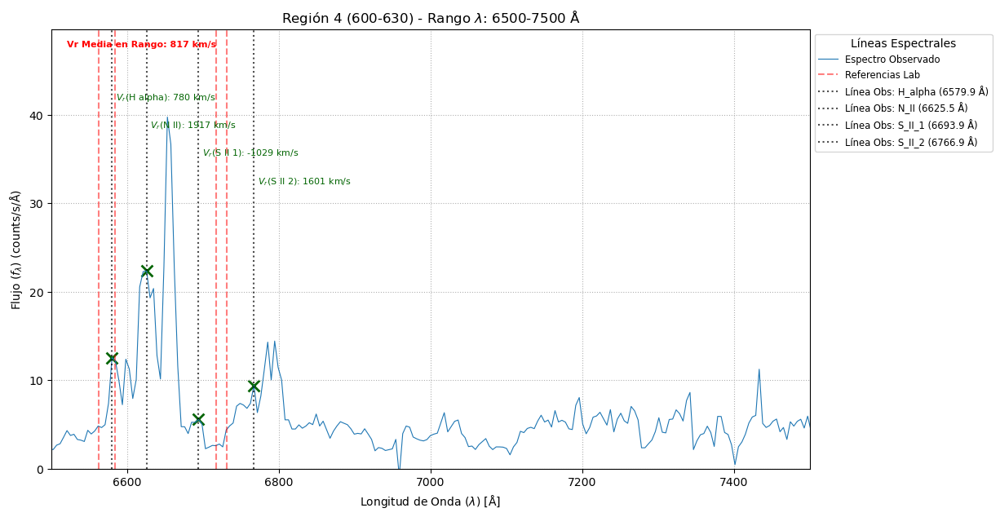


--- Analizando Región 5: Pixels 650 a 680 ---


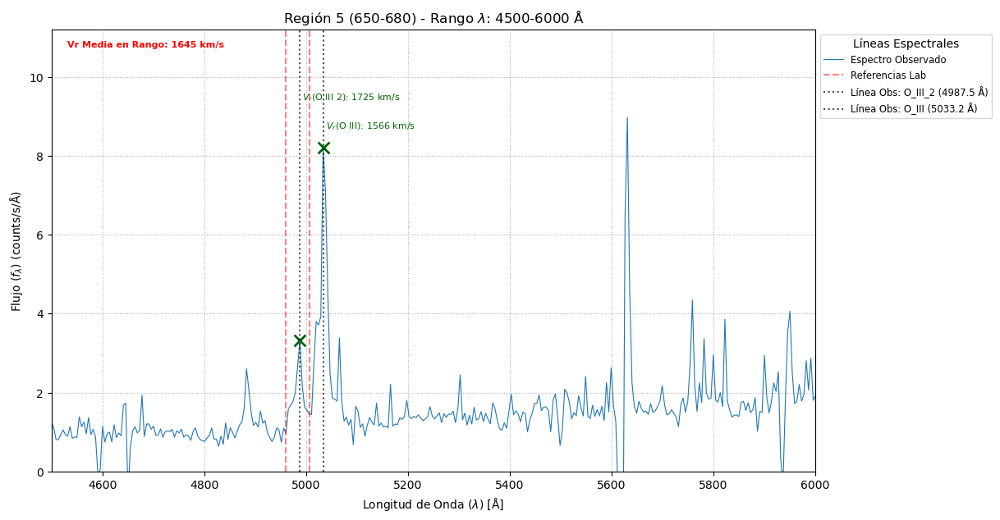

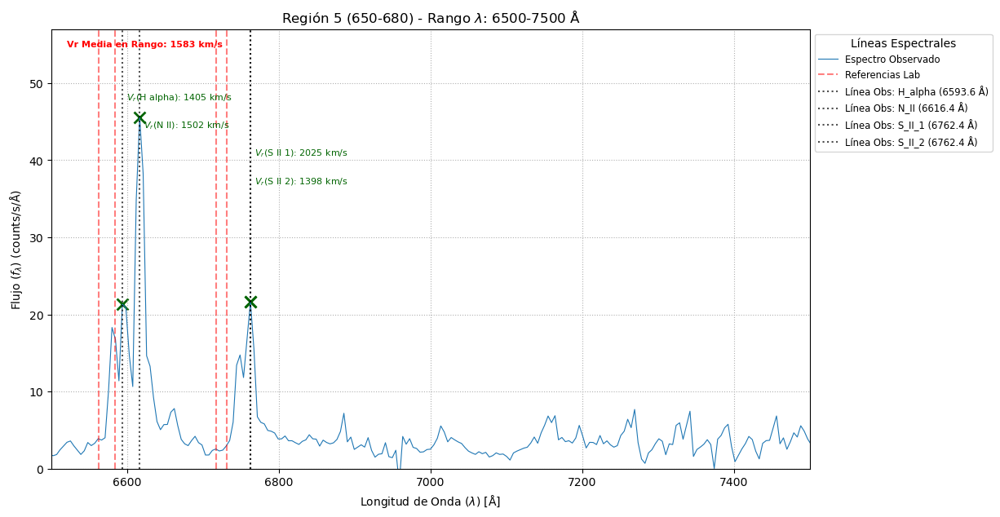


--- Analizando Región 6: Pixels 700 a 730 ---


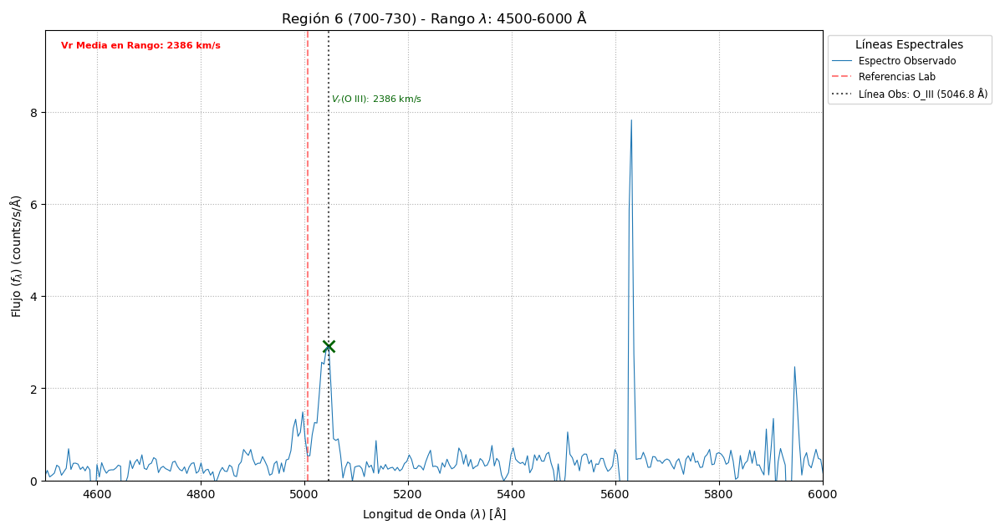

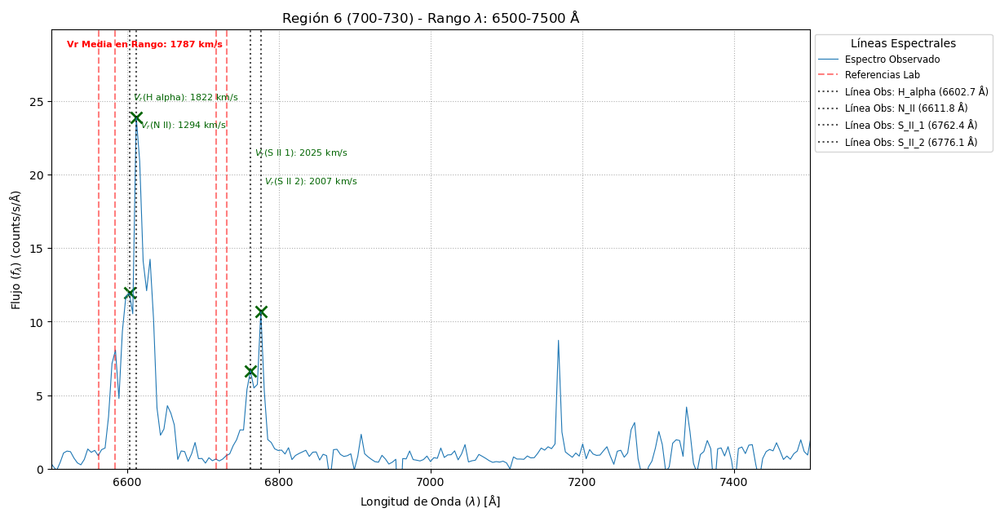


--- Analizando Región 7: Pixels 750 a 780 ---


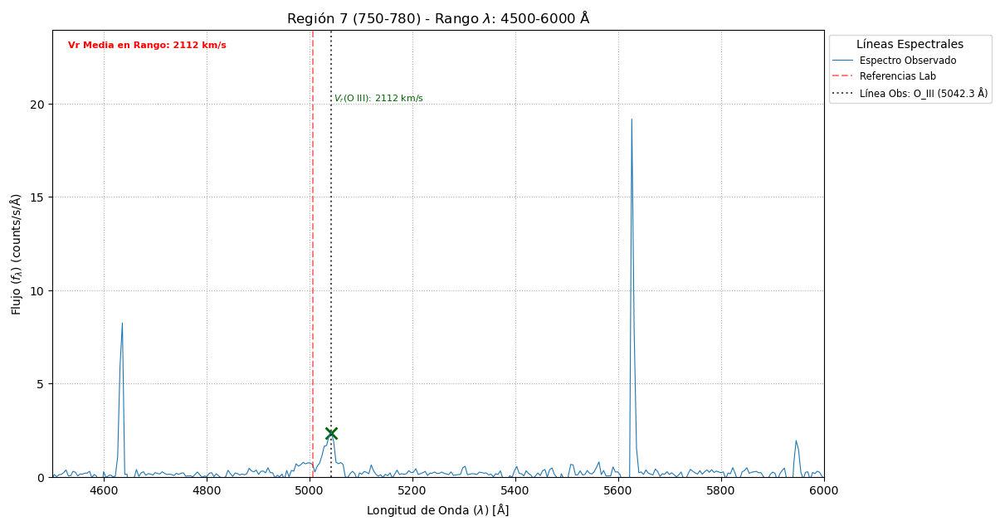

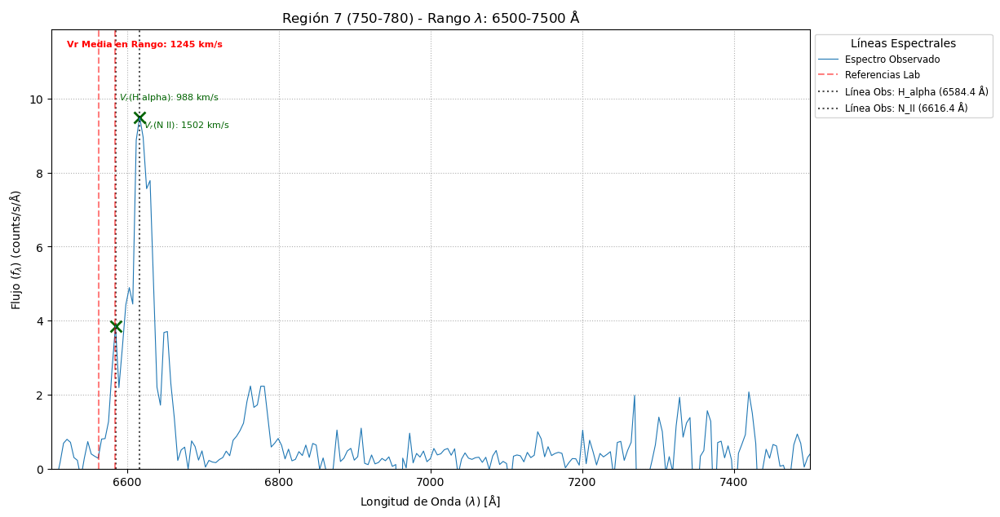


--- Analizando Región 8: Pixels 800 a 830 ---


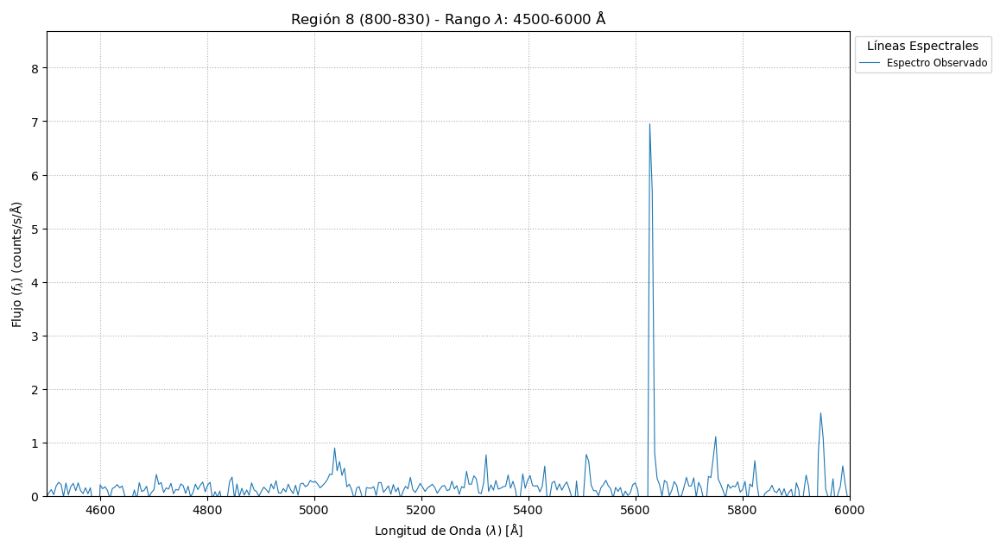

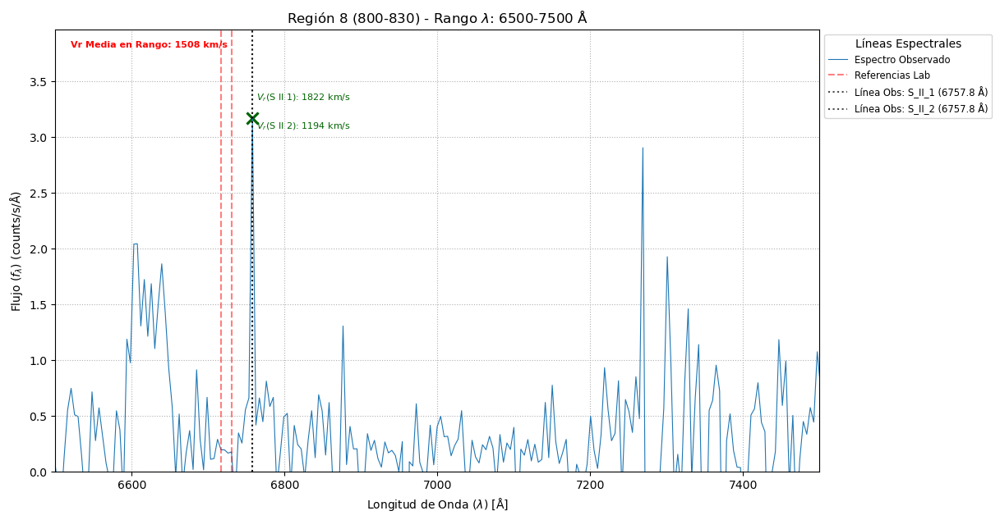


ANÁLISIS COMPLETADO EN 9 REGIONES.
VELOCIDAD RADIAL MEDIA GLOBAL (Vr) de todos los picos detectados: 1190 km/s


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
import os 
import warnings
warnings.filterwarnings('ignore') # Opcional: Ignorar warnings

# --- CONSTANTES Y CONFIGURACIÓN ---
C_LIGHT = 299792.458 # Velocidad de la luz en km/s

# --- DEFINICIÓN DE LÍNEAS DE REFERENCIA ---
LINEAS_LAB = {
    'O_III_2' : 4959.0,
    'O_III' : 5007.0,
    'H_alpha': 6562.8, 
    'N_II': 6583.4,
    'S_II_1': 6717.0,
    'S_II_2': 6731.0
}
rango_graficas = [ (4500, 6000), (6500, 7500) ]
UMBRAL_PROMINENCE = 1 # ¡Ajustar si faltan picos!

# Lista global para acumular todas las velocidades radiales
resultados_vr_global = [] 

# ==============================================================================
## 1. BUCLE DE PROCESAMIENTO POR REGIÓN (i = 0 a 8)
# ==============================================================================

# NOTA: Debes asegurarte de que 'science_reduced', 'wavelength_array', y 'sky_spec'
# estén definidos y cargados antes de este bucle.

RUTA_BASE_GUARDADO = r"D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Picos_espectro_por_posicion"
# IMPORTANTE: Asegúrate de que esta carpeta exista, o el código fallará al guardar.

for i in range(9):
    
    # 1.1. PROCESAMIENTO DE DATOS
    # ------------------------------------------------------------------
    
    start_pixel = 400 + 50 * i
    end_pixel = 430 + 50 * i
    
    try:
        # Tu lógica de extracción y resta del cielo
        spec = science_reduced[0, :, start_pixel : end_pixel]
        spec = np.sum(spec, axis=1)
        neb_spec = spec - sky_spec_30 # Usamos neb_spec para la lógica de análisis
        
        if neb_spec.size == 0 or np.all(np.isnan(neb_spec)) or np.all(neb_spec == 0):
            print(f"AVISO: Región {i} ({start_pixel}:{end_pixel}) datos inválidos. Saltando.")
            continue
            
    except NameError:
        print("ERROR: Variables de datos (science_reduced, sky_spec, etc.) no definidas.")
        break
    # ------------------------------------------------------------------
    
    print(f"\n--- Analizando Región {i}: Pixels {start_pixel} a {end_pixel} ---")
    
    # 1.2. ANÁLISIS DEL ESPECTRO (Genera dos gráficos por región)
    for idx_graph, (rango_min, rango_max) in enumerate(rango_graficas):
        
        # Generación de nombre de archivo único
        nombre_archivo = f"espectro_region_{i:02d}_rango_{idx_graph:01d}.png" 
        ruta_guardado = os.path.join(RUTA_BASE_GUARDADO, nombre_archivo)
        
        plt.figure(figsize=(12, 7))
        
        etiqueta_ref_usada = False
        ETIQUETA_UNICA_REF = 'Referencias Lab'
        
        # Preparación para el cálculo dinámico de Y
        idx_rango = np.where((wavelength_array >= rango_min) & (wavelength_array <= rango_max))
        
        # Manejo de excepción si el rango no tiene datos
        if len(idx_rango[0]) == 0:
            print(f"AVISO: No hay datos para el rango {rango_min}-{rango_max} en la región {i}. Saltando gráfico.")
            plt.close()
            continue
            
        max_y_rango = np.max(neb_spec[idx_rango])
        
        plt.plot(wavelength_array, neb_spec, label='Espectro Observado', linewidth=0.8)
        
        velocidades_por_grafico = [] 
        line_counter = 0 
        
        # Detección y Marcado de Picos
        for nombre, lambda_0 in LINEAS_LAB.items():
            
            if lambda_0 < rango_min or lambda_0 > rango_max:
                continue
                
            ventana_min = lambda_0 - 50
            ventana_max = lambda_0 + 50
            
            idx_ventana = np.where((wavelength_array >= ventana_min) & (wavelength_array <= ventana_max))
            
            if len(idx_ventana[0]) == 0:
                continue
                
            flux_ventana = neb_spec[idx_ventana]
            wave_ventana = wavelength_array[idx_ventana]
            
            picos, _ = find_peaks(flux_ventana, prominence=UMBRAL_PROMINENCE)
            
            if len(picos) > 0:
                idx_pico_max = picos[np.argmax(flux_ventana[picos])]
                lambda_obs = wave_ventana[idx_pico_max]
                
                delta_lambda = lambda_obs - lambda_0
                velocidad_radial = C_LIGHT * (delta_lambda / lambda_0)
                
                # --- ACUMULACIÓN DE RESULTADOS Y CONTADOR DE PICO ---
                velocidades_por_grafico.append(velocidad_radial) 
                resultados_vr_global.append(velocidad_radial)           
                line_counter += 1 
                
                # --------------------------------------------------------
                # 1. Trazar líneas (Versión original solicitada)
                # --------------------------------------------------------
                
                # Línea de Referencia (Lab)
                label_ref = ETIQUETA_UNICA_REF if not etiqueta_ref_usada else None
                plt.axvline(x=lambda_0, color='r', linestyle='--', alpha=0.5, label=label_ref)
                etiqueta_ref_usada = True
                
                # Línea Observada (Peak)
                label_obs = f'Línea Obs: {nombre} ({lambda_obs:.1f} Å)'
                # Usamos linestyle=':' (punteada) para la obs y eliminamos el color 'k' por defecto
                plt.axvline(x=lambda_obs, color='k', linestyle=':', alpha=0.7, label=label_obs)
                
                peak_flux_val = flux_ventana[idx_pico_max]
                plt.scatter(lambda_obs, peak_flux_val, marker='x', color='darkgreen', s=100, linewidth=2)
                
                # --------------------------------------------------------
                # 2. ANOTACIÓN DE Vr (Tu lógica de offset)
                # --------------------------------------------------------
                
                nombre_anotacion_simple = nombre.replace('_', r' ') # Usamos r' ' para Mathtext
                vr_annotation_text = r'$V_r($' + nombre_anotacion_simple + r'$)$: ' + f'{velocidad_radial:.0f} km/s'
                
                # Ajuste de posición Y: Offset escalonado
                offset_step = 0.08 
                y_offset_factor = 1.05 - ( (line_counter - 1) % 4 ) * offset_step
                
                plt.annotate(
                    vr_annotation_text, 
                    xy=(lambda_obs, peak_flux_val), 
                    xytext=(lambda_obs + 5, max_y_rango * y_offset_factor), 
                    fontsize=8, 
                    color='darkgreen',
                    # Añadimos bbox para mejorar legibilidad
                    #bbox=dict(boxstyle="round,pad=0.2", fc="white", alpha=0.7) 
                )

        # --- 3. CONFIGURACIÓN DEL PLOT Y GUARDADO ---
        
        plt.xlim([rango_min, rango_max]) 
        # Aumentamos el límite Y para dar espacio a las anotaciones
        plt.ylim([0, max_y_rango * 1.25]) 
        
        plt.title(f"Región {i} ({start_pixel}-{end_pixel}) - Rango $\lambda$: {rango_min}-{rango_max} Å")
        plt.xlabel(r"Longitud de Onda ($\lambda$) [Å]")
        plt.ylabel(r"Flujo ($f_{\lambda}$) (counts/s/Å)") 

        plt.grid(True, linestyle=':')
        
        plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0), fontsize='small', title="Líneas Espectrales")
        
        # Mostrar Vr Media del rango en la gráfica
        if velocidades_por_grafico:
            vr_media = np.mean(velocidades_por_grafico)
            plt.text(rango_min + (rango_max - rango_min) * 0.02, max_y_rango * 1.2, 
                     f'Vr Media en Rango: {vr_media:.0f} km/s', 
                     fontsize=8, color='red', weight='bold')

        # GUARDA EL ARCHIVO
        try:
            plt.savefig(ruta_guardado, bbox_inches='tight')
            # print(f"Guardado: {ruta_guardado}") # Opcional: imprimir la ruta
        except Exception as e:
            print(f"ERROR AL GUARDAR {nombre_archivo}: {e}")

        plt.show()
        plt.close()

# ==============================================================================
## 2. RESULTADO FINAL GLOBAL
# ==============================================================================

vr_media_total = np.mean(resultados_vr_global) if resultados_vr_global else 0

print("\n====================================================")
print(f"ANÁLISIS COMPLETADO EN {i+1} REGIONES.")
print(f"VELOCIDAD RADIAL MEDIA GLOBAL (Vr) de todos los picos detectados: {vr_media_total:.0f} km/s")
print("====================================================")

# Ahora sacaré la velocidad en función de la posición

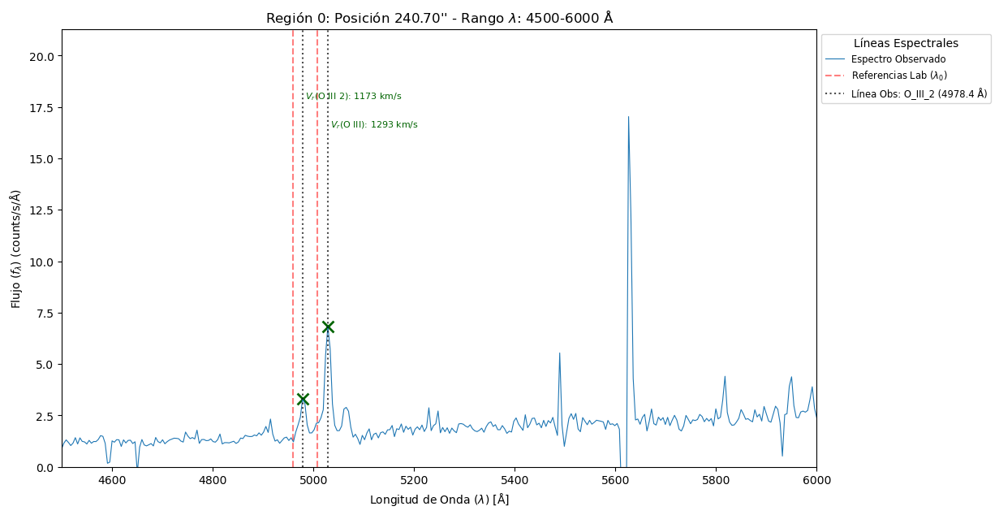

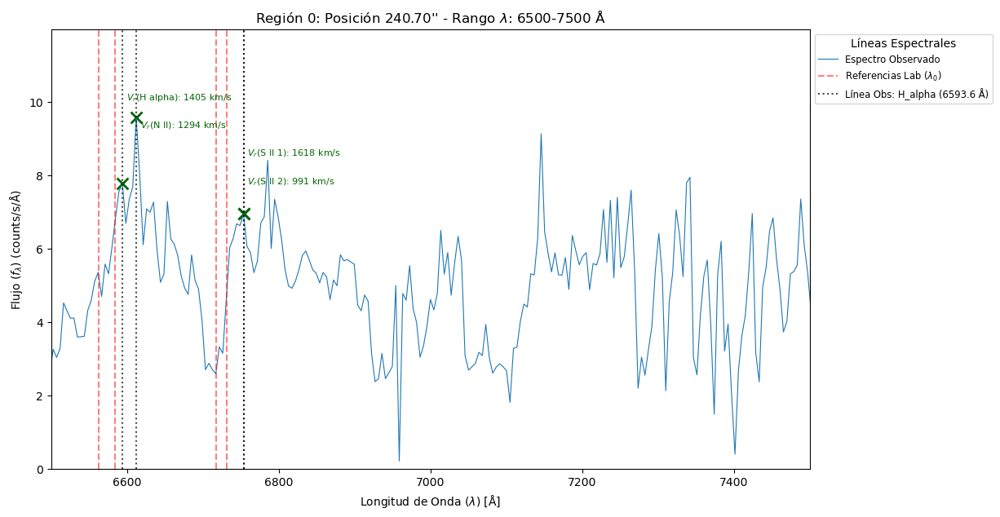

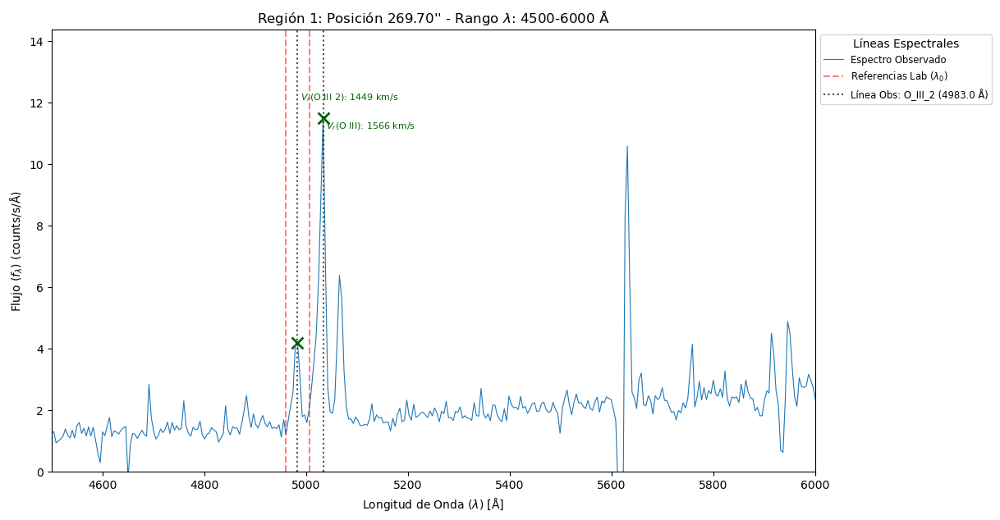

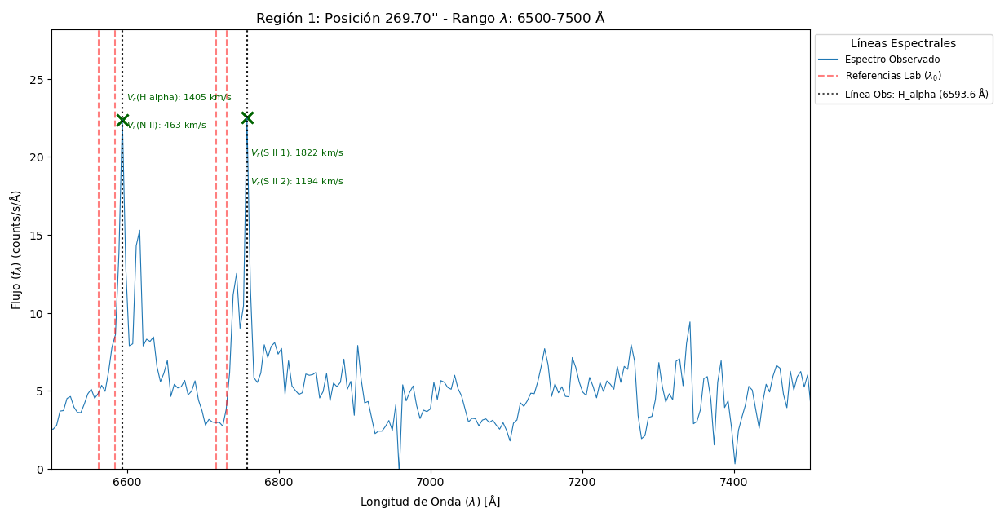

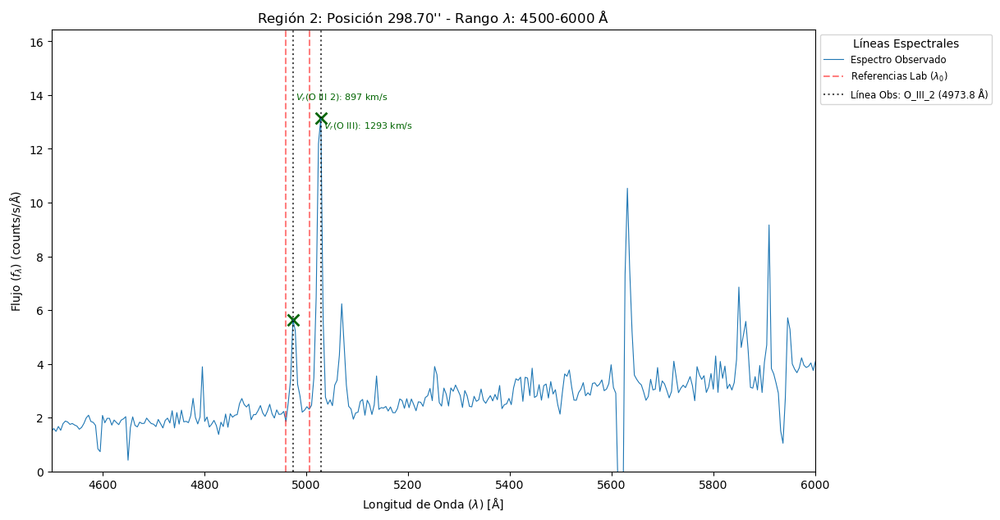

...

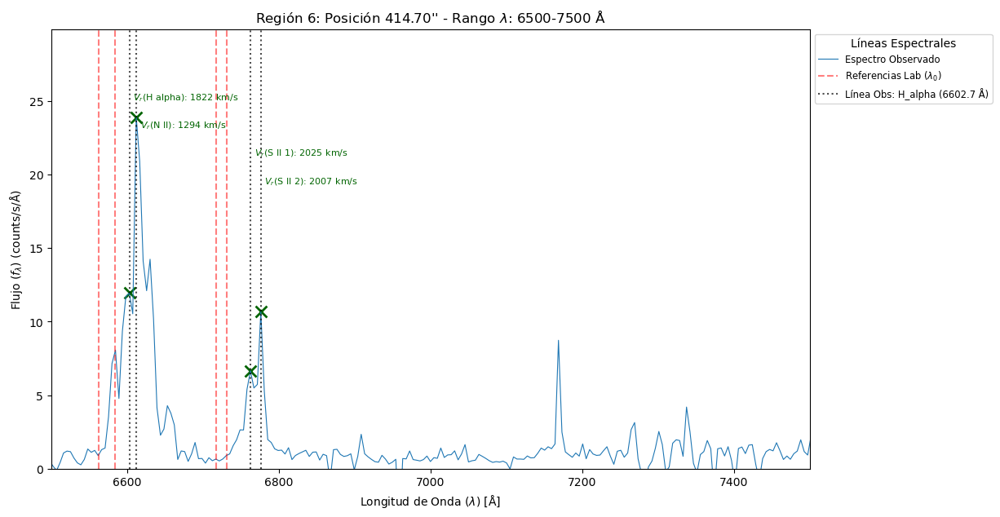

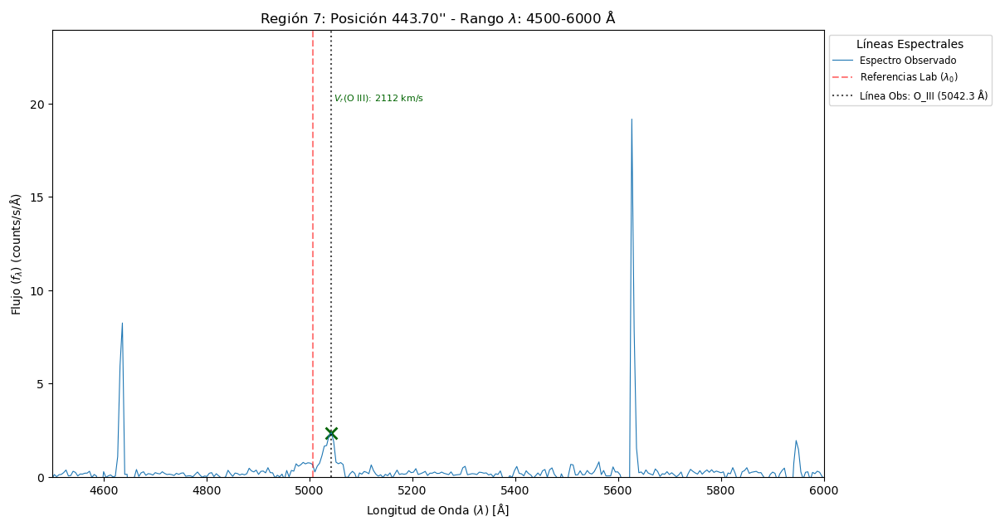

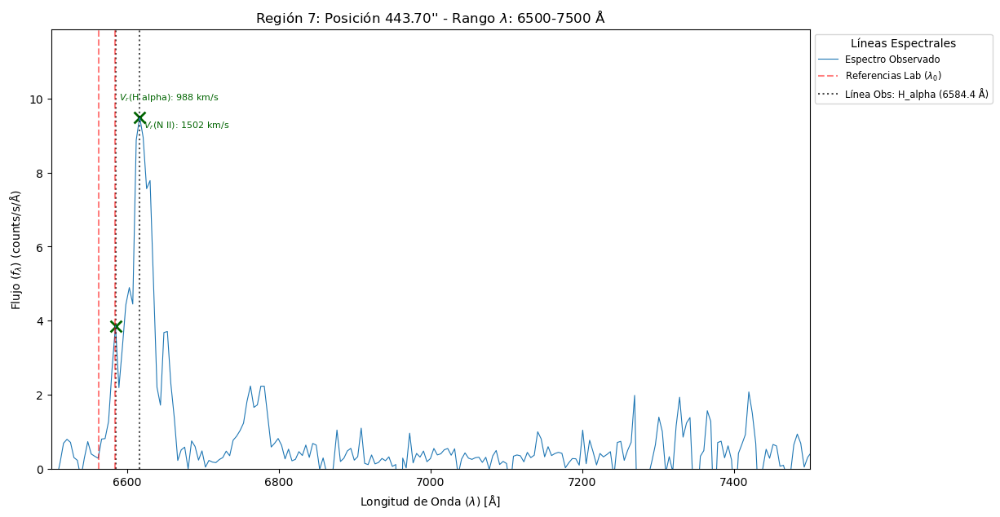

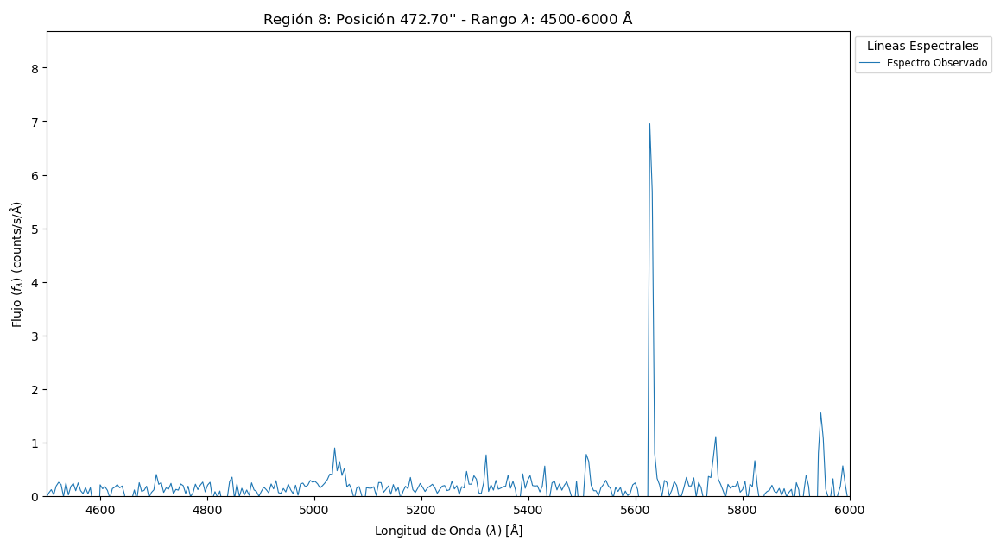

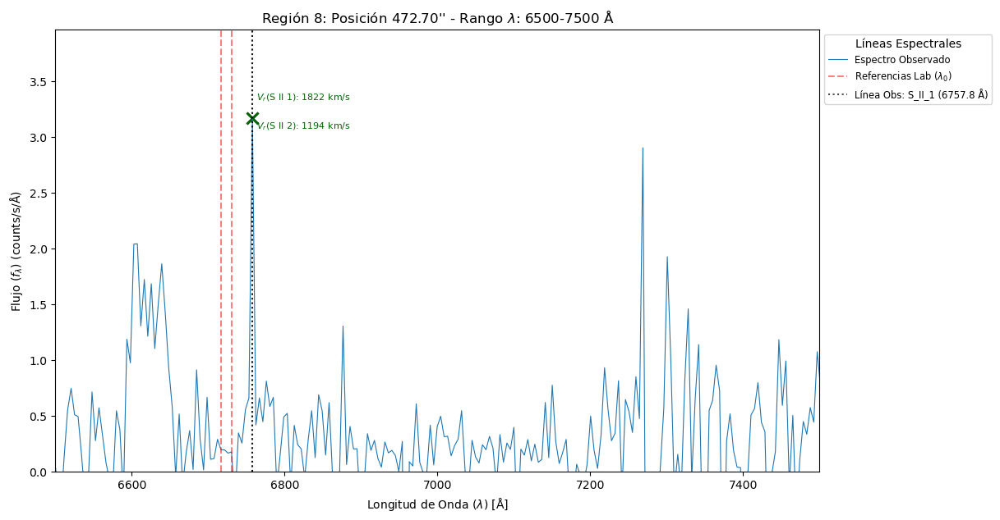


Gráfico final Vr vs. Posición guardado en: D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Picos_espectro_por_posicion\velocidad_radial_vs_posicion.png


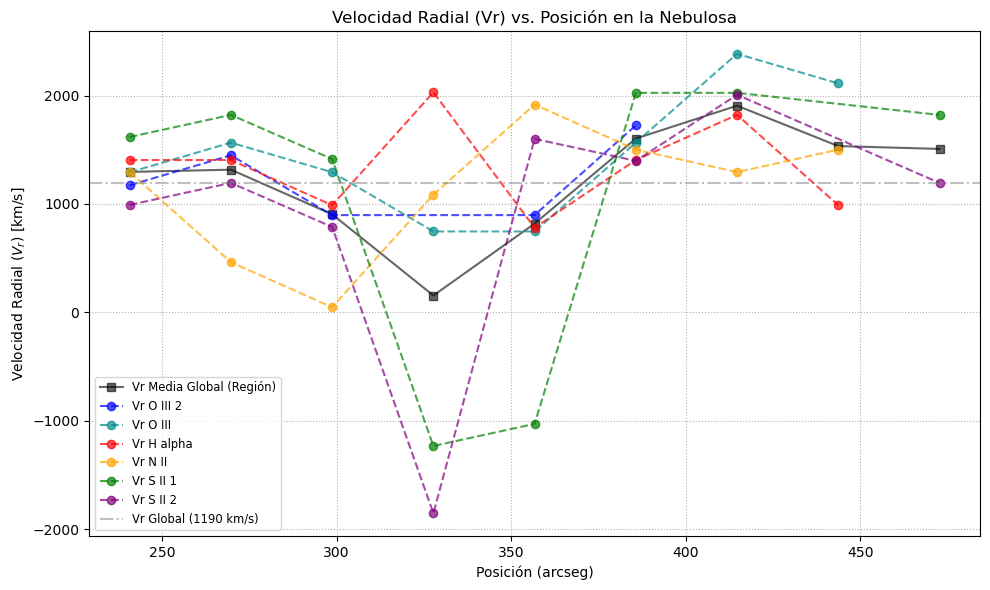

In [925]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
import os 
import warnings
warnings.filterwarnings('ignore')

# --- CONSTANTES Y CONFIGURACIÓN ---
C_LIGHT = 299792.458 # Velocidad de la luz en km/s
FACTOR_CONVERSION_ARCSEC = 0.58 # Factor de conversión: 1 pixel = 0.58 arcseg

# --- DEFINICIÓN DE LÍNEAS DE REFERENCIA ---
LINEAS_LAB = {
    'O_III_2' : 4959.0,
    'O_III' : 5007.0,
    'H_alpha': 6562.8, 
    'N_II': 6583.4,
    'S_II_1': 6717.0,
    'S_II_2': 6731.0
}

# --- 🟢 CORRECCIÓN DE COLOR: DICCIONARIO DE COLORES DISTINTIVOS ---
COLORES_LINEAS = {
    'O_III_2': 'blue',
    'O_III': 'darkcyan',  # Color distintivo para O III
    'H_alpha': 'red',
    'N_II': 'orange',
    'S_II_1': 'green',    # Color distintivo para S II 1
    'S_II_2': 'purple',   # Color distintivo para S II 2
}
# ------------------------------------------------------------------

rango_graficas = [ (4500, 6000), (6500, 7500) ]
UMBRAL_PROMINENCE = 1 

# --- VECTORES DE ALMACENAMIENTO ---
posiciones_arcsec = [] 
vr_medias_region = []
vr_por_elemento = {nombre: [] for nombre in LINEAS_LAB.keys()} 
resultados_vr_global = [] 

# ==============================================================================
## 1. CONFIGURACIÓN DE RUTAS DE GUARDADO
# ==============================================================================

# RUTA BASE DONDE SE GUARDARÁN TODOS LOS ARCHIVOS.
RUTA_BASE_GUARDADO = r"D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Picos_espectro_por_posicion"


# ==============================================================================
## 2. BUCLE DE PROCESAMIENTO POR REGIÓN (i = 0 a 8)
# ==============================================================================

# --- ASUMIR DEFINICIÓN DE science_reduced, wavelength_array, y sky_spec_30 (CORREGIDO) ---

for i in range(9):
    
    start_pixel = 400 + 50 * i
    end_pixel = 430 + 50 * i
    
    posicion_central_pixel = (start_pixel + end_pixel) / 2
    posicion_arcsec = posicion_central_pixel * FACTOR_CONVERSION_ARCSEC
    
    posiciones_arcsec.append(posicion_arcsec) 
    vr_region_actual = {nombre: np.nan for nombre in LINEAS_LAB.keys()}
    
    try:
        # Lógica de procesamiento de datos
        spec = science_reduced[0, :, start_pixel : end_pixel]
        spec = np.sum(spec, axis=1)
        # 🟢 CORRECCIÓN DE VARIABLE: sky_spec => sky_spec_30
        neb_spec = spec - sky_spec_30 
        
        if neb_spec.size == 0 or np.all(np.isnan(neb_spec)) or np.all(neb_spec == 0):
            vr_medias_region.append(np.nan)
            for nombre in LINEAS_LAB.keys():
                vr_por_elemento[nombre].append(np.nan)
            continue
            
    except NameError:
        # 🟢 CORRECCIÓN DE VARIABLE: sky_spec => sky_spec_30
        print("ERROR: Variables de datos (science_reduced, sky_spec_30, etc.) no definidas.")
        break
    
    velocidades_por_grafico = [] 
    
    for idx_graph, (rango_min, rango_max) in enumerate(rango_graficas):
        
        # --- Configuración del Gráfico de Espectro ---
        plt.figure(figsize=(12, 7))
        etiqueta_ref_usada = False
        ETIQUETA_UNICA_REF = 'Referencias Lab ($\lambda_0$)' 
        
        idx_rango = np.where((wavelength_array >= rango_min) & (wavelength_array <= rango_max))
        if len(idx_rango[0]) == 0:
            plt.close()
            continue
            
        max_y_rango = np.max(neb_spec[idx_rango])
        plt.plot(wavelength_array, neb_spec, label='Espectro Observado', linewidth=0.8)
        line_counter = 0 
        
        # --- Detección y Marcado de Picos ---
        for nombre, lambda_0 in LINEAS_LAB.items():
            
            if lambda_0 < rango_min or lambda_0 > rango_max:
                continue
                
            ventana_min = lambda_0 - 50
            ventana_max = lambda_0 + 50
            idx_ventana = np.where((wavelength_array >= ventana_min) & (wavelength_array <= ventana_max))
            
            if len(idx_ventana[0]) == 0: continue
            
            flux_ventana = neb_spec[idx_ventana]
            wave_ventana = wavelength_array[idx_ventana]
            picos, _ = find_peaks(flux_ventana, prominence=UMBRAL_PROMINENCE)
            
            if len(picos) > 0:
                idx_pico_max = picos[np.argmax(flux_ventana[picos])]
                lambda_obs = wave_ventana[idx_pico_max]
                
                delta_lambda = lambda_obs - lambda_0
                velocidad_radial = C_LIGHT * (delta_lambda / lambda_0)
                
                velocidades_por_grafico.append(velocidad_radial) 
                resultados_vr_global.append(velocidad_radial)           
                line_counter += 1 
                vr_region_actual[nombre] = velocidad_radial # ALMACENAR POR ELEMENTO
                
                # Plotting y Anotaciones
                label_ref = ETIQUETA_UNICA_REF if not etiqueta_ref_usada else None
                plt.axvline(x=lambda_0, color='r', linestyle='--', alpha=0.5, label=label_ref)
                etiqueta_ref_usada = True
                
                plt.axvline(x=lambda_obs, color='k', linestyle=':', alpha=0.7, label=f'Línea Obs: {nombre} ({lambda_obs:.1f} Å)' if line_counter == 1 else None)
                peak_flux_val = flux_ventana[idx_pico_max]
                plt.scatter(lambda_obs, peak_flux_val, marker='x', color='darkgreen', s=100, linewidth=2)
                
                nombre_anotacion_simple = nombre.replace('_', r' ')
                vr_annotation_text = r'$V_r($' + nombre_anotacion_simple + r'$)$: ' + f'{velocidad_radial:.0f} km/s'
                offset_step = 0.08 
                y_offset_factor = 1.05 - ( (line_counter - 1) % 4 ) * offset_step
                plt.annotate(vr_annotation_text, xy=(lambda_obs, peak_flux_val), xytext=(lambda_obs + 5, max_y_rango * y_offset_factor), fontsize=8, color='darkgreen')

        # --- FINALIZACIÓN DEL PLOT DE ESPECTRO ---
        plt.xlim([rango_min, rango_max]) 
        plt.ylim([0, max_y_rango * 1.25]) 
        plt.title(f"Región {i}: Posición {posicion_arcsec:.2f}'' - Rango $\lambda$: {rango_min}-{rango_max} Å")
        plt.xlabel(r"Longitud de Onda ($\lambda$) [Å]")
        plt.ylabel(r"Flujo ($f_{\lambda}$) (counts/s/Å)") 
        plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0), fontsize='small', title="Líneas Espectrales")
        
        # --- LÍNEA DE GUARDADO COMENTADA PARA CADA GRÁFICO INTERMEDIO ---
        nombre_archivo = f"espectro_region_{i:02d}_rango_{idx_graph:01d}.png" 
        ruta_guardado = os.path.join(RUTA_BASE_GUARDADO, nombre_archivo)
        # plt.savefig(ruta_guardado, bbox_inches='tight')
        
        plt.show() # MUESTRA EN JUPYTER
        plt.close()

    # 1.3. ALMACENAMIENTO DE DATOS POR REGIÓN
    if velocidades_por_grafico:
        vr_media = np.mean(velocidades_por_grafico)
        vr_medias_region.append(vr_media)
    else:
        vr_medias_region.append(np.nan)

    for nombre in LINEAS_LAB.keys():
        vr_por_elemento[nombre].append(vr_region_actual[nombre])


# ==============================================================================
## 3. GRÁFICO FINAL: VELOCIDAD RADIAL VS. POSICIÓN
# ==============================================================================

vr_media_total = np.mean(resultados_vr_global) if resultados_vr_global else 0

plt.figure(figsize=(10, 6))

# ❌ ELIMINAMOS EL USO DE colores = plt.cm.get_cmap('hsv', len(LINEAS_LAB))
pos_arcsec_arr = np.array(posiciones_arcsec)
vr_medias_arr = np.array(vr_medias_region)
valid_indices_media = ~np.isnan(vr_medias_arr)

# 1. Plotear Vr Media por Región
plt.plot(pos_arcsec_arr[valid_indices_media], vr_medias_arr[valid_indices_media], 
         marker='s', linestyle='-', color='k', label='Vr Media Global (Región)', alpha=0.6)

# 2. Plotear Vr por Elemento (filtrando NaNs y usando COLORES_LINEAS)
for nombre, vr_list in vr_por_elemento.items():
    vr_arr = np.array(vr_list)
    valid_indices_elem = ~np.isnan(vr_arr) 
    
    if np.sum(valid_indices_elem) > 0:
        # 🟢 CORRECCIÓN: Usar el color fijo del diccionario
        color_plot = COLORES_LINEAS.get(nombre, 'gray')
        
        plt.plot(pos_arcsec_arr[valid_indices_elem], vr_arr[valid_indices_elem], 
                 marker='o', linestyle='--', alpha=0.7, 
                 color=color_plot, label=f'Vr {nombre.replace("_", " ")}')

# 3. Línea de referencia global
plt.axhline(vr_media_total, color='gray', linestyle='-.', alpha=0.5, label=f'Vr Global ({vr_media_total:.0f} km/s)')

# 4. Configuración y Guardado
plt.title('Velocidad Radial (Vr) vs. Posición en la Nebulosa')
plt.xlabel('Posición (arcseg)')
plt.ylabel(r'Velocidad Radial ($V_r$) [km/s]')
plt.grid(True, linestyle=':')
plt.legend(loc='best', fontsize='small')
plt.tight_layout()

# --- LÍNEA DE GUARDADO ACTIVA PARA EL GRÁFICO FINAL ---
nombre_archivo_vr = "velocidad_radial_vs_posicion.png"
ruta_guardado_vr = os.path.join(RUTA_BASE_GUARDADO, nombre_archivo_vr)
try:
    # Creamos el directorio si no existe (buena práctica)
    os.makedirs(RUTA_BASE_GUARDADO, exist_ok=True)
    plt.savefig(ruta_guardado_vr, bbox_inches='tight')
    print(f"\nGráfico final Vr vs. Posición guardado en: {ruta_guardado_vr}")
except Exception as e:
    print(f"\nERROR AL GUARDAR el gráfico final: {e}")

plt.show()
plt.close()

In [929]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
import os
import warnings
warnings.filterwarnings('ignore')

# --- CONSTANTES Y CONFIGURACIÓN ---
C_LIGHT = 299792.458 # Velocidad de la luz en km/s
FACTOR_CONVERSION_ARCSEC = 0.58 # Factor de conversión: 1 pixel = 0.58 arcseg

# 1) DEFINICIÓN DE LÍNEAS DE REFERENCIA (Actualizado)
LINEAS_LAB = {
    'H_beta': 4861.32,  
    '[OIII]_4959': 4959.0,
    '[OIII]_5007': 5007.0,
    '[OI]_6300': 6300.3, # Nueva línea
    '[OI]_6363': 6363.8, # Nueva línea
    '[NII]_6548': 6548.1, # Nueva línea
    'H_alpha': 6562.8,
    '[NII]_6584': 6583.4, # Nueva línea
    '[SII]_6717': 6716.4,
    '[SII]_6731': 6730.8
}

# --- DICCIONARIO DE COLORES DISTINTIVOS (Actualizado para las nuevas líneas) ---
COLORES_LINEAS = {
    'H_beta': 'dodgerblue',
    '[OIII]_4959': 'darkcyan', 
    '[OIII]_5007': 'teal',
    '[OI]_6300': 'sienna', # Nuevo color
    '[OI]_6363': 'chocolate', # Nuevo color
    '[NII]_6548': 'orange',
    'H_alpha': 'red',
    '[NII]_6584': 'orangered',
    '[SII]_6717': 'green',
    '[SII]_6731': 'purple',
}
# ------------------------------------------------------------------

# 2) RANGOS DE GRÁFICAS (Actualizado)
# Rango 1: 4600-5600 A (cubre Hbeta, [OIII])
# Rango 2: 6100-6900 A (cubre [OI], Halpha, [NII], [SII])
rango_graficas = [ (4600, 5600), (6100, 6900) ]
UMBRAL_PROMINENCE = 1 

# --- VECTORES DE ALMACENAMIENTO ---
posiciones_arcsec = [] 
vr_medias_region = []
vr_por_elemento = {nombre: [] for nombre in LINEAS_LAB.keys()} 
resultados_vr_global = [] 

# ==============================================================================
## 1. CONFIGURACIÓN DE RUTAS DE GUARDADO Y SIMULACIÓN
# ==============================================================================

# RUTA BASE DONDE SE GUARDARÁN TODOS LOS ARCHIVOS.
RUTA_BASE_GUARDADO = r"D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Picos_espectro_por_posicion"

# ==============================================================================
## 2. BUCLE DE PROCESAMIENTO POR REGIÓN (i = 0 a 8)
# ==============================================================================

for i in range(9):
    
    start_pixel = 400 + 50 * i
    end_pixel = 430 + 50 * i
    
    posicion_central_pixel = (start_pixel + end_pixel) / 2
    posicion_arcsec = posicion_central_pixel * FACTOR_CONVERSION_ARCSEC
    
    posiciones_arcsec.append(posicion_arcsec) 
    vr_region_actual = {nombre: np.nan for nombre in LINEAS_LAB.keys()}
    
    try:
        # Lógica de procesamiento de datos
        spec = science_reduced[0, :, start_pixel : end_pixel]
        spec = np.sum(spec, axis=1)
        neb_spec = spec - sky_spec_30 
        
        if neb_spec.size == 0 or np.all(np.isnan(neb_spec)) or np.all(neb_spec == 0):
            vr_medias_region.append(np.nan)
            for nombre in LINEAS_LAB.keys():
                vr_por_elemento[nombre].append(np.nan)
            continue
            
    except NameError:
        print("ERROR: Variables de datos (science_reduced, sky_spec_30, etc.) no definidas.")
        break
    
    velocidades_por_grafico = [] 
    
    for idx_graph, (rango_min, rango_max) in enumerate(rango_graficas):
        
        # --- Configuración del Gráfico de Espectro ---
        plt.figure(figsize=(12, 7))
        etiqueta_ref_usada = False
        etiqueta_obs_usada = False
        
        idx_rango = np.where((wavelength_array >= rango_min) & (wavelength_array <= rango_max))
        if len(idx_rango[0]) == 0:
            plt.close()
            continue
            
        max_y_rango = np.max(neb_spec[idx_rango])
        plt.plot(wavelength_array, neb_spec, label='Espectro Observado', linewidth=0.8)
        line_counter = 0 
        
        # --- 3) Trazar TODAS las Líneas de LAB y Picos ---
        
        for nombre, lambda_0 in LINEAS_LAB.items():
            
            if lambda_0 < rango_min or lambda_0 > rango_max:
                continue
                
            # A. LÍNEAS DE REFERENCIA (LAB) - TODAS
            label_ref = 'Referencias Lab ($\lambda_0$)' if not etiqueta_ref_usada else None
            # Líneas de laboratorio: Rojas discontinuas
            plt.axvline(x=lambda_0, color='r', linestyle='--', alpha=0.5, label=label_ref)
            etiqueta_ref_usada = True

            # B. DETECCIÓN DE PICO y LÍNEA OBSERVADA (Solo si se identifica)
            ventana_min = lambda_0 - 15 # Reducido a 15A para ser más selectivo
            ventana_max = lambda_0 + 15
            idx_ventana = np.where((wavelength_array >= ventana_min) & (wavelength_array <= ventana_max))
            
            if len(idx_ventana[0]) == 0: continue
            
            flux_ventana = neb_spec[idx_ventana]
            wave_ventana = wavelength_array[idx_ventana]
            picos, _ = find_peaks(flux_ventana, prominence=UMBRAL_PROMINENCE)
            
            if len(picos) > 0:
                idx_pico_max = picos[np.argmax(flux_ventana[picos])]
                lambda_obs = wave_ventana[idx_pico_max]
                
                delta_lambda = lambda_obs - lambda_0
                velocidad_radial = C_LIGHT * (delta_lambda / lambda_0)
                
                velocidades_por_grafico.append(velocidad_radial) 
                resultados_vr_global.append(velocidad_radial)       
                line_counter += 1 
                vr_region_actual[nombre] = velocidad_radial # ALMACENAR POR ELEMENTO
                
                # Líneas Observadas (Pico detectado)
                label_obs = 'Líneas Obs. Desplazadas' if not etiqueta_obs_usada else None
                # Puntilladas negras (k)
                plt.axvline(x=lambda_obs, color='k', linestyle=':', alpha=0.9, label=label_obs)
                etiqueta_obs_usada = True
                
                peak_flux_val = flux_ventana[idx_pico_max]
                plt.scatter(lambda_obs, peak_flux_val, marker='x', color='k', s=70, linewidth=1.5, zorder=5)
                
                # Anotaciones
                nombre_anotacion_simple = nombre.replace('_', r' ')
                vr_annotation_text = r'$V_r($' + nombre_anotacion_simple + r'$)$: ' + f'{velocidad_radial:.0f} km/s'
                offset_step = 0.08 
                y_offset_factor = 1.05 - ( (line_counter - 1) % 4 ) * offset_step
                plt.annotate(vr_annotation_text, xy=(lambda_obs, peak_flux_val), xytext=(lambda_obs + 5, max_y_rango * y_offset_factor), fontsize=8, color='darkred')

        # --- FINALIZACIÓN DEL PLOT DE ESPECTRO ---
        plt.xlim([rango_min, rango_max]) 
        plt.ylim([0, max_y_rango * 1.25]) 
        plt.title(f"Región {i}: Posición {posicion_arcsec:.2f}'' - Rango $\lambda$: {rango_min}-{rango_max} Å")
        plt.xlabel(r"Longitud de Onda ($\lambda$) [Å]")
        
        # 4) CAMBIO EJE Y: Poner solo 'Flujo'
        plt.ylabel("Flujo") 
        
        plt.grid(True, linestyle=':')
        plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0), fontsize='small', title="Líneas Espectrales")
        
        # Guardar Gráfico
        nombre_archivo = f"espectro_region_{i:02d}_rango_{idx_graph:01d}.png" 
        ruta_guardado = os.path.join(RUTA_BASE_GUARDADO, nombre_archivo)
        try:
             os.makedirs(RUTA_BASE_GUARDADO, exist_ok=True)
             plt.savefig(ruta_guardado, bbox_inches='tight')
             # print(f"Guardado: {ruta_guardado}") 
        except Exception as e:
             print(f"ERROR AL GUARDAR {nombre_archivo}: {e}")
        
        plt.close() # Cierra para ahorrar memoria

    # 1.3. ALMACENAMIENTO DE DATOS POR REGIÓN
    if velocidades_por_grafico:
        vr_media = np.mean(velocidades_por_grafico)
        vr_medias_region.append(vr_media)
    else:
        vr_medias_region.append(np.nan)

    for nombre in LINEAS_LAB.keys():
        vr_por_elemento[nombre].append(vr_region_actual[nombre])


# ==============================================================================
## 3. GRÁFICO FINAL: VELOCIDAD RADIAL VS. POSICIÓN (Sin cambios en lógica)
# ==============================================================================

vr_media_total = np.mean(resultados_vr_global) if resultados_vr_global else 0

plt.figure(figsize=(10, 6))

pos_arcsec_arr = np.array(posiciones_arcsec)
vr_medias_arr = np.array(vr_medias_region)
valid_indices_media = ~np.isnan(vr_medias_arr)

# 1. Plotear Vr Media por Región
plt.plot(pos_arcsec_arr[valid_indices_media], vr_medias_arr[valid_indices_media], 
          marker='s', linestyle='-', color='k', label='Vr Media Global (Región)', alpha=0.6)

# 2. Plotear Vr por Elemento (filtrando NaNs y usando COLORES_LINEAS)
for nombre, vr_list in vr_por_elemento.items():
    vr_arr = np.array(vr_list)
    valid_indices_elem = ~np.isnan(vr_arr) 
    
    if np.sum(valid_indices_elem) > 0:
        color_plot = COLORES_LINEAS.get(nombre, 'gray')
        
        plt.plot(pos_arcsec_arr[valid_indices_elem], vr_arr[valid_indices_elem], 
                  marker='o', linestyle='--', alpha=0.7, 
                  color=color_plot, label=f'Vr {nombre.replace("_", " ")}')

# 3. Línea de referencia global
plt.axhline(vr_media_total, color='gray', linestyle='-.', alpha=0.5, label=f'Vr Global ({vr_media_total:.0f} km/s)')

# 4. Configuración y Guardado
plt.title('Velocidad Radial (Vr) vs. Posición en la Nebulosa')
plt.xlabel('Posición (arcseg)')
plt.ylabel(r'Velocidad Radial ($V_r$) [km/s]')
plt.grid(True, linestyle=':')
plt.legend(loc='best', fontsize='small')
plt.tight_layout()

nombre_archivo_vr = "velocidad_radial_vs_posicion.png"
ruta_guardado_vr = os.path.join(RUTA_BASE_GUARDADO, nombre_archivo_vr)
try:
    os.makedirs(RUTA_BASE_GUARDADO, exist_ok=True)
    plt.savefig(ruta_guardado_vr, bbox_inches='tight')
    print(f"\nGráfico final Vr vs. Posición guardado en: {ruta_guardado_vr}")
except Exception as e:
    print(f"\nERROR AL GUARDAR el gráfico final: {e}")

plt.close()


Gráfico final Vr vs. Posición guardado en: D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Picos_espectro_por_posicion\velocidad_radial_vs_posicion.png


# Versión final automatizada

In [1122]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
import os
import warnings
warnings.filterwarnings('ignore')

# --- CONSTANTES Y CONFIGURACIÓN ---
C_LIGHT = 299792.458 # Velocidad de la luz en km/s
FACTOR_CONVERSION_ARCSEC = 0.58 

# --- DEFINICIÓN DE LÍNEAS DE REFERENCIA ---
LINEAS_LAB = {
    'H_beta': 4861.32,  
    '[OIII]_4959': 4959.0,
    '[OIII]_5007': 5007.0,
    '[OI]_6300': 6300.3, 
    '[OI]_6363': 6363.8, 
    '[NII]_6548': 6548.1, 
    'H_alpha': 6562.8,
    '[NII]_6584': 6583.4, 
    '[SII]_6717': 6716.4,
    '[SII]_6731': 6730.8
}

# --- DICCIONARIO DE COLORES DISTINTIVOS ---
COLORES_LINEAS = {
    'H_beta': 'blue',          
    '[OIII]_4959': 'skyblue',  
    '[OIII]_5007': 'teal',     
    '[OI]_6300': 'sienna',
    '[OI]_6363': 'chocolate',
    '[NII]_6548': 'orange',
    'H_alpha': 'red',
    '[NII]_6584': 'orangered',
    '[SII]_6717': 'green',
    '[SII]_6731': 'purple',
}

# RANGOS DE GRÁFICAS
rango_graficas = [ (4600, 5600), (6100, 6900) ]

# FACTOR para el umbral de prominencia
UMBRAL_PROMINENCE_FACTOR = 0.05 

# --- VECTORES DE ALMACENAMIENTO ---
posiciones_arcsec = [] 
vr_medias_region = []
vr_por_elemento = {nombre: [] for nombre in LINEAS_LAB.keys()} 
resultados_vr_global = [] 

# ==============================================================================
## 1. CONFIGURACIÓN DE RUTAS DE GUARDADO
# ==============================================================================

RUTA_BASE_GUARDADO = r"D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Picos_espectro_por_posicion"

# ==============================================================================
## 2. BUCLE DE PROCESAMIENTO POR REGIÓN (i = 0 a 8)
# ==============================================================================

for i in range(9):
    
    start_pixel = 400 + 50 * i
    end_pixel = 430 + 50 * i
    
    posicion_central_pixel = (start_pixel + end_pixel) / 2
    posicion_arcsec = posicion_central_pixel * FACTOR_CONVERSION_ARCSEC
    
    posiciones_arcsec.append(posicion_arcsec) 
    vr_region_actual = {nombre: np.nan for nombre in LINEAS_LAB.keys()}
    
    try:
        # Lógica de procesamiento de datos REALES
        # Asume que science_reduced, wavelength_array, y sky_spec_30 están definidas
        spec = science_reduced[0, :, start_pixel : end_pixel]
        spec = np.sum(spec, axis=1)
        neb_spec = spec - sky_spec_30 
        
        if neb_spec.size == 0 or np.all(np.isnan(neb_spec)) or np.all(neb_spec == 0):
            vr_medias_region.append(np.nan)
            for nombre in LINEAS_LAB.keys():
                vr_por_elemento[nombre].append(np.nan)
            continue
            
    except NameError:
        print("ERROR: Variables de datos (science_reduced, wavelength_array, sky_spec_30) no definidas.")
        break
    
    velocidades_por_grafico = [] 
    
    for idx_graph, (rango_min, rango_max) in enumerate(rango_graficas):
        
        # --- Configuración del Gráfico de Espectro ---
        plt.figure(figsize=(12, 7))
        etiqueta_ref_usada = False
        lineas_detectadas_grafico = [] 
        
        idx_rango = np.where((wavelength_array >= rango_min) & (wavelength_array <= rango_max))
        if len(idx_rango[0]) == 0:
            plt.close()
            continue
            
        max_y_rango = np.max(neb_spec[idx_rango])
        plt.plot(wavelength_array, neb_spec, label='Espectro Observado', linewidth=0.8)
        
        # --- Detección y Marcado de Picos ---
        
        for nombre, lambda_0 in LINEAS_LAB.items():
            
            if lambda_0 < rango_min or lambda_0 > rango_max:
                continue
                
            # A. LÍNEAS DE REFERENCIA (LAB) - TODAS (Rojas discontinuas)
            label_ref = 'Referencias Lab ($\lambda_0$)' if not etiqueta_ref_usada else None
            plt.axvline(x=lambda_0, color='r', linestyle='--', alpha=0.5, label=label_ref)
            etiqueta_ref_usada = True

            # B. DETECCIÓN DE PICO y LÍNEA OBSERVADA 
            ventana_min = lambda_0 - 70 
            ventana_max = lambda_0 + 70
            idx_ventana = np.where((wavelength_array >= ventana_min) & (wavelength_array <= ventana_max))
            
            if len(idx_ventana[0]) == 0: continue
            
            flux_ventana = neb_spec[idx_ventana]
            wave_ventana = wavelength_array[idx_ventana]
            
            pico_prominence = UMBRAL_PROMINENCE_FACTOR * np.max(flux_ventana)
            
            picos, _ = find_peaks(flux_ventana, prominence=pico_prominence) 
            
            if len(picos) > 0:
                idx_pico_max = picos[np.argmax(flux_ventana[picos])]
                lambda_obs = wave_ventana[idx_pico_max]
                
                delta_lambda = lambda_obs - lambda_0
                # Cálculo de la Velocidad Radial (solo Doppler)
                velocidad_radial = C_LIGHT * (delta_lambda / lambda_0) 
                
                velocidades_por_grafico.append(velocidad_radial) 
                resultados_vr_global.append(velocidad_radial)       
                vr_region_actual[nombre] = velocidad_radial 
                
                # Almacenar datos para la leyenda detallada
                lineas_detectadas_grafico.append({
                    'nombre': nombre,
                    'lambda_0': lambda_0,
                    'lambda_obs': lambda_obs,
                    'vr': velocidad_radial
                })
                
                # Líneas Observadas (Pico detectado) - Negras puntilladas
                plt.axvline(x=lambda_obs, color='k', linestyle=':', alpha=0.9)
                
                peak_flux_val = flux_ventana[idx_pico_max]
                # Marcar el pico con una X
                plt.scatter(lambda_obs, peak_flux_val, marker='x', color='k', s=70, linewidth=1.5, zorder=5)
                
                # Anotaciones de V_R eliminadas de la gráfica principal.

        # --- FINALIZACIÓN DEL PLOT DE ESPECTRO Y LEYENDA ---
        plt.xlim([rango_min, rango_max]) 
        plt.ylim([0, max_y_rango * 1.25]) 
        plt.title(f"Región {i}: Posición {posicion_arcsec:.2f}'' - Rango $\lambda$: {rango_min}-{rango_max} Å")
        plt.xlabel(r"Longitud de Onda ($\lambda$) [Å]")
        plt.ylabel("Flujo") 
        plt.grid(True, linestyle=':')
        
        # LÓGICA DE LEYENDA (Lambda y VR consolidados)
        
        handles, labels = plt.gca().get_legend_handles_labels()
        
        if lineas_detectadas_grafico:
            # Proxy para la línea puntillada genérica (Líneas Obs.)
            proxy_obs = plt.Line2D([0], [0], color='k', linestyle=':', alpha=0.9)
            handles.append(proxy_obs)
            labels.append('Líneas Obs. (Picos)')
            
            # Encabezado para la lista de valores
            proxy_header = plt.Line2D([0], [0], linestyle='None', marker='None', 
                                      label='--- Longitudes de Onda y Velocidad Radial ---')
            handles.append(proxy_header)
            labels.append('--- Longitudes de Onda y Velocidad Radial ---')
            
            # Lista detallada de cada pico detectado
            for item in lineas_detectadas_grafico:
                nombre_formateado = item['nombre'].replace('_', r' ')
                
                # V_r y Lambdas en la leyenda (información completa)
                label_completo = (
                    f'{nombre_formateado}: '
                    r'$\lambda_0=$' f'{item["lambda_0"]:.1f} Å, '
                    r'$\lambda_{obs}=$' f'{item["lambda_obs"]:.1f} Å, '
                    r'$V_r=$' f'{item["vr"]:.0f} km/s' 
                )
                
                proxy_detail = plt.Line2D([0], [0], linestyle='None', marker='None', label=label_completo) 
                handles.append(proxy_detail)
                labels.append(label_completo)

        
        plt.legend(handles, labels, loc='upper left', 
                   bbox_to_anchor=(1.0, 1.0), fontsize='small', title="Líneas Espectrales")
        
        # Guardar Gráfico
        nombre_archivo = f"espectro_region_{i:02d}_rango_{idx_graph:01d}.png" 
        ruta_guardado = os.path.join(RUTA_BASE_GUARDADO, nombre_archivo)
        try:
             os.makedirs(RUTA_BASE_GUARDADO, exist_ok=True)
             plt.savefig(ruta_guardado, bbox_inches='tight')
        except Exception as e:
             print(f"ERROR AL GUARDAR {nombre_archivo}: {e}")
        
        plt.close()

    # 1.3. ALMACENAMIENTO DE DATOS POR REGIÓN
    if velocidades_por_grafico:
        vr_media = np.mean(velocidades_por_grafico)
        vr_medias_region.append(vr_media)
    else:
        vr_medias_region.append(np.nan)

    for nombre in LINEAS_LAB.keys():
        vr_por_elemento[nombre].append(vr_region_actual[nombre])


# ==============================================================================
## 3. GRÁFICO FINAL: VELOCIDAD RADIAL VS. POSICIÓN
# ==============================================================================

vr_media_total = np.mean(resultados_vr_global) if resultados_vr_global else 0

plt.figure(figsize=(10, 6))

pos_arcsec_arr = np.array(posiciones_arcsec)
vr_medias_arr = np.array(vr_medias_region)
valid_indices_media = ~np.isnan(vr_medias_arr)

# 1. Plotear Vr Media por Región
plt.plot(pos_arcsec_arr[valid_indices_media], vr_medias_arr[valid_indices_media], 
          marker='s', linestyle='-', color='k', label='Vr Media Global (Región)', alpha=0.6)

# 2. Plotear Vr por Elemento (Conexión de Segmentos)
for nombre, vr_list in vr_por_elemento.items():
    vr_arr = np.array(vr_list)
    
    color_plot = COLORES_LINEAS.get(nombre, 'gray')
    
    # Lógica de Conexión de Puntos: Identificar segmentos continuos de datos válidos
    valid_indices = ~np.isnan(vr_arr)
    
    if np.sum(valid_indices) > 0:
        segment_starts = np.flatnonzero(valid_indices & ~np.concatenate(([False], valid_indices[:-1])))
        segment_ends = np.flatnonzero(valid_indices & ~np.concatenate((valid_indices[1:], [False])))
        
        # Trazar cada segmento
        for start, end in zip(segment_starts, segment_ends):
            
            # Usar la etiqueta solo en el primer segmento
            current_label = f'Vr {nombre.replace("_", " ")}' if start == segment_starts[0] else None
            
            # 📢 CORRECCIÓN: Se asegura que el slicing de vr_arr sea idéntico al de pos_arcsec_arr
            plt.plot(pos_arcsec_arr[start:end+1], vr_arr[start:end+1], 
                      marker='o', linestyle='--', alpha=0.7, 
                      color=color_plot, label=current_label)

# 3. Línea de referencia global
plt.axhline(vr_media_total, color='gray', linestyle='-.', alpha=0.5, label=f'Vr Global ({vr_media_total:.0f} km/s)')

# 4. Configuración y Guardado
plt.title('Velocidad Radial (Vr) vs. Posición en la Nebulosa')
plt.xlabel('Posición (arcseg)')
plt.ylabel(r'Velocidad Radial ($V_r$) [km/s]')
plt.grid(True, linestyle=':')
plt.legend(loc='best', fontsize='small')
plt.tight_layout()

nombre_archivo_vr = "velocidad_radial_vs_posicion.png"
ruta_guardado_vr = os.path.join(RUTA_BASE_GUARDADO, nombre_archivo_vr)
try:
    os.makedirs(RUTA_BASE_GUARDADO, exist_ok=True)
    plt.savefig(ruta_guardado_vr, bbox_inches='tight')
    print(f"\nGráfico final Vr vs. Posición guardado en: {ruta_guardado_vr}")
except Exception as e:
    print(f"\nERROR AL GUARDAR el gráfico final: {e}")

plt.close()


Gráfico final Vr vs. Posición guardado en: D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Picos_espectro_por_posicion\velocidad_radial_vs_posicion.png


# $\textbf{Version final (lineas sacadas a ojo)}$

## Región 1

In [164]:
neb_spec_360 = neb_spec_red[:,360:366]
sky_spec_6 = neb_spec_red[:,1000:1006]
sky_spec_6 = np.sum(sky_spec_6, axis=1)
neb_spec_360 = np.sum(neb_spec_360,axis=1)
neb_spec_360 = neb_spec_360 - sky_spec_6
VELOCIDADES_POR_PIXEL = []

✅ Gráfico guardado: D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Picos_espectro_por_posicion\espectro_pixel_360_4500-6000.png


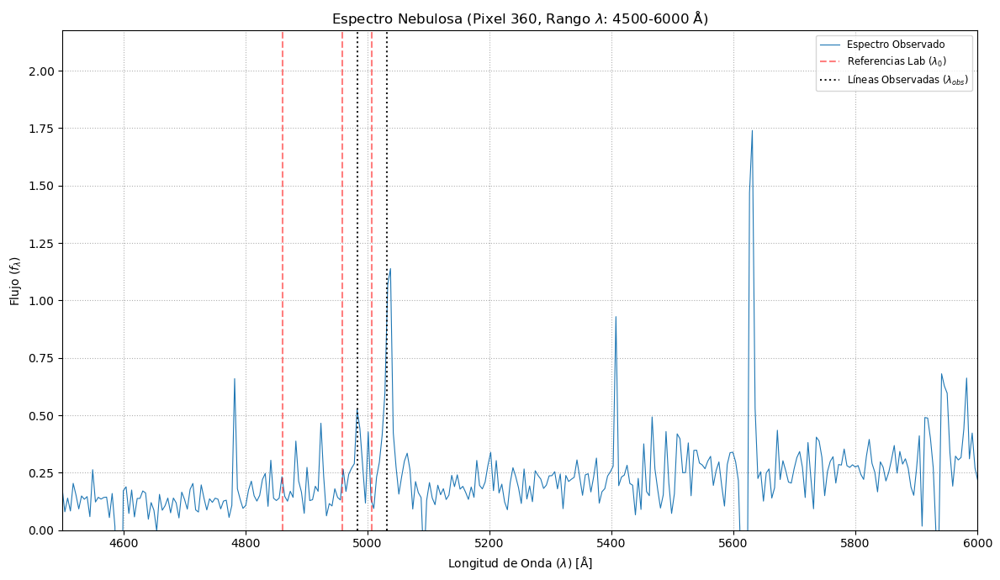

✅ Gráfico guardado: D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Picos_espectro_por_posicion\espectro_pixel_360_6000-7500.png


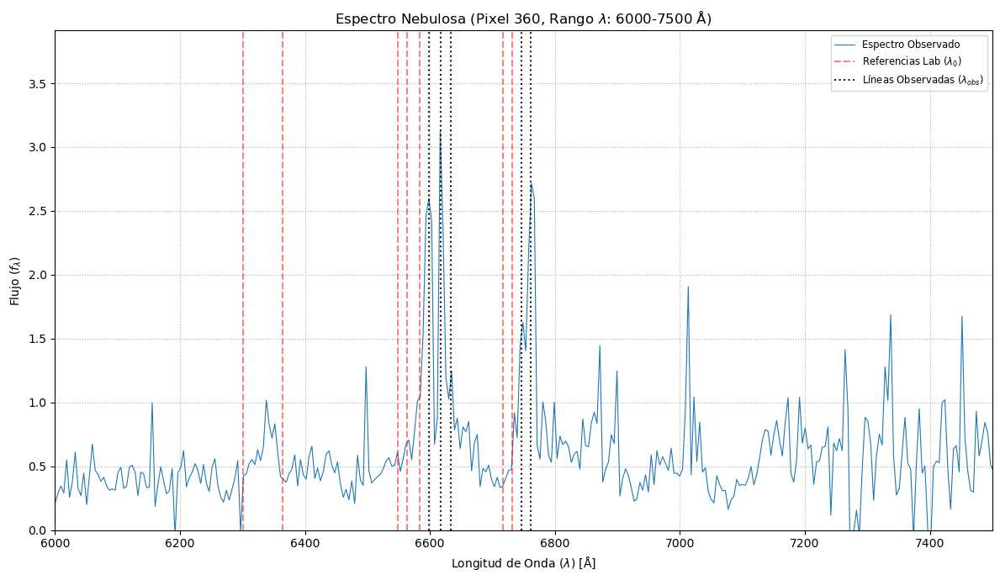


             CÁLCULOS DE VELOCIDAD RADIAL MEDIA (Pixel 360)
Velocidades individuales [km/s]:
  O_III_2 : v = 1511.36 ± 302.27
  O_III   : v = 1496.87 ± 299.37
  N_II    : v = 2289.16 ± 228.92
  H_alpha : v = 2512.43 ± 228.40
  N_II_2  : v = 2276.88 ± 227.69
  S_II_1  : v = 1338.96 ± 223.16
  S_II_2  : v = 1336.17 ± 222.70

--------------------------------------------------
Número de líneas usadas: 7
Velocidad Media Radial (Ponderada):
V_radial = 1858.70 ± 91.33 km/s
--------------------------------------------------

Resultado Final para el Píxel 360: $V_{radial} = (1858.70 \pm 91.33)\ 	ext{km/s}$

✅ Datos de velocidad ACTUALIZADOS en la lista global 'VELOCIDADES_POR_PIXEL'.


In [166]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
import os
import warnings
import csv 
import math
import re 
warnings.filterwarnings('ignore')
plt.ion()

# ==============================================================================
# 🛑 CONFIGURACIÓN DE DATOS Y RUTA 🛑
# ==============================================================================

# Se asume que la variable global 'VELOCIDADES_POR_PIXEL = []' está definida
# en una celda anterior.

try:
    PIXEL_CENTRAL = 360 
    
except NameError:
    PIXEL_CENTRAL = 360 

# --- RUTA DE GUARDADO ---
RUTA_BASE_DESEADA = r"D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Picos_espectro_por_posicion"
os.makedirs(RUTA_BASE_DESEADA, exist_ok=True)
GRAFICOS_OUTPUT_DIR = RUTA_BASE_DESEADA 


# --- CONSTANTES ---
C_LIGHT = 299792.458 # Velocidad de la luz en km/s (¡No cambiar!)


# --- DEFINICIÓN DE LÍNEAS DE REFERENCIA ---
LINEAS_LAB = {
    'H_beta': 4861.32, 
    'O_III_2': 4959.0, 
    'O_III': 5007.0, 
    'O_I_1': 6300.3, 
    'O_I_2': 6363.8, 
    'N_II': 6548.1, 
    'H_alpha': 6562.8, 
    'N_II_2': 6583.4, 
    'S_II_1': 6717.0, 
    'S_II_2': 6731.0 
}

rango_graficas = [ (4500, 6000), (6000, 7500) ]
UMBRAL_PROMINENCE = 5 

# --- CONSOLIDACIÓN DE DESPLAZAMIENTOS VISUALES (Tus valores) ---
DESPLAZAMIENTOS = {
    'H_beta': 0,
    'O_III_2': 25,
    'O_III': 25,
    'O_I_1': 0,
    'O_I_2': 0,
    'N_II': 50,
    'N_II_2': 50,
    'H_alpha': 55,
    'S_II_1': 30,
    'S_II_2': 30,
}
# --- PARÁMETROS DE ERROR ---
ERROR_LAMBDA_OBS = 5.0 # Error aproximado en la determinación de lambda_obs [Å]

# ==============================================================================
# 📢 BLOQUE INDEPENDIENTE: CÁLCULO DE TODAS LAS VELOCIDADES INDIVIDUALES
# ==============================================================================

velocidades_individuales = []

for nombre, lambda_0 in LINEAS_LAB.items():
    if nombre in DESPLAZAMIENTOS:
        desplazamiento = DESPLAZAMIENTOS[nombre]
        
        # Solo calculamos la velocidad si hay desplazamiento (como lo tenías antes)
        if desplazamiento != 0: 
            
            # --- CÁLCULO DE VELOCIDAD INDIVIDUAL ---
            v = C_LIGHT * (desplazamiento / lambda_0)
            delta_v = C_LIGHT * (ERROR_LAMBDA_OBS / lambda_0)
            
            velocidades_individuales.append({
                'Elemento': nombre,
                'v': v,
                'Delta_v': delta_v
            })

# ==============================================================================
# 1. BUCLE DE PLOTEO Y CÁLCULO (Por Rango)
# ==============================================================================

for idx_graph, (rango_min, rango_max) in enumerate(rango_graficas):
    
    plt.figure(figsize=(12, 7))
    
    etiqueta_ref_usada = False
    ETIQUETA_UNICA_REF = 'Referencias Lab ($\lambda_0$)'
    etiqueta_obs_usada = False
    ETIQUETA_UNICA_OBS = 'Líneas Observadas ($\lambda_{obs}$)'
    
    try:
        # Usando neb_spec_360
        idx_rango = np.where((wavelength_array >= rango_min) & (wavelength_array <= rango_max))
        
        if len(idx_rango[0]) == 0:
            plt.close()
            print(f"Advertencia: No hay datos en el rango {rango_min}-{rango_max} Å. Saltando gráfico.")
            continue
            
        # Aseguramos que max_y_rango se calcule sobre el segmento correcto.
        max_y_rango = np.max(neb_spec_360[idx_rango])
        
        # 1. Plotear el Espectro Observado
        plt.plot(wavelength_array, neb_spec_360, label='Espectro Observado', linewidth=0.8)
        
    except NameError:
        print("ERROR: Variables de datos (neb_spec_360, wavelength_array) no definidas. Terminando el loop de plots.")
        break
    
    # 2. Plotear Líneas de Referencia (Lab) - Rojas Discontinuas
    for nombre, lambda_0 in LINEAS_LAB.items():
        if lambda_0 < rango_min or lambda_0 > rango_max:
            continue
            
        label_ref = ETIQUETA_UNICA_REF if not etiqueta_ref_usada else None
        plt.axvline(x=lambda_0, color='r', linestyle='--', alpha=0.5, label=label_ref)
        etiqueta_ref_usada = True
    
    
    # --------------------------------------------------------------------------
    # 📢 BLOQUE PARA PLOTEAR LÍNEAS OBSERVADAS 
    # (El cálculo ya se hizo fuera del bucle de rangos)
    # --------------------------------------------------------------------------
    
    # Plotear las líneas observadas (usando el desplazamiento para lambda_obs)
    for nombre, lambda_0 in LINEAS_LAB.items():
        if rango_min <= lambda_0 < rango_max and nombre in DESPLAZAMIENTOS:
            desplazamiento = DESPLAZAMIENTOS[nombre]
            
            # Ploteamos si hay desplazamiento O si queremos que aparezca encima de la referencia
            if desplazamiento != 0: 
                lambda_obs = lambda_0 + desplazamiento
                label_obs = ETIQUETA_UNICA_OBS if not etiqueta_obs_usada else None
                plt.axvline(x=lambda_obs, color='k', linestyle=':', linewidth=1.5, alpha=0.9, label=label_obs)
                etiqueta_obs_usada = True

    # --------------------------------------------------------------------------

    # --- 3. CONFIGURACIÓN FINAL DEL PLOT ---
    
    plt.xlim([rango_min, rango_max]) 
    plt.ylim([0, max_y_rango * 1.25]) 
    
    titulo_plot = f"Espectro Nebulosa (Pixel {PIXEL_CENTRAL}, Rango $\lambda$: {rango_min}-{rango_max} Å)"
    plt.title(titulo_plot)
    plt.xlabel(r"Longitud de Onda ($\lambda$) [Å]")
    plt.ylabel(r"Flujo ($f_{\lambda}$)") 
    
    plt.grid(True, linestyle=':')
    plt.legend(loc='upper right', fontsize='small')
    plt.tight_layout(rect=[0, 0, 1, 1]) 
    
    nombre_archivo = f"espectro_pixel_{PIXEL_CENTRAL}_{rango_min}-{rango_max}.png"
    ruta_guardado_png = os.path.join(GRAFICOS_OUTPUT_DIR, nombre_archivo)
    plt.savefig(ruta_guardado_png, dpi=300)
    print(f"✅ Gráfico guardado: {ruta_guardado_png}")
    
    plt.show() 
    plt.close()

# ==============================================================================
# 4. 📈 CÁLCULO DE VELOCIDAD MEDIA Y ALMACENAMIENTO (CON REEMPLAZO)
# ==============================================================================

print("\n" + "="*70)
print(f"             CÁLCULOS DE VELOCIDAD RADIAL MEDIA (Pixel {PIXEL_CENTRAL})")
print("="*70)

if not velocidades_individuales:
    print("Advertencia: No se encontraron líneas con desplazamiento (Delta_lambda != 0) para calcular la velocidad.")
else:
    v_array = np.array([item['v'] for item in velocidades_individuales])
    dv_array = np.array([item['Delta_v'] for item in velocidades_individuales])
    
    # Cálculo de la Media Ponderada
    weights = 1 / dv_array**2
    v_media_ponderada = np.sum(v_array * weights) / np.sum(weights)
    delta_v_media = np.sqrt(1 / np.sum(weights))
    
    # --- 💡 LÓGICA DE REEMPLAZO/ACTUALIZACIÓN 💡 ---
    
    # 1. Creamos la nueva entrada de datos
    nueva_entrada = {
        'Pixel_Central': PIXEL_CENTRAL,
        'V_Media': v_media_ponderada,
        'Delta_V_Media': delta_v_media,
        'V_Lineas': {item['Elemento']: {'v': item['v'], 'Delta_v': item['Delta_v']} 
                     for item in velocidades_individuales}
    }
    
    # 2. Buscamos y eliminamos entradas antiguas para este píxel
    indices_a_eliminar = []
    for i, entrada in enumerate(VELOCIDADES_POR_PIXEL):
        if entrada['Pixel_Central'] == PIXEL_CENTRAL:
            indices_a_eliminar.append(i)
            
    # Eliminamos desde el final para no alterar los índices que quedan por eliminar
    for i in sorted(indices_a_eliminar, reverse=True):
        del VELOCIDADES_POR_PIXEL[i]
        
    # 3. Añadimos la nueva entrada (la versión actualizada)
    VELOCIDADES_POR_PIXEL.append(nueva_entrada)

    # -----------------------------------------------

    print("Velocidades individuales [km/s]:")
    for item in velocidades_individuales:
        print(f"  {item['Elemento']:<8}: v = {item['v']:.2f} ± {item['Delta_v']:.2f}")

    print("\n--------------------------------------------------")
    print(f"Número de líneas usadas: {len(v_array)}")
    print(f"Velocidad Media Radial (Ponderada):")
    print(f"V_radial = {v_media_ponderada:.2f} ± {delta_v_media:.2f} km/s")
    print("--------------------------------------------------")
    
    # --- LÍNEA SOLICITADA ---
    print(f"\nResultado Final para el Píxel {PIXEL_CENTRAL}: $V_{{radial}} = ({v_media_ponderada:.2f} \pm {delta_v_media:.2f})\ \text{{km/s}}$")
    
    print("\n✅ Datos de velocidad ACTUALIZADOS en la lista global 'VELOCIDADES_POR_PIXEL'.")
       

In [410]:
print(VELOCIDADES_POR_PIXEL)


[{'Pixel_Central': 360, 'V_Media': np.float64(1858.7045403006393), 'Delta_V_Media': np.float64(91.32965714897543), 'V_Lineas': {'O_III_2': {'v': 1511.355404315386, 'Delta_v': 302.2710808630772}, 'O_III': {'v': 1496.866676652686, 'Delta_v': 299.37333533053726}, 'N_II': {'v': 2289.1560758082496, 'Delta_v': 228.91560758082494}, 'H_alpha': {'v': 2512.4314606570365, 'Delta_v': 228.40286005973059}, 'N_II_2': {'v': 2276.8816872740526, 'Delta_v': 227.6881687274053}, 'S_II_1': {'v': 1338.9569361322017, 'Delta_v': 223.15948935536696}, 'S_II_2': {'v': 1336.1720011885307, 'Delta_v': 222.69533353142177}}}]


# Región 2

In [168]:
neb_spec_400 = neb_spec_red[:,400:406]
sky_spec_6 = neb_spec_red[:,1000:1006]
sky_spec_6 = np.sum(sky_spec_6, axis=1)
neb_spec_400 = np.sum(neb_spec_400,axis=1)
neb_spec_400 = neb_spec_400 - sky_spec_6

✅ Gráfico guardado: D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Picos_espectro_por_posicion\espectro_pixel_400_4500-6000.png


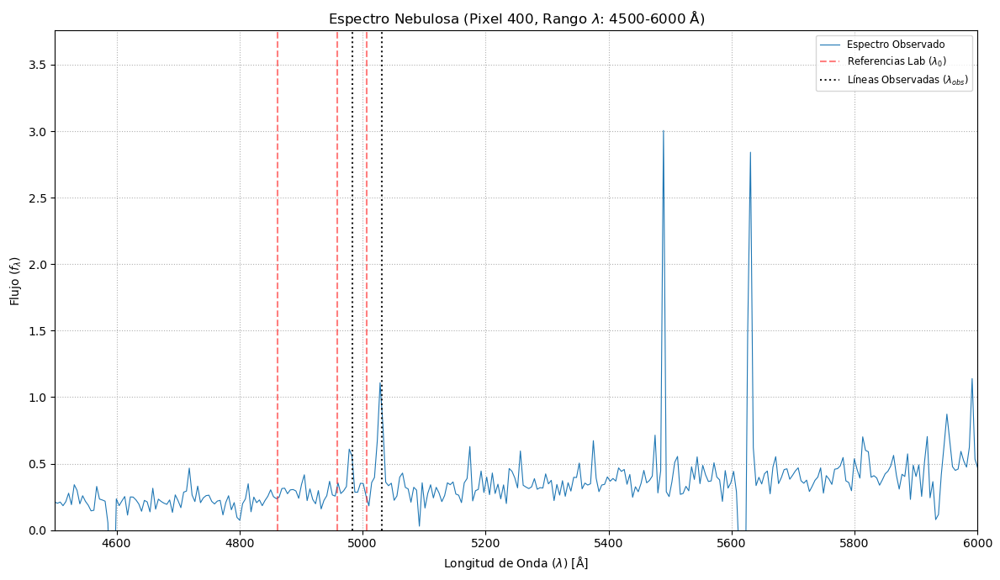

✅ Gráfico guardado: D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Picos_espectro_por_posicion\espectro_pixel_400_6000-7500.png


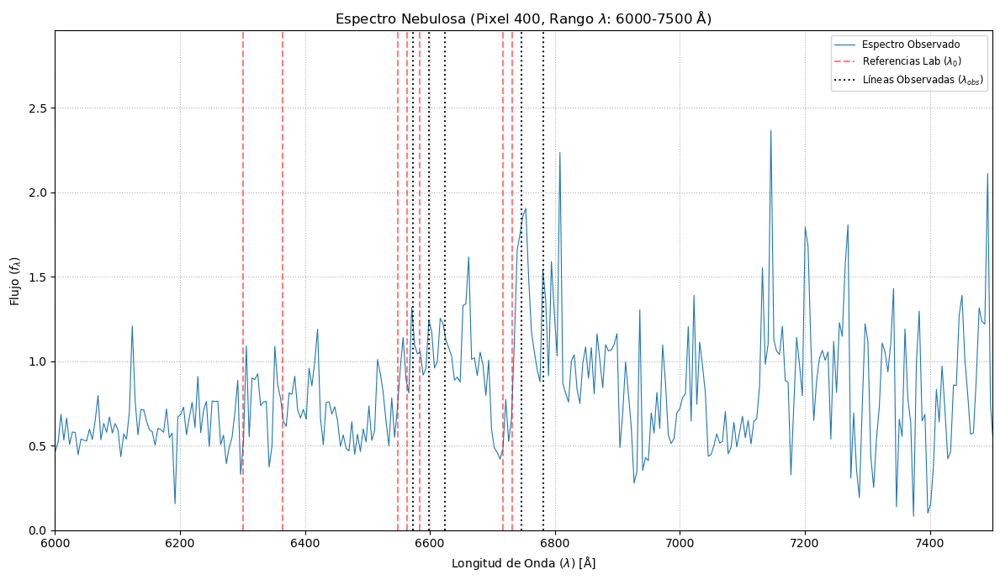


             CÁLCULOS DE VELOCIDAD RADIAL MEDIA (Pixel 400)
Velocidades individuales [km/s]:
  O_III_2 : v = 1511.36 ± 302.27
  O_III   : v = 1496.87 ± 299.37
  N_II    : v = 1144.58 ± 228.92
  H_alpha : v = 1598.82 ± 228.40
  N_II_2  : v = 1821.51 ± 227.69
  S_II_1  : v = 1338.96 ± 223.16
  S_II_2  : v = 2226.95 ± 222.70

--------------------------------------------------
Número de líneas usadas: 7
Velocidad Media Radial (Ponderada):
V_radial = 1606.99 ± 91.33 km/s
--------------------------------------------------

Resultado Final para el Píxel 400: $V_{radial} = (1606.99 \pm 91.33)\ 	ext{km/s}$

✅ Datos de velocidad ACTUALIZADOS en la lista global 'VELOCIDADES_POR_PIXEL'.


In [255]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
import os
import warnings
import csv 
import math
import re 
warnings.filterwarnings('ignore')
plt.ion()

# ==============================================================================
# 🛑 CONFIGURACIÓN DE DATOS Y RUTA 🛑
# ==============================================================================

# Se asume que la variable global 'VELOCIDADES_POR_PIXEL = []' está definida
# en una celda anterior y que las variables 'neb_spec_400' y 'wavelength_array' 
# están cargadas en la memoria.

try:
    # ✅ PÍXEL CAMBIADO A 400
    PIXEL_CENTRAL = 400 
    
except NameError:
    PIXEL_CENTRAL = 400 

# --- RUTA DE GUARDADO ---
RUTA_BASE_DESEADA = r"D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Picos_espectro_por_posicion"
os.makedirs(RUTA_BASE_DESEADA, exist_ok=True)
GRAFICOS_OUTPUT_DIR = RUTA_BASE_DESEADA 


# --- CONSTANTES ---
C_LIGHT = 299792.458 # Velocidad de la luz en km/s (¡No cambiar!)


# --- DEFINICIÓN DE LÍNEAS DE REFERENCIA ---
LINEAS_LAB = {
    'H_beta': 4861.32, 
    'O_III_2': 4959.0, 
    'O_III': 5007.0, 
    'O_I_1': 6300.3, 
    'O_I_2': 6363.8, 
    'N_II': 6548.1, 
    'H_alpha': 6562.8, 
    'N_II_2': 6583.4, 
    'S_II_1': 6717.0, 
    'S_II_2': 6731.0 
}

rango_graficas = [ (4500, 6000), (6000, 7500) ]
UMBRAL_PROMINENCE = 5 

# --- CONSOLIDACIÓN DE DESPLAZAMIENTOS VISUALES (Tus valores) ---
DESPLAZAMIENTOS = {
    'H_beta': 0,
    'O_III_2': 25,
    'O_III': 25,
    'O_I_1': 0,
    'O_I_2': 0,
    'N_II': 25,
    'N_II_2': 40,
    'H_alpha': 35,
    'S_II_1': 30,
    'S_II_2': 50,
}
# --- PARÁMETROS DE ERROR ---
ERROR_LAMBDA_OBS = 5.0 # Error aproximado en la determinación de lambda_obs [Å]

# ==============================================================================
# 📢 BLOQUE INDEPENDIENTE: CÁLCULO DE TODAS LAS VELOCIDADES INDIVIDUALES
# ==============================================================================

velocidades_individuales = []

for nombre, lambda_0 in LINEAS_LAB.items():
    if nombre in DESPLAZAMIENTOS:
        desplazamiento = DESPLAZAMIENTOS[nombre]
        
        # Solo calculamos la velocidad si hay desplazamiento
        if desplazamiento != 0: 
            
            # --- CÁLCULO DE VELOCIDAD INDIVIDUAL ---
            v = C_LIGHT * (desplazamiento / lambda_0)
            delta_v = C_LIGHT * (ERROR_LAMBDA_OBS / lambda_0)
            
            velocidades_individuales.append({
                'Elemento': nombre,
                'v': v,
                'Delta_v': delta_v
            })

# ==============================================================================
# 1. BUCLE DE PLOTEO Y CÁLCULO (Por Rango)
# ==============================================================================

for idx_graph, (rango_min, rango_max) in enumerate(rango_graficas):
    
    plt.figure(figsize=(12, 7))
    
    etiqueta_ref_usada = False
    ETIQUETA_UNICA_REF = 'Referencias Lab ($\lambda_0$)'
    etiqueta_obs_usada = False
    ETIQUETA_UNICA_OBS = 'Líneas Observadas ($\lambda_{obs}$)'
    
    try:
        # ✅ USANDO neb_spec_400
        idx_rango = np.where((wavelength_array >= rango_min) & (wavelength_array <= rango_max))
        
        if len(idx_rango[0]) == 0:
            plt.close()
            print(f"Advertencia: No hay datos en el rango {rango_min}-{rango_max} Å. Saltando gráfico.")
            continue
            
        # Aseguramos que max_y_rango se calcule sobre el segmento correcto.
        # ✅ USANDO neb_spec_400
        max_y_rango = np.max(neb_spec_400[idx_rango])
        
        # 1. Plotear el Espectro Observado
        # ✅ USANDO neb_spec_400
        plt.plot(wavelength_array, neb_spec_400, label='Espectro Observado', linewidth=0.8)
        
    except NameError:
        # Se ajusta el mensaje de error
        print("ERROR: Variables de datos (neb_spec_400, wavelength_array) no definidas. Terminando el loop de plots.")
        break
    
    # 2. Plotear Líneas de Referencia (Lab) - Rojas Discontinuas
    for nombre, lambda_0 in LINEAS_LAB.items():
        if lambda_0 < rango_min or lambda_0 > rango_max:
            continue
            
        label_ref = ETIQUETA_UNICA_REF if not etiqueta_ref_usada else None
        plt.axvline(x=lambda_0, color='r', linestyle='--', alpha=0.5, label=label_ref)
        etiqueta_ref_usada = True
    
    
    # --------------------------------------------------------------------------
    # 📢 BLOQUE PARA PLOTEAR LÍNEAS OBSERVADAS 
    # --------------------------------------------------------------------------
    
    # Plotear las líneas observadas (usando el desplazamiento para lambda_obs)
    for nombre, lambda_0 in LINEAS_LAB.items():
        if rango_min <= lambda_0 < rango_max and nombre in DESPLAZAMIENTOS:
            desplazamiento = DESPLAZAMIENTOS[nombre]
            
            # Ploteamos solo si hay desplazamiento
            if desplazamiento != 0: 
                lambda_obs = lambda_0 + desplazamiento
                label_obs = ETIQUETA_UNICA_OBS if not etiqueta_obs_usada else None
                plt.axvline(x=lambda_obs, color='k', linestyle=':', linewidth=1.5, alpha=0.9, label=label_obs)
                etiqueta_obs_usada = True

    # --------------------------------------------------------------------------

    # --- 3. CONFIGURACIÓN FINAL DEL PLOT ---
    
    plt.xlim([rango_min, rango_max]) 
    plt.ylim([0, max_y_rango * 1.25]) 
    
    # ✅ Título ajustado al PIXEL_CENTRAL 400
    titulo_plot = f"Espectro Nebulosa (Pixel {PIXEL_CENTRAL}, Rango $\lambda$: {rango_min}-{rango_max} Å)"
    plt.title(titulo_plot)
    plt.xlabel(r"Longitud de Onda ($\lambda$) [Å]")
    plt.ylabel(r"Flujo ($f_{\lambda}$)") 
    
    plt.grid(True, linestyle=':')
    plt.legend(loc='upper right', fontsize='small')
    plt.tight_layout(rect=[0, 0, 1, 1]) 
    
    # ✅ Nombre de archivo ajustado al PIXEL_CENTRAL 400
    nombre_archivo = f"espectro_pixel_{PIXEL_CENTRAL}_{rango_min}-{rango_max}.png"
    ruta_guardado_png = os.path.join(GRAFICOS_OUTPUT_DIR, nombre_archivo)
    plt.savefig(ruta_guardado_png, dpi=300)
    print(f"✅ Gráfico guardado: {ruta_guardado_png}")
    
    plt.show() 
    plt.close()

# ==============================================================================
# 4. 📈 CÁLCULO DE VELOCIDAD MEDIA Y ALMACENAMIENTO (CON REEMPLAZO)
# ==============================================================================

print("\n" + "="*70)
print(f"             CÁLCULOS DE VELOCIDAD RADIAL MEDIA (Pixel {PIXEL_CENTRAL})")
print("="*70)

if not velocidades_individuales:
    print("Advertencia: No se encontraron líneas con desplazamiento (Delta_lambda != 0) para calcular la velocidad.")
else:
    v_array = np.array([item['v'] for item in velocidades_individuales])
    dv_array = np.array([item['Delta_v'] for item in velocidades_individuales])
    
    # Cálculo de la Media Ponderada
    weights = 1 / dv_array**2
    v_media_ponderada = np.sum(v_array * weights) / np.sum(weights)
    delta_v_media = np.sqrt(1 / np.sum(weights))
    
    # --- 💡 LÓGICA DE REEMPLAZO/ACTUALIZACIÓN 💡 ---
    
    # 1. Creamos la nueva entrada de datos
    nueva_entrada = {
        'Pixel_Central': PIXEL_CENTRAL,
        'V_Media': v_media_ponderada,
        'Delta_V_Media': delta_v_media,
        'V_Lineas': {item['Elemento']: {'v': item['v'], 'Delta_v': item['Delta_v']} 
                     for item in velocidades_individuales}
    }
    
    # 2. Buscamos y eliminamos entradas antiguas para este píxel
    indices_a_eliminar = []
    for i, entrada in enumerate(VELOCIDADES_POR_PIXEL):
        if entrada['Pixel_Central'] == PIXEL_CENTRAL:
            indices_a_eliminar.append(i)
            
    # Eliminamos desde el final para no alterar los índices que quedan por eliminar
    for i in sorted(indices_a_eliminar, reverse=True):
        del VELOCIDADES_POR_PIXEL[i]
        
    # 3. Añadimos la nueva entrada (la versión actualizada)
    VELOCIDADES_POR_PIXEL.append(nueva_entrada)

    # -----------------------------------------------

    print("Velocidades individuales [km/s]:")
    for item in velocidades_individuales:
        print(f"  {item['Elemento']:<8}: v = {item['v']:.2f} ± {item['Delta_v']:.2f}")

    print("\n--------------------------------------------------")
    print(f"Número de líneas usadas: {len(v_array)}")
    print(f"Velocidad Media Radial (Ponderada):")
    print(f"V_radial = {v_media_ponderada:.2f} ± {delta_v_media:.2f} km/s")
    print("--------------------------------------------------")
    
    # --- LÍNEA SOLICITADA ---
    print(f"\nResultado Final para el Píxel {PIXEL_CENTRAL}: $V_{{radial}} = ({v_media_ponderada:.2f} \pm {delta_v_media:.2f})\ \text{{km/s}}$")
    
    print("\n✅ Datos de velocidad ACTUALIZADOS en la lista global 'VELOCIDADES_POR_PIXEL'.")

# Región 3

In [172]:
neb_spec_425 = neb_spec_red[:,425:431]
sky_spec_6 = neb_spec_red[:,1000:1006]
sky_spec_6 = np.sum(sky_spec_6, axis=1)
neb_spec_425 = np.sum(neb_spec_425,axis=1)
neb_spec_425 = neb_spec_425 - sky_spec_6

✅ Gráfico guardado: D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Picos_espectro_por_posicion\espectro_pixel_425_4500-6000.png


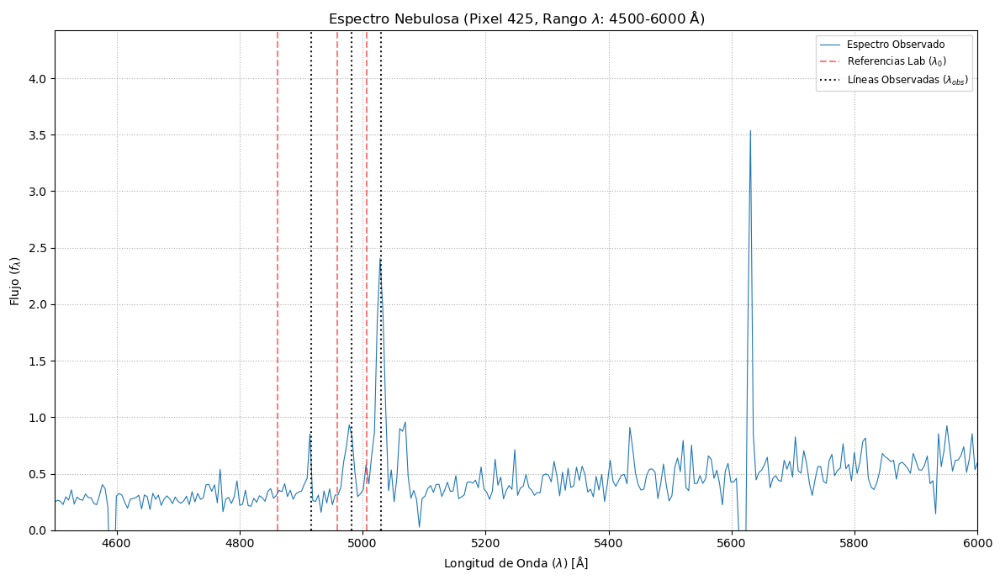

✅ Gráfico guardado: D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Picos_espectro_por_posicion\espectro_pixel_425_6000-7500.png


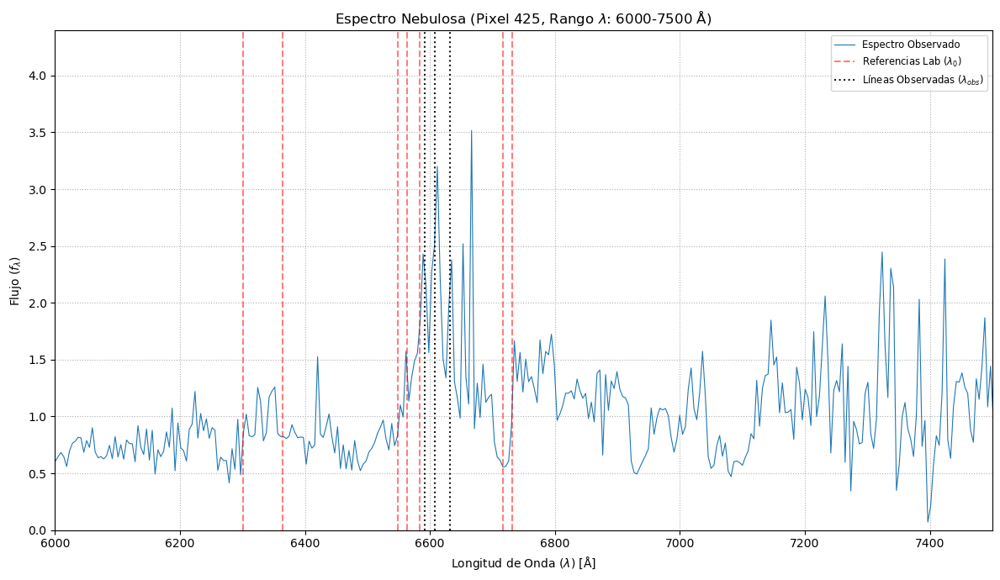


             CÁLCULOS DE VELOCIDAD RADIAL MEDIA (Pixel 425)
Velocidades individuales [km/s]:
  H_beta  : v = 3391.79 ± 308.34
  O_III_2 : v = 1390.45 ± 302.27
  O_III   : v = 1377.12 ± 299.37
  N_II    : v = 1968.67 ± 228.92
  H_alpha : v = 2055.63 ± 228.40
  N_II_2  : v = 2185.81 ± 227.69

--------------------------------------------------
Número de líneas usadas: 6
Velocidad Media Radial (Ponderada):
V_radial = 2056.23 ± 105.31 km/s
--------------------------------------------------

Resultado Final para el Píxel 425: $V_{radial} = (2056.23 \pm 105.31)\ 	ext{km/s}$

✅ Datos de velocidad ACTUALIZADOS en la lista global 'VELOCIDADES_POR_PIXEL'.


In [174]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
import os
import warnings
import csv 
import math
import re 
warnings.filterwarnings('ignore')
plt.ion()

# ==============================================================================
# 🛑 CONFIGURACIÓN DE DATOS Y RUTA 🛑
# ==============================================================================

# Se asume que la variable global 'VELOCIDADES_POR_PIXEL = []' está definida
# en una celda anterior y que las variables 'neb_spec_425' y 'wavelength_array' 
# están cargadas en la memoria.

try:
    # ✅ PÍXEL CAMBIADO A 425
    PIXEL_CENTRAL = 425 
    
except NameError:
    PIXEL_CENTRAL = 425 

# --- RUTA DE GUARDADO ---
RUTA_BASE_DESEADA = r"D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Picos_espectro_por_posicion"
os.makedirs(RUTA_BASE_DESEADA, exist_ok=True)
GRAFICOS_OUTPUT_DIR = RUTA_BASE_DESEADA 


# --- CONSTANTES ---
C_LIGHT = 299792.458 # Velocidad de la luz en km/s (¡No cambiar!)


# --- DEFINICIÓN DE LÍNEAS DE REFERENCIA ---
LINEAS_LAB = {
    'H_beta': 4861.32, 
    'O_III_2': 4959.0, 
    'O_III': 5007.0, 
    'O_I_1': 6300.3, 
    'O_I_2': 6363.8, 
    'N_II': 6548.1, 
    'H_alpha': 6562.8, 
    'N_II_2': 6583.4, 
    'S_II_1': 6717.0, 
    'S_II_2': 6731.0 
}

rango_graficas = [ (4500, 6000), (6000, 7500) ]
UMBRAL_PROMINENCE = 5 

# --- CONSOLIDACIÓN DE DESPLAZAMIENTOS VISUALES (Tus valores) ---
# NOTA: DEBES AJUSTAR ESTOS VALORES si los desplazamientos son diferentes en el píxel 425
DESPLAZAMIENTOS = {
    'H_beta': 55,
    'O_III_2': 23,
    'O_III': 23,
    'O_I_1': 0,
    'O_I_2': 0,
    'N_II': 43,
    'N_II_2': 48,
    'H_alpha': 45,
    'S_II_1': 0,
    'S_II_2': 0,
}
# --- PARÁMETROS DE ERROR ---
ERROR_LAMBDA_OBS = 5.0 # Error aproximado en la determinación de lambda_obs [Å]

# ==============================================================================
# 📢 BLOQUE INDEPENDIENTE: CÁLCULO DE TODAS LAS VELOCIDADES INDIVIDUALES
# ==============================================================================

velocidades_individuales = []

for nombre, lambda_0 in LINEAS_LAB.items():
    if nombre in DESPLAZAMIENTOS:
        desplazamiento = DESPLAZAMIENTOS[nombre]
        
        # Solo calculamos la velocidad si hay desplazamiento
        if desplazamiento != 0: 
            
            # --- CÁLCULO DE VELOCIDAD INDIVIDUAL ---
            v = C_LIGHT * (desplazamiento / lambda_0)
            delta_v = C_LIGHT * (ERROR_LAMBDA_OBS / lambda_0)
            
            velocidades_individuales.append({
                'Elemento': nombre,
                'v': v,
                'Delta_v': delta_v
            })

# ==============================================================================
# 1. BUCLE DE PLOTEO Y CÁLCULO (Por Rango)
# ==============================================================================

for idx_graph, (rango_min, rango_max) in enumerate(rango_graficas):
    
    plt.figure(figsize=(12, 7))
    
    etiqueta_ref_usada = False
    ETIQUETA_UNICA_REF = 'Referencias Lab ($\lambda_0$)'
    etiqueta_obs_usada = False
    ETIQUETA_UNICA_OBS = 'Líneas Observadas ($\lambda_{obs}$)'
    
    try:
        # ✅ USANDO neb_spec_425
        idx_rango = np.where((wavelength_array >= rango_min) & (wavelength_array <= rango_max))
        
        if len(idx_rango[0]) == 0:
            plt.close()
            print(f"Advertencia: No hay datos en el rango {rango_min}-{rango_max} Å. Saltando gráfico.")
            continue
            
        # Aseguramos que max_y_rango se calcule sobre el segmento correcto.
        # ✅ USANDO neb_spec_425
        max_y_rango = np.max(neb_spec_425[idx_rango])
        
        # 1. Plotear el Espectro Observado
        # ✅ USANDO neb_spec_425
        plt.plot(wavelength_array, neb_spec_425, label='Espectro Observado', linewidth=0.8)
        
    except NameError:
        # Se ajusta el mensaje de error
        print("ERROR: Variables de datos (neb_spec_425, wavelength_array) no definidas. Terminando el loop de plots.")
        break
    
    # 2. Plotear Líneas de Referencia (Lab) - Rojas Discontinuas
    for nombre, lambda_0 in LINEAS_LAB.items():
        if lambda_0 < rango_min or lambda_0 > rango_max:
            continue
            
        label_ref = ETIQUETA_UNICA_REF if not etiqueta_ref_usada else None
        plt.axvline(x=lambda_0, color='r', linestyle='--', alpha=0.5, label=label_ref)
        etiqueta_ref_usada = True
    
    
    # --------------------------------------------------------------------------
    # 📢 BLOQUE PARA PLOTEAR LÍNEAS OBSERVADAS 
    # --------------------------------------------------------------------------
    
    # Plotear las líneas observadas (usando el desplazamiento para lambda_obs)
    for nombre, lambda_0 in LINEAS_LAB.items():
        if rango_min <= lambda_0 < rango_max and nombre in DESPLAZAMIENTOS:
            desplazamiento = DESPLAZAMIENTOS[nombre]
            
            # Ploteamos solo si hay desplazamiento
            if desplazamiento != 0: 
                lambda_obs = lambda_0 + desplazamiento
                label_obs = ETIQUETA_UNICA_OBS if not etiqueta_obs_usada else None
                plt.axvline(x=lambda_obs, color='k', linestyle=':', linewidth=1.5, alpha=0.9, label=label_obs)
                etiqueta_obs_usada = True

    # --------------------------------------------------------------------------

    # --- 3. CONFIGURACIÓN FINAL DEL PLOT ---
    
    plt.xlim([rango_min, rango_max]) 
    plt.ylim([0, max_y_rango * 1.25]) 
    
    # ✅ Título ajustado al PIXEL_CENTRAL 425
    titulo_plot = f"Espectro Nebulosa (Pixel {PIXEL_CENTRAL}, Rango $\lambda$: {rango_min}-{rango_max} Å)"
    plt.title(titulo_plot)
    plt.xlabel(r"Longitud de Onda ($\lambda$) [Å]")
    plt.ylabel(r"Flujo ($f_{\lambda}$)") 
    
    plt.grid(True, linestyle=':')
    plt.legend(loc='upper right', fontsize='small')
    plt.tight_layout(rect=[0, 0, 1, 1]) 
    
    # ✅ Nombre de archivo ajustado al PIXEL_CENTRAL 425
    nombre_archivo = f"espectro_pixel_{PIXEL_CENTRAL}_{rango_min}-{rango_max}.png"
    ruta_guardado_png = os.path.join(GRAFICOS_OUTPUT_DIR, nombre_archivo)
    plt.savefig(ruta_guardado_png, dpi=300)
    print(f"✅ Gráfico guardado: {ruta_guardado_png}")
    
    plt.show() 
    plt.close()

# ==============================================================================
# 4. 📈 CÁLCULO DE VELOCIDAD MEDIA Y ALMACENAMIENTO (CON REEMPLAZO)
# ==============================================================================

print("\n" + "="*70)
print(f"             CÁLCULOS DE VELOCIDAD RADIAL MEDIA (Pixel {PIXEL_CENTRAL})")
print("="*70)

if not velocidades_individuales:
    print("Advertencia: No se encontraron líneas con desplazamiento (Delta_lambda != 0) para calcular la velocidad.")
else:
    v_array = np.array([item['v'] for item in velocidades_individuales])
    dv_array = np.array([item['Delta_v'] for item in velocidades_individuales])
    
    # Cálculo de la Media Ponderada
    weights = 1 / dv_array**2
    v_media_ponderada = np.sum(v_array * weights) / np.sum(weights)
    delta_v_media = np.sqrt(1 / np.sum(weights))
    
    # --- 💡 LÓGICA DE REEMPLAZO/ACTUALIZACIÓN 💡 ---
    
    # 1. Creamos la nueva entrada de datos
    nueva_entrada = {
        'Pixel_Central': PIXEL_CENTRAL,
        'V_Media': v_media_ponderada,
        'Delta_V_Media': delta_v_media,
        'V_Lineas': {item['Elemento']: {'v': item['v'], 'Delta_v': item['Delta_v']} 
                     for item in velocidades_individuales}
    }
    
    # 2. Buscamos y eliminamos entradas antiguas para este píxel
    indices_a_eliminar = []
    for i, entrada in enumerate(VELOCIDADES_POR_PIXEL):
        if entrada['Pixel_Central'] == PIXEL_CENTRAL:
            indices_a_eliminar.append(i)
            
    # Eliminamos desde el final para no alterar los índices que quedan por eliminar
    for i in sorted(indices_a_eliminar, reverse=True):
        del VELOCIDADES_POR_PIXEL[i]
        
    # 3. Añadimos la nueva entrada (la versión actualizada)
    VELOCIDADES_POR_PIXEL.append(nueva_entrada)

    # -----------------------------------------------

    print("Velocidades individuales [km/s]:")
    for item in velocidades_individuales:
        print(f"  {item['Elemento']:<8}: v = {item['v']:.2f} ± {item['Delta_v']:.2f}")

    print("\n--------------------------------------------------")
    print(f"Número de líneas usadas: {len(v_array)}")
    print(f"Velocidad Media Radial (Ponderada):")
    print(f"V_radial = {v_media_ponderada:.2f} ± {delta_v_media:.2f} km/s")
    print("--------------------------------------------------")
    
    # --- LÍNEA SOLICITADA ---
    print(f"\nResultado Final para el Píxel {PIXEL_CENTRAL}: $V_{{radial}} = ({v_media_ponderada:.2f} \pm {delta_v_media:.2f})\ \text{{km/s}}$")
    
    print("\n✅ Datos de velocidad ACTUALIZADOS en la lista global 'VELOCIDADES_POR_PIXEL'.")

# Región 4

In [176]:
neb_spec_466 = neb_spec_red[:,466:472]
sky_spec_6 = neb_spec_red[:,1000:1006]
sky_spec_6 = np.sum(sky_spec_6, axis=1)
neb_spec_466 = np.sum(neb_spec_466,axis=1)
neb_spec_466 = neb_spec_466 - sky_spec_6

✅ Gráfico guardado: D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Picos_espectro_por_posicion\espectro_pixel_466_4500-6000.png


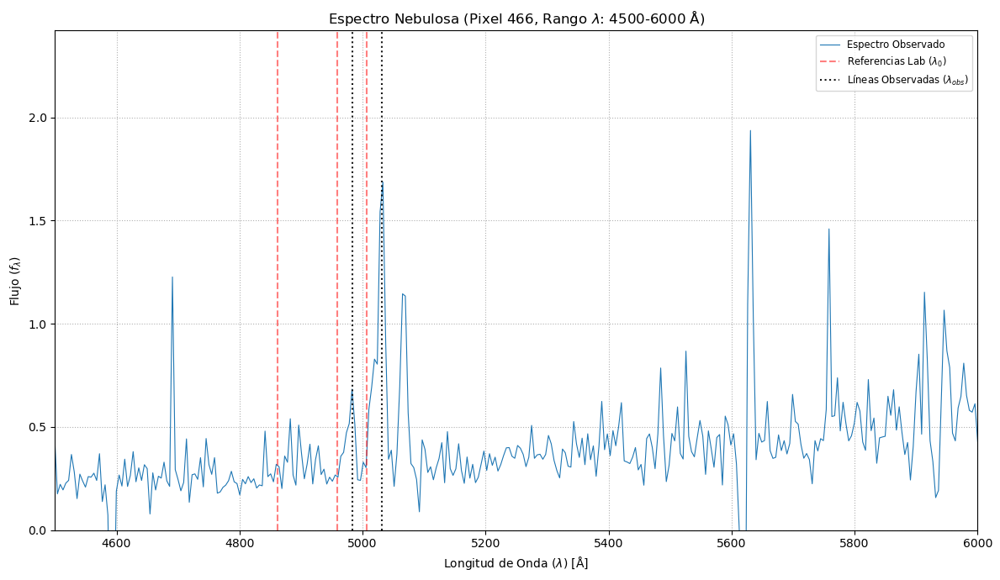

✅ Gráfico guardado: D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Picos_espectro_por_posicion\espectro_pixel_466_6000-7500.png


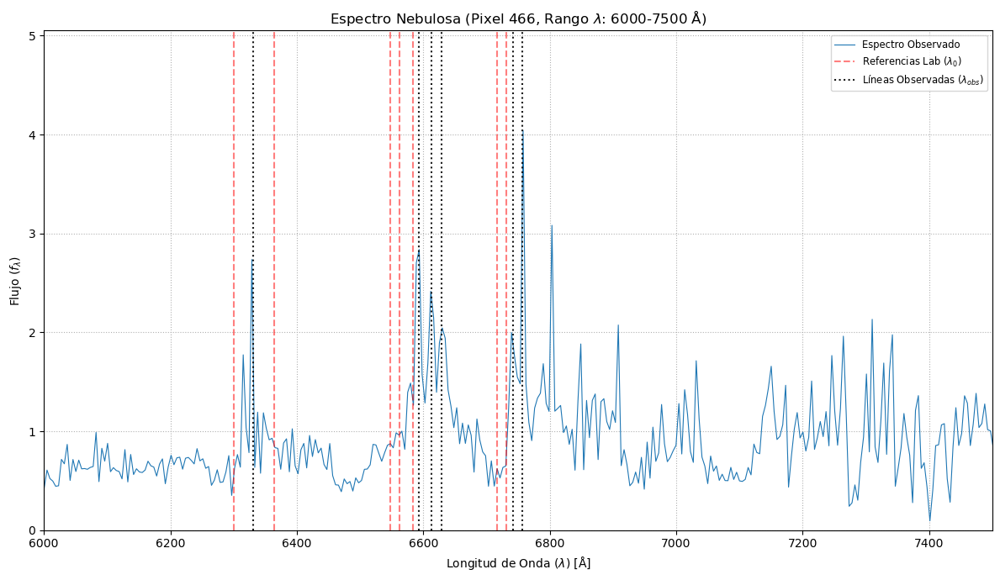


             CÁLCULOS DE VELOCIDAD RADIAL MEDIA (Pixel 466)
Velocidades individuales [km/s]:
  O_III_2 : v = 1511.36 ± 302.27
  O_III   : v = 1496.87 ± 299.37
  O_I_1   : v = 1427.52 ± 237.92
  N_II    : v = 2060.24 ± 228.92
  H_alpha : v = 2284.03 ± 228.40
  N_II_2  : v = 2049.19 ± 227.69
  S_II_1  : v = 1115.80 ± 223.16
  S_II_2  : v = 1113.48 ± 222.70

--------------------------------------------------
Número de líneas usadas: 8
Velocidad Media Radial (Ponderada):
V_radial = 1642.59 ± 85.26 km/s
--------------------------------------------------

Resultado Final para el Píxel 466: $V_{radial} = (1642.59 \pm 85.26)\ 	ext{km/s}$

✅ Datos de velocidad ACTUALIZADOS en la lista global 'VELOCIDADES_POR_PIXEL'.


In [178]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
import os
import warnings
import csv 
import math
import re 
warnings.filterwarnings('ignore')
plt.ion()

# ==============================================================================
# 🛑 CONFIGURACIÓN DE DATOS Y RUTA 🛑
# ==============================================================================

# Se asume que la variable global 'VELOCIDADES_POR_PIXEL = []' está definida
# en una celda anterior y que las variables 'neb_spec_466' y 'wavelength_array' 
# están cargadas en la memoria.

try:
    # ✅ PÍXEL CAMBIADO A 466
    PIXEL_CENTRAL = 466 
    
except NameError:
    PIXEL_CENTRAL = 466 

# --- RUTA DE GUARDADO ---
RUTA_BASE_DESEADA = r"D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Picos_espectro_por_posicion"
os.makedirs(RUTA_BASE_DESEADA, exist_ok=True)
GRAFICOS_OUTPUT_DIR = RUTA_BASE_DESEADA 


# --- CONSTANTES ---
C_LIGHT = 299792.458 # Velocidad de la luz en km/s (¡No cambiar!)


# --- DEFINICIÓN DE LÍNEAS DE REFERENCIA ---
LINEAS_LAB = {
    'H_beta': 4861.32, 
    'O_III_2': 4959.0, 
    'O_III': 5007.0, 
    'O_I_1': 6300.3, 
    'O_I_2': 6363.8, 
    'N_II': 6548.1, 
    'H_alpha': 6562.8, 
    'N_II_2': 6583.4, 
    'S_II_1': 6717.0, 
    'S_II_2': 6731.0 
}

rango_graficas = [ (4500, 6000), (6000, 7500) ]
UMBRAL_PROMINENCE = 5 

# --- CONSOLIDACIÓN DE DESPLAZAMIENTOS VISUALES (Tus valores) ---
# NOTA: AJUSTA ESTOS VALORES si los desplazamientos son diferentes en el píxel 466
DESPLAZAMIENTOS = {
    'H_beta': 0,
    'O_III_2': 25,
    'O_III': 25,
    'O_I_1': 30,
    'O_I_2': 0,
    'N_II': 45,
    'N_II_2': 45,
    'H_alpha': 50,
    'S_II_1': 25,
    'S_II_2': 25,
}
# --- PARÁMETROS DE ERROR ---
ERROR_LAMBDA_OBS = 5.0 # Error aproximado en la determinación de lambda_obs [Å]

# ==============================================================================
# 📢 BLOQUE INDEPENDIENTE: CÁLCULO DE TODAS LAS VELOCIDADES INDIVIDUALES
# ==============================================================================

velocidades_individuales = []

for nombre, lambda_0 in LINEAS_LAB.items():
    if nombre in DESPLAZAMIENTOS:
        desplazamiento = DESPLAZAMIENTOS[nombre]
        
        # Solo calculamos la velocidad si hay desplazamiento
        if desplazamiento != 0: 
            
            # --- CÁLCULO DE VELOCIDAD INDIVIDUAL ---
            v = C_LIGHT * (desplazamiento / lambda_0)
            delta_v = C_LIGHT * (ERROR_LAMBDA_OBS / lambda_0)
            
            velocidades_individuales.append({
                'Elemento': nombre,
                'v': v,
                'Delta_v': delta_v
            })

# ==============================================================================
# 1. BUCLE DE PLOTEO Y CÁLCULO (Por Rango)
# ==============================================================================

for idx_graph, (rango_min, rango_max) in enumerate(rango_graficas):
    
    plt.figure(figsize=(12, 7))
    
    etiqueta_ref_usada = False
    ETIQUETA_UNICA_REF = 'Referencias Lab ($\lambda_0$)'
    etiqueta_obs_usada = False
    ETIQUETA_UNICA_OBS = 'Líneas Observadas ($\lambda_{obs}$)'
    
    try:
        # ✅ USANDO neb_spec_466
        idx_rango = np.where((wavelength_array >= rango_min) & (wavelength_array <= rango_max))
        
        if len(idx_rango[0]) == 0:
            plt.close()
            print(f"Advertencia: No hay datos en el rango {rango_min}-{rango_max} Å. Saltando gráfico.")
            continue
            
        # Aseguramos que max_y_rango se calcule sobre el segmento correcto.
        # ✅ USANDO neb_spec_466
        max_y_rango = np.max(neb_spec_466[idx_rango])
        
        # 1. Plotear el Espectro Observado
        # ✅ USANDO neb_spec_466
        plt.plot(wavelength_array, neb_spec_466, label='Espectro Observado', linewidth=0.8)
        
    except NameError:
        # Se ajusta el mensaje de error
        print("ERROR: Variables de datos (neb_spec_466, wavelength_array) no definidas. Terminando el loop de plots.")
        break
    
    # 2. Plotear Líneas de Referencia (Lab) - Rojas Discontinuas
    for nombre, lambda_0 in LINEAS_LAB.items():
        if lambda_0 < rango_min or lambda_0 > rango_max:
            continue
            
        label_ref = ETIQUETA_UNICA_REF if not etiqueta_ref_usada else None
        plt.axvline(x=lambda_0, color='r', linestyle='--', alpha=0.5, label=label_ref)
        etiqueta_ref_usada = True
    
    
    # --------------------------------------------------------------------------
    # 📢 BLOQUE PARA PLOTEAR LÍNEAS OBSERVADAS 
    # --------------------------------------------------------------------------
    
    # Plotear las líneas observadas (usando el desplazamiento para lambda_obs)
    for nombre, lambda_0 in LINEAS_LAB.items():
        if rango_min <= lambda_0 < rango_max and nombre in DESPLAZAMIENTOS:
            desplazamiento = DESPLAZAMIENTOS[nombre]
            
            # Ploteamos solo si hay desplazamiento
            if desplazamiento != 0: 
                lambda_obs = lambda_0 + desplazamiento
                label_obs = ETIQUETA_UNICA_OBS if not etiqueta_obs_usada else None
                plt.axvline(x=lambda_obs, color='k', linestyle=':', linewidth=1.5, alpha=0.9, label=label_obs)
                etiqueta_obs_usada = True

    # --------------------------------------------------------------------------

    # --- 3. CONFIGURACIÓN FINAL DEL PLOT ---
    
    plt.xlim([rango_min, rango_max]) 
    plt.ylim([0, max_y_rango * 1.25]) 
    
    # ✅ Título ajustado al PIXEL_CENTRAL 466
    titulo_plot = f"Espectro Nebulosa (Pixel {PIXEL_CENTRAL}, Rango $\lambda$: {rango_min}-{rango_max} Å)"
    plt.title(titulo_plot)
    plt.xlabel(r"Longitud de Onda ($\lambda$) [Å]")
    plt.ylabel(r"Flujo ($f_{\lambda}$)") 
    
    plt.grid(True, linestyle=':')
    plt.legend(loc='upper right', fontsize='small')
    plt.tight_layout(rect=[0, 0, 1, 1]) 
    
    # ✅ Nombre de archivo ajustado al PIXEL_CENTRAL 466
    nombre_archivo = f"espectro_pixel_{PIXEL_CENTRAL}_{rango_min}-{rango_max}.png"
    ruta_guardado_png = os.path.join(GRAFICOS_OUTPUT_DIR, nombre_archivo)
    plt.savefig(ruta_guardado_png, dpi=300)
    print(f"✅ Gráfico guardado: {ruta_guardado_png}")
    
    plt.show() 
    plt.close()

# ==============================================================================
# 4. 📈 CÁLCULO DE VELOCIDAD MEDIA Y ALMACENAMIENTO (CON REEMPLAZO)
# ==============================================================================

print("\n" + "="*70)
print(f"             CÁLCULOS DE VELOCIDAD RADIAL MEDIA (Pixel {PIXEL_CENTRAL})")
print("="*70)

if not velocidades_individuales:
    print("Advertencia: No se encontraron líneas con desplazamiento (Delta_lambda != 0) para calcular la velocidad.")
else:
    v_array = np.array([item['v'] for item in velocidades_individuales])
    dv_array = np.array([item['Delta_v'] for item in velocidades_individuales])
    
    # Cálculo de la Media Ponderada
    weights = 1 / dv_array**2
    v_media_ponderada = np.sum(v_array * weights) / np.sum(weights)
    delta_v_media = np.sqrt(1 / np.sum(weights))
    
    # --- 💡 LÓGICA DE REEMPLAZO/ACTUALIZACIÓN 💡 ---
    
    # 1. Creamos la nueva entrada de datos
    nueva_entrada = {
        'Pixel_Central': PIXEL_CENTRAL,
        'V_Media': v_media_ponderada,
        'Delta_V_Media': delta_v_media,
        'V_Lineas': {item['Elemento']: {'v': item['v'], 'Delta_v': item['Delta_v']} 
                     for item in velocidades_individuales}
    }
    
    # 2. Buscamos y eliminamos entradas antiguas para este píxel
    indices_a_eliminar = []
    for i, entrada in enumerate(VELOCIDADES_POR_PIXEL):
        if entrada['Pixel_Central'] == PIXEL_CENTRAL:
            indices_a_eliminar.append(i)
            
    # Eliminamos desde el final para no alterar los índices que quedan por eliminar
    for i in sorted(indices_a_eliminar, reverse=True):
        del VELOCIDADES_POR_PIXEL[i]
        
    # 3. Añadimos la nueva entrada (la versión actualizada)
    VELOCIDADES_POR_PIXEL.append(nueva_entrada)

    # -----------------------------------------------

    print("Velocidades individuales [km/s]:")
    for item in velocidades_individuales:
        print(f"  {item['Elemento']:<8}: v = {item['v']:.2f} ± {item['Delta_v']:.2f}")

    print("\n--------------------------------------------------")
    print(f"Número de líneas usadas: {len(v_array)}")
    print(f"Velocidad Media Radial (Ponderada):")
    print(f"V_radial = {v_media_ponderada:.2f} ± {delta_v_media:.2f} km/s")
    print("--------------------------------------------------")
    
    # --- LÍNEA SOLICITADA ---
    print(f"\nResultado Final para el Píxel {PIXEL_CENTRAL}: $V_{{radial}} = ({v_media_ponderada:.2f} \pm {delta_v_media:.2f})\ \text{{km/s}}$")
    
    print("\n✅ Datos de velocidad ACTUALIZADOS en la lista global 'VELOCIDADES_POR_PIXEL'.")

# Región 5

In [181]:
neb_spec_510 = neb_spec_red[:,510:516]
sky_spec_6 = neb_spec_red[:,1000:1006]
sky_spec_6 = np.sum(sky_spec_6, axis=1)
neb_spec_510 = np.sum(neb_spec_510,axis=1)
neb_spec_510 = neb_spec_510 - sky_spec_6

✅ Gráfico guardado: D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Picos_espectro_por_posicion\espectro_pixel_510_4500-6000.png


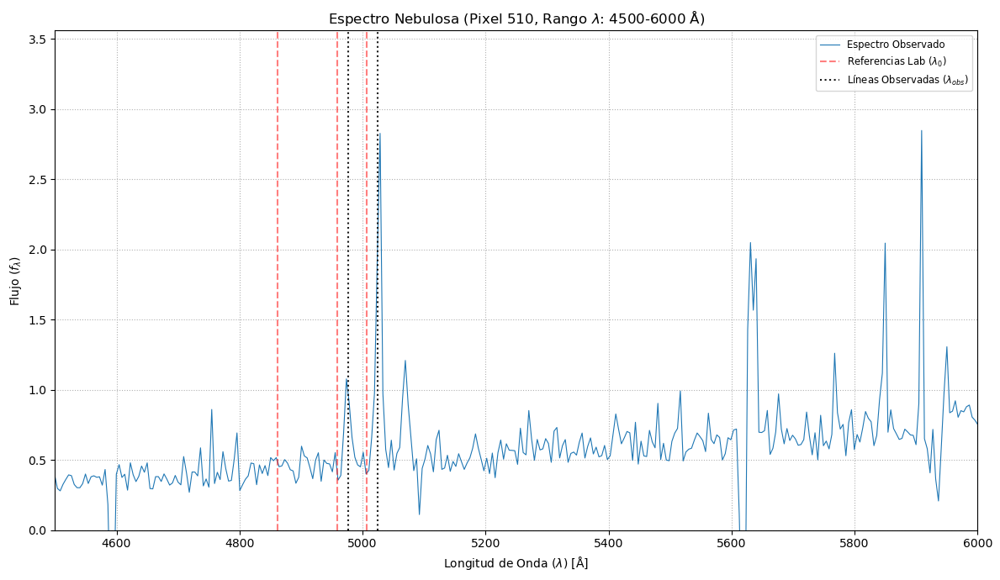

✅ Gráfico guardado: D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Picos_espectro_por_posicion\espectro_pixel_510_6000-7500.png


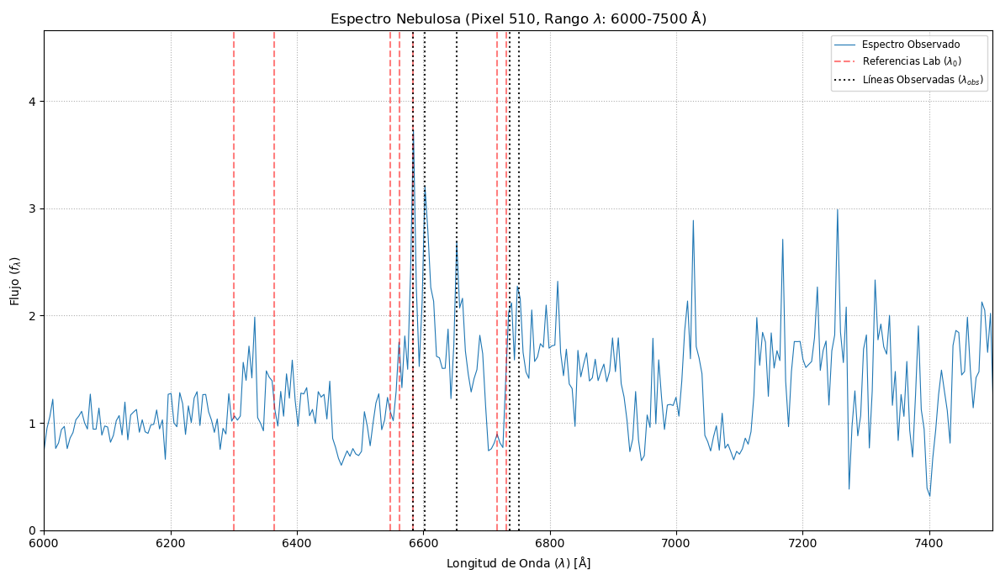


             CÁLCULOS DE VELOCIDAD RADIAL MEDIA (Pixel 510)
Velocidades individuales [km/s]:
  O_III_2 : v = 1088.18 ± 302.27
  O_III   : v = 1077.74 ± 299.37
  N_II    : v = 1602.41 ± 228.92
  H_alpha : v = 1827.22 ± 228.40
  N_II_2  : v = 3187.63 ± 227.69
  S_II_1  : v = 892.64 ± 223.16
  S_II_2  : v = 890.78 ± 222.70

--------------------------------------------------
Número de líneas usadas: 7
Velocidad Media Radial (Ponderada):
V_radial = 1559.07 ± 91.33 km/s
--------------------------------------------------

Resultado Final para el Píxel 510: $V_{radial} = (1559.07 \pm 91.33)\ 	ext{km/s}$

✅ Datos de velocidad ACTUALIZADOS en la lista global 'VELOCIDADES_POR_PIXEL'.


In [193]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
import os
import warnings
import csv 
import math
import re 
warnings.filterwarnings('ignore')
plt.ion()

# ==============================================================================
# 🛑 CONFIGURACIÓN DE DATOS Y RUTA 🛑
# ==============================================================================

# Se asume que la variable global 'VELOCIDADES_POR_PIXEL = []' está definida
# en una celda anterior y que las variables 'neb_spec_510' y 'wavelength_array' 
# están cargadas en la memoria.

try:
    # ✅ PÍXEL CAMBIADO A 510
    PIXEL_CENTRAL = 510 
    
except NameError:
    PIXEL_CENTRAL = 510 

# --- RUTA DE GUARDADO ---
RUTA_BASE_DESEADA = r"D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Picos_espectro_por_posicion"
os.makedirs(RUTA_BASE_DESEADA, exist_ok=True)
GRAFICOS_OUTPUT_DIR = RUTA_BASE_DESEADA 


# --- CONSTANTES ---
C_LIGHT = 299792.458 # Velocidad de la luz en km/s (¡No cambiar!)


# --- DEFINICIÓN DE LÍNEAS DE REFERENCIA ---
LINEAS_LAB = {
    'H_beta': 4861.32, 
    'O_III_2': 4959.0, 
    'O_III': 5007.0, 
    'O_I_1': 6300.3, 
    'O_I_2': 6363.8, 
    'N_II': 6548.1, 
    'H_alpha': 6562.8, 
    'N_II_2': 6583.4, 
    'S_II_1': 6717.0, 
    'S_II_2': 6731.0 
}

rango_graficas = [ (4500, 6000), (6000, 7500) ]
UMBRAL_PROMINENCE = 5 

# --- CONSOLIDACIÓN DE DESPLAZAMIENTOS VISUALES (Tus valores) ---
# NOTA: AJUSTA ESTOS VALORES si los desplazamientos son diferentes en el píxel 510
DESPLAZAMIENTOS = {
    'H_beta': 0,
    'O_III_2': 18,
    'O_III': 18,
    'O_I_1': 0,
    'O_I_2': 0,
    'N_II': 35,
    'N_II_2': 70,
    'H_alpha': 40,
    'S_II_1': 20,
    'S_II_2': 20,
}
# --- PARÁMETROS DE ERROR ---
ERROR_LAMBDA_OBS = 5.0 # Error aproximado en la determinación de lambda_obs [Å]

# ==============================================================================
# 📢 BLOQUE INDEPENDIENTE: CÁLCULO DE TODAS LAS VELOCIDADES INDIVIDUALES
# ==============================================================================

velocidades_individuales = []

for nombre, lambda_0 in LINEAS_LAB.items():
    if nombre in DESPLAZAMIENTOS:
        desplazamiento = DESPLAZAMIENTOS[nombre]
        
        # Solo calculamos la velocidad si hay desplazamiento
        if desplazamiento != 0: 
            
            # --- CÁLCULO DE VELOCIDAD INDIVIDUAL ---
            v = C_LIGHT * (desplazamiento / lambda_0)
            delta_v = C_LIGHT * (ERROR_LAMBDA_OBS / lambda_0)
            
            velocidades_individuales.append({
                'Elemento': nombre,
                'v': v,
                'Delta_v': delta_v
            })

# ==============================================================================
# 1. BUCLE DE PLOTEO Y CÁLCULO (Por Rango)
# ==============================================================================

for idx_graph, (rango_min, rango_max) in enumerate(rango_graficas):
    
    plt.figure(figsize=(12, 7))
    
    etiqueta_ref_usada = False
    ETIQUETA_UNICA_REF = 'Referencias Lab ($\lambda_0$)'
    etiqueta_obs_usada = False
    ETIQUETA_UNICA_OBS = 'Líneas Observadas ($\lambda_{obs}$)'
    
    try:
        # ✅ USANDO neb_spec_510
        idx_rango = np.where((wavelength_array >= rango_min) & (wavelength_array <= rango_max))
        
        if len(idx_rango[0]) == 0:
            plt.close()
            print(f"Advertencia: No hay datos en el rango {rango_min}-{rango_max} Å. Saltando gráfico.")
            continue
            
        # Aseguramos que max_y_rango se calcule sobre el segmento correcto.
        # ✅ USANDO neb_spec_510
        max_y_rango = np.max(neb_spec_510[idx_rango])
        
        # 1. Plotear el Espectro Observado
        # ✅ USANDO neb_spec_510
        plt.plot(wavelength_array, neb_spec_510, label='Espectro Observado', linewidth=0.8)
        
    except NameError:
        # Se ajusta el mensaje de error
        print("ERROR: Variables de datos (neb_spec_510, wavelength_array) no definidas. Terminando el loop de plots.")
        break
    
    # 2. Plotear Líneas de Referencia (Lab) - Rojas Discontinuas
    for nombre, lambda_0 in LINEAS_LAB.items():
        if lambda_0 < rango_min or lambda_0 > rango_max:
            continue
            
        label_ref = ETIQUETA_UNICA_REF if not etiqueta_ref_usada else None
        plt.axvline(x=lambda_0, color='r', linestyle='--', alpha=0.5, label=label_ref)
        etiqueta_ref_usada = True
    
    
    # --------------------------------------------------------------------------
    # 📢 BLOQUE PARA PLOTEAR LÍNEAS OBSERVADAS 
    # --------------------------------------------------------------------------
    
    # Plotear las líneas observadas (usando el desplazamiento para lambda_obs)
    for nombre, lambda_0 in LINEAS_LAB.items():
        if rango_min <= lambda_0 < rango_max and nombre in DESPLAZAMIENTOS:
            desplazamiento = DESPLAZAMIENTOS[nombre]
            
            # Ploteamos solo si hay desplazamiento
            if desplazamiento != 0: 
                lambda_obs = lambda_0 + desplazamiento
                label_obs = ETIQUETA_UNICA_OBS if not etiqueta_obs_usada else None
                plt.axvline(x=lambda_obs, color='k', linestyle=':', linewidth=1.5, alpha=0.9, label=label_obs)
                etiqueta_obs_usada = True

    # --------------------------------------------------------------------------

    # --- 3. CONFIGURACIÓN FINAL DEL PLOT ---
    
    plt.xlim([rango_min, rango_max]) 
    plt.ylim([0, max_y_rango * 1.25]) 
    
    # ✅ Título ajustado al PIXEL_CENTRAL 510
    titulo_plot = f"Espectro Nebulosa (Pixel {PIXEL_CENTRAL}, Rango $\lambda$: {rango_min}-{rango_max} Å)"
    plt.title(titulo_plot)
    plt.xlabel(r"Longitud de Onda ($\lambda$) [Å]")
    plt.ylabel(r"Flujo ($f_{\lambda}$)") 
    
    plt.grid(True, linestyle=':')
    plt.legend(loc='upper right', fontsize='small')
    plt.tight_layout(rect=[0, 0, 1, 1]) 
    
    # ✅ Nombre de archivo ajustado al PIXEL_CENTRAL 510
    nombre_archivo = f"espectro_pixel_{PIXEL_CENTRAL}_{rango_min}-{rango_max}.png"
    ruta_guardado_png = os.path.join(GRAFICOS_OUTPUT_DIR, nombre_archivo)
    plt.savefig(ruta_guardado_png, dpi=300)
    print(f"✅ Gráfico guardado: {ruta_guardado_png}")
    
    plt.show() 
    plt.close()

# ==============================================================================
# 4. 📈 CÁLCULO DE VELOCIDAD MEDIA Y ALMACENAMIENTO (CON REEMPLAZO)
# ==============================================================================

print("\n" + "="*70)
print(f"             CÁLCULOS DE VELOCIDAD RADIAL MEDIA (Pixel {PIXEL_CENTRAL})")
print("="*70)

if not velocidades_individuales:
    print("Advertencia: No se encontraron líneas con desplazamiento (Delta_lambda != 0) para calcular la velocidad.")
else:
    v_array = np.array([item['v'] for item in velocidades_individuales])
    dv_array = np.array([item['Delta_v'] for item in velocidades_individuales])
    
    # Cálculo de la Media Ponderada
    weights = 1 / dv_array**2
    v_media_ponderada = np.sum(v_array * weights) / np.sum(weights)
    delta_v_media = np.sqrt(1 / np.sum(weights))
    
    # --- 💡 LÓGICA DE REEMPLAZO/ACTUALIZACIÓN 💡 ---
    
    # 1. Creamos la nueva entrada de datos
    nueva_entrada = {
        'Pixel_Central': PIXEL_CENTRAL,
        'V_Media': v_media_ponderada,
        'Delta_V_Media': delta_v_media,
        'V_Lineas': {item['Elemento']: {'v': item['v'], 'Delta_v': item['Delta_v']} 
                     for item in velocidades_individuales}
    }
    
    # 2. Buscamos y eliminamos entradas antiguas para este píxel
    indices_a_eliminar = []
    for i, entrada in enumerate(VELOCIDADES_POR_PIXEL):
        if entrada['Pixel_Central'] == PIXEL_CENTRAL:
            indices_a_eliminar.append(i)
            
    # Eliminamos desde el final para no alterar los índices que quedan por eliminar
    for i in sorted(indices_a_eliminar, reverse=True):
        del VELOCIDADES_POR_PIXEL[i]
        
    # 3. Añadimos la nueva entrada (la versión actualizada)
    VELOCIDADES_POR_PIXEL.append(nueva_entrada)

    # -----------------------------------------------

    print("Velocidades individuales [km/s]:")
    for item in velocidades_individuales:
        print(f"  {item['Elemento']:<8}: v = {item['v']:.2f} ± {item['Delta_v']:.2f}")

    print("\n--------------------------------------------------")
    print(f"Número de líneas usadas: {len(v_array)}")
    print(f"Velocidad Media Radial (Ponderada):")
    print(f"V_radial = {v_media_ponderada:.2f} ± {delta_v_media:.2f} km/s")
    print("--------------------------------------------------")
    
    # --- LÍNEA SOLICITADA ---
    print(f"\nResultado Final para el Píxel {PIXEL_CENTRAL}: $V_{{radial}} = ({v_media_ponderada:.2f} \pm {delta_v_media:.2f})\ \text{{km/s}}$")
    
    print("\n✅ Datos de velocidad ACTUALIZADOS en la lista global 'VELOCIDADES_POR_PIXEL'.")

# Región 6

In [196]:
neb_spec_536 = neb_spec_red[:,536:542]
sky_spec_6 = neb_spec_red[:,1000:1006]
sky_spec_6 = np.sum(sky_spec_6, axis=1)
neb_spec_536 = np.sum(neb_spec_536,axis=1)
neb_spec_536 = neb_spec_536 - sky_spec_6

✅ Gráfico guardado: D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Picos_espectro_por_posicion\espectro_pixel_536_4500-6000.png


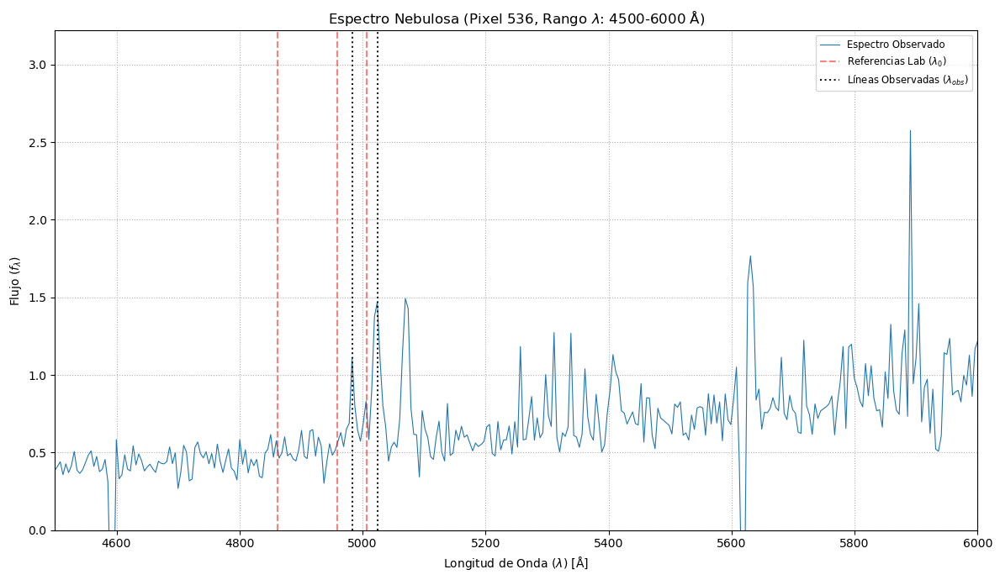

✅ Gráfico guardado: D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Picos_espectro_por_posicion\espectro_pixel_536_6000-7500.png


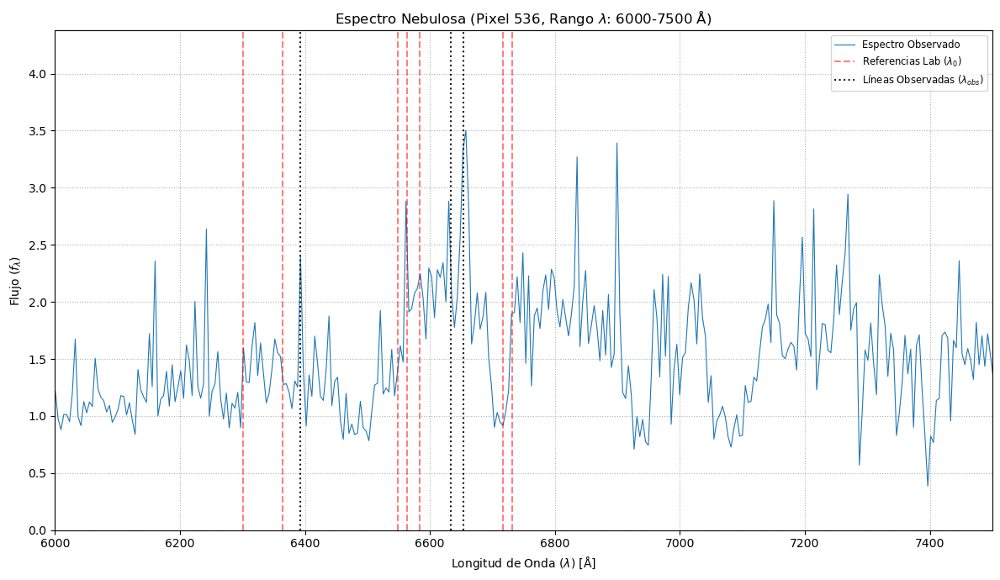


             CÁLCULOS DE VELOCIDAD RADIAL MEDIA (Pixel 536)
Velocidades individuales [km/s]:
  O_III_2 : v = 1511.36 ± 302.27
  O_III   : v = 1077.74 ± 299.37
  O_I_2   : v = 1319.05 ± 235.55
  H_alpha : v = 3197.64 ± 228.40
  N_II_2  : v = 3187.63 ± 227.69

--------------------------------------------------
Número de líneas usadas: 5
Velocidad Media Radial (Ponderada):
V_radial = 2228.47 ± 112.81 km/s
--------------------------------------------------

Resultado Final para el Píxel 536: $V_{radial} = (2228.47 \pm 112.81)\ 	ext{km/s}$

✅ Datos de velocidad ACTUALIZADOS en la lista global 'VELOCIDADES_POR_PIXEL'.


In [212]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
import os
import warnings
import csv 
import math
import re 
warnings.filterwarnings('ignore')
plt.ion()

# ==============================================================================
# 🛑 CONFIGURACIÓN DE DATOS Y RUTA 🛑
# ==============================================================================

# Se asume que la variable global 'VELOCIDADES_POR_PIXEL = []' está definida
# en una celda anterior y que las variables 'neb_spec_536' y 'wavelength_array' 
# están cargadas en la memoria.

try:
    # ✅ PÍXEL CAMBIADO A 536
    PIXEL_CENTRAL = 536 
    
except NameError:
    PIXEL_CENTRAL = 536 

# --- RUTA DE GUARDADO ---
RUTA_BASE_DESEADA = r"D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Picos_espectro_por_posicion"
os.makedirs(RUTA_BASE_DESEADA, exist_ok=True)
GRAFICOS_OUTPUT_DIR = RUTA_BASE_DESEADA 


# --- CONSTANTES ---
C_LIGHT = 299792.458 # Velocidad de la luz en km/s (¡No cambiar!)


# --- DEFINICIÓN DE LÍNEAS DE REFERENCIA ---
LINEAS_LAB = {
    'H_beta': 4861.32, 
    'O_III_2': 4959.0, 
    'O_III': 5007.0, 
    'O_I_1': 6300.3, 
    'O_I_2': 6363.8, 
    'N_II': 6548.1, 
    'H_alpha': 6562.8, 
    'N_II_2': 6583.4, 
    'S_II_1': 6717.0, 
    'S_II_2': 6731.0 
}

rango_graficas = [ (4500, 6000), (6000, 7500) ]
UMBRAL_PROMINENCE = 5 

# --- CONSOLIDACIÓN DE DESPLAZAMIENTOS VISUALES (Tus valores) ---
# NOTA: AJUSTA ESTOS VALORES si los desplazamientos son diferentes en el píxel 536
DESPLAZAMIENTOS = {
    'H_beta': 0,
    'O_III_2': 25,
    'O_III': 18,
    'O_I_1': 0,
    'O_I_2': 28,
    'N_II': 0,
    'N_II_2': 70,
    'H_alpha': 70,
    'S_II_1': 0,
    'S_II_2': 0,
}
# --- PARÁMETROS DE ERROR ---
ERROR_LAMBDA_OBS = 5.0 # Error aproximado en la determinación de lambda_obs [Å]

# ==============================================================================
# 📢 BLOQUE INDEPENDIENTE: CÁLCULO DE TODAS LAS VELOCIDADES INDIVIDUALES
# ==============================================================================

velocidades_individuales = []

for nombre, lambda_0 in LINEAS_LAB.items():
    if nombre in DESPLAZAMIENTOS:
        desplazamiento = DESPLAZAMIENTOS[nombre]
        
        # Solo calculamos la velocidad si hay desplazamiento
        if desplazamiento != 0: 
            
            # --- CÁLCULO DE VELOCIDAD INDIVIDUAL ---
            v = C_LIGHT * (desplazamiento / lambda_0)
            delta_v = C_LIGHT * (ERROR_LAMBDA_OBS / lambda_0)
            
            velocidades_individuales.append({
                'Elemento': nombre,
                'v': v,
                'Delta_v': delta_v
            })

# ==============================================================================
# 1. BUCLE DE PLOTEO Y CÁLCULO (Por Rango)
# ==============================================================================

for idx_graph, (rango_min, rango_max) in enumerate(rango_graficas):
    
    plt.figure(figsize=(12, 7))
    
    etiqueta_ref_usada = False
    ETIQUETA_UNICA_REF = 'Referencias Lab ($\lambda_0$)'
    etiqueta_obs_usada = False
    ETIQUETA_UNICA_OBS = 'Líneas Observadas ($\lambda_{obs}$)'
    
    try:
        # ✅ USANDO neb_spec_536
        idx_rango = np.where((wavelength_array >= rango_min) & (wavelength_array <= rango_max))
        
        if len(idx_rango[0]) == 0:
            plt.close()
            print(f"Advertencia: No hay datos en el rango {rango_min}-{rango_max} Å. Saltando gráfico.")
            continue
            
        # Aseguramos que max_y_rango se calcule sobre el segmento correcto.
        # ✅ USANDO neb_spec_536
        max_y_rango = np.max(neb_spec_536[idx_rango])
        
        # 1. Plotear el Espectro Observado
        # ✅ USANDO neb_spec_536
        plt.plot(wavelength_array, neb_spec_536, label='Espectro Observado', linewidth=0.8)
        
    except NameError:
        # Se ajusta el mensaje de error
        print("ERROR: Variables de datos (neb_spec_536, wavelength_array) no definidas. Terminando el loop de plots.")
        break
    
    # 2. Plotear Líneas de Referencia (Lab) - Rojas Discontinuas
    for nombre, lambda_0 in LINEAS_LAB.items():
        if lambda_0 < rango_min or lambda_0 > rango_max:
            continue
            
        label_ref = ETIQUETA_UNICA_REF if not etiqueta_ref_usada else None
        plt.axvline(x=lambda_0, color='r', linestyle='--', alpha=0.5, label=label_ref)
        etiqueta_ref_usada = True
    
    
    # --------------------------------------------------------------------------
    # 📢 BLOQUE PARA PLOTEAR LÍNEAS OBSERVADAS 
    # --------------------------------------------------------------------------
    
    # Plotear las líneas observadas (usando el desplazamiento para lambda_obs)
    for nombre, lambda_0 in LINEAS_LAB.items():
        if rango_min <= lambda_0 < rango_max and nombre in DESPLAZAMIENTOS:
            desplazamiento = DESPLAZAMIENTOS[nombre]
            
            # Ploteamos solo si hay desplazamiento
            if desplazamiento != 0: 
                lambda_obs = lambda_0 + desplazamiento
                label_obs = ETIQUETA_UNICA_OBS if not etiqueta_obs_usada else None
                plt.axvline(x=lambda_obs, color='k', linestyle=':', linewidth=1.5, alpha=0.9, label=label_obs)
                etiqueta_obs_usada = True

    # --------------------------------------------------------------------------

    # --- 3. CONFIGURACIÓN FINAL DEL PLOT ---
    
    plt.xlim([rango_min, rango_max]) 
    plt.ylim([0, max_y_rango * 1.25]) 
    
    # ✅ Título ajustado al PIXEL_CENTRAL 536
    titulo_plot = f"Espectro Nebulosa (Pixel {PIXEL_CENTRAL}, Rango $\lambda$: {rango_min}-{rango_max} Å)"
    plt.title(titulo_plot)
    plt.xlabel(r"Longitud de Onda ($\lambda$) [Å]")
    plt.ylabel(r"Flujo ($f_{\lambda}$)") 
    
    plt.grid(True, linestyle=':')
    plt.legend(loc='upper right', fontsize='small')
    plt.tight_layout(rect=[0, 0, 1, 1]) 
    
    # ✅ Nombre de archivo ajustado al PIXEL_CENTRAL 536
    nombre_archivo = f"espectro_pixel_{PIXEL_CENTRAL}_{rango_min}-{rango_max}.png"
    ruta_guardado_png = os.path.join(GRAFICOS_OUTPUT_DIR, nombre_archivo)
    plt.savefig(ruta_guardado_png, dpi=300)
    print(f"✅ Gráfico guardado: {ruta_guardado_png}")
    
    plt.show() 
    plt.close()

# ==============================================================================
# 4. 📈 CÁLCULO DE VELOCIDAD MEDIA Y ALMACENAMIENTO (CON REEMPLAZO)
# ==============================================================================

print("\n" + "="*70)
print(f"             CÁLCULOS DE VELOCIDAD RADIAL MEDIA (Pixel {PIXEL_CENTRAL})")
print("="*70)

if not velocidades_individuales:
    print("Advertencia: No se encontraron líneas con desplazamiento (Delta_lambda != 0) para calcular la velocidad.")
else:
    v_array = np.array([item['v'] for item in velocidades_individuales])
    dv_array = np.array([item['Delta_v'] for item in velocidades_individuales])
    
    # Cálculo de la Media Ponderada
    weights = 1 / dv_array**2
    v_media_ponderada = np.sum(v_array * weights) / np.sum(weights)
    delta_v_media = np.sqrt(1 / np.sum(weights))
    
    # --- 💡 LÓGICA DE REEMPLAZO/ACTUALIZACIÓN 💡 ---
    
    # 1. Creamos la nueva entrada de datos
    nueva_entrada = {
        'Pixel_Central': PIXEL_CENTRAL,
        'V_Media': v_media_ponderada,
        'Delta_V_Media': delta_v_media,
        'V_Lineas': {item['Elemento']: {'v': item['v'], 'Delta_v': item['Delta_v']} 
                     for item in velocidades_individuales}
    }
    
    # 2. Buscamos y eliminamos entradas antiguas para este píxel
    indices_a_eliminar = []
    for i, entrada in enumerate(VELOCIDADES_POR_PIXEL):
        if entrada['Pixel_Central'] == PIXEL_CENTRAL:
            indices_a_eliminar.append(i)
            
    # Eliminamos desde el final para no alterar los índices que quedan por eliminar
    for i in sorted(indices_a_eliminar, reverse=True):
        del VELOCIDADES_POR_PIXEL[i]
        
    # 3. Añadimos la nueva entrada (la versión actualizada)
    VELOCIDADES_POR_PIXEL.append(nueva_entrada)

    # -----------------------------------------------

    print("Velocidades individuales [km/s]:")
    for item in velocidades_individuales:
        print(f"  {item['Elemento']:<8}: v = {item['v']:.2f} ± {item['Delta_v']:.2f}")

    print("\n--------------------------------------------------")
    print(f"Número de líneas usadas: {len(v_array)}")
    print(f"Velocidad Media Radial (Ponderada):")
    print(f"V_radial = {v_media_ponderada:.2f} ± {delta_v_media:.2f} km/s")
    print("--------------------------------------------------")
    
    # --- LÍNEA SOLICITADA ---
    print(f"\nResultado Final para el Píxel {PIXEL_CENTRAL}: $V_{{radial}} = ({v_media_ponderada:.2f} \pm {delta_v_media:.2f})\ \text{{km/s}}$")
    
    print("\n✅ Datos de velocidad ACTUALIZADOS en la lista global 'VELOCIDADES_POR_PIXEL'.")

# Región 7

In [215]:
neb_spec_596 = neb_spec_red[:,596:602]
sky_spec_6 = neb_spec_red[:,1000:1006]
sky_spec_6 = np.sum(sky_spec_6, axis=1)
neb_spec_596 = np.sum(neb_spec_596,axis=1)
neb_spec_596 = neb_spec_596 - sky_spec_6

✅ Gráfico guardado: D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Picos_espectro_por_posicion\espectro_pixel_596_4500-6000.png


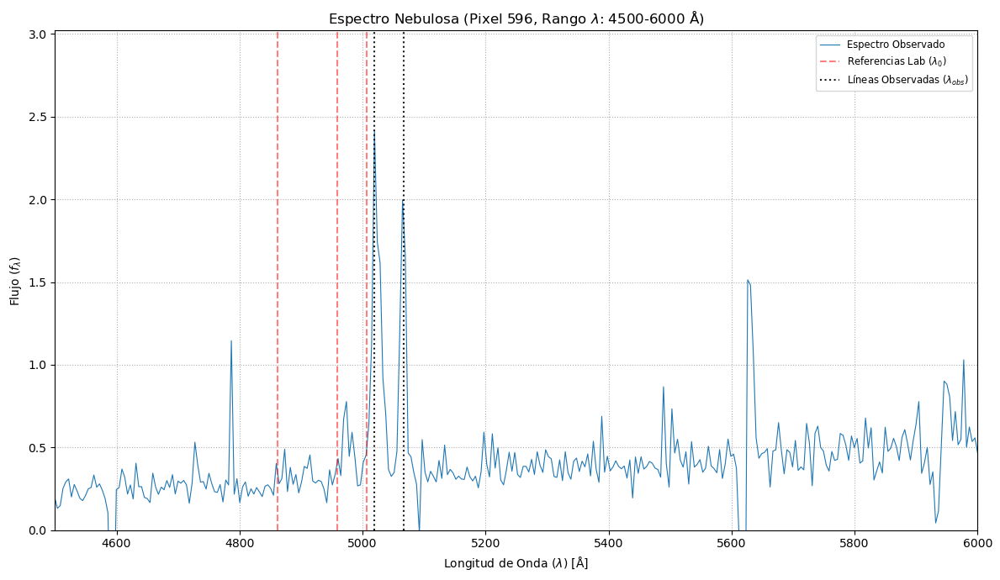

✅ Gráfico guardado: D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Picos_espectro_por_posicion\espectro_pixel_596_6000-7500.png


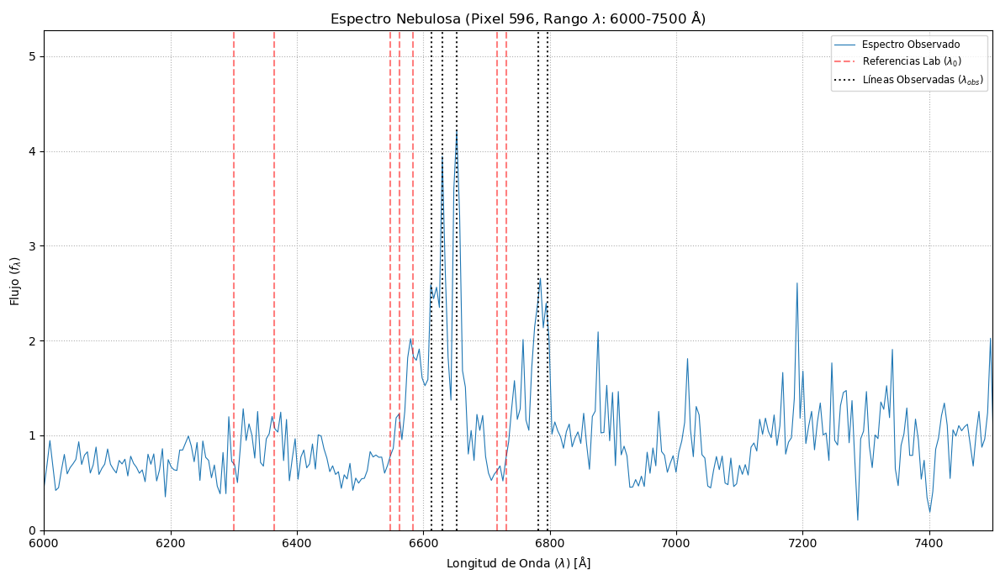


             CÁLCULOS DE VELOCIDAD RADIAL MEDIA (Pixel 596)
Velocidades individuales [km/s]:
  O_III_2 : v = 3627.25 ± 302.27
  O_III   : v = 3592.48 ± 299.37
  N_II    : v = 2975.90 ± 228.92
  H_alpha : v = 3106.28 ± 228.40
  N_II_2  : v = 3187.63 ± 227.69
  S_II_1  : v = 2901.07 ± 223.16
  S_II_2  : v = 2895.04 ± 222.70

--------------------------------------------------
Número de líneas usadas: 7
Velocidad Media Radial (Ponderada):
V_radial = 3121.53 ± 91.33 km/s
--------------------------------------------------

Resultado Final para el Píxel 596: $V_{radial} = (3121.53 \pm 91.33)\ 	ext{km/s}$

✅ Datos de velocidad ACTUALIZADOS en la lista global 'VELOCIDADES_POR_PIXEL'.


In [227]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
import os
import warnings
import csv 
import math
import re 
warnings.filterwarnings('ignore')
plt.ion()

# ==============================================================================
# 🛑 CONFIGURACIÓN DE DATOS Y RUTA 🛑
# ==============================================================================

# Se asume que la variable global 'VELOCIDADES_POR_PIXEL = []' está definida
# en una celda anterior y que las variables 'neb_spec_596' y 'wavelength_array' 
# están cargadas en la memoria.

try:
    # ✅ PÍXEL CAMBIADO A 596
    PIXEL_CENTRAL = 596 
    
except NameError:
    PIXEL_CENTRAL = 596 

# --- RUTA DE GUARDADO ---
RUTA_BASE_DESEADA = r"D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Picos_espectro_por_posicion"
os.makedirs(RUTA_BASE_DESEADA, exist_ok=True)
GRAFICOS_OUTPUT_DIR = RUTA_BASE_DESEADA 


# --- CONSTANTES ---
C_LIGHT = 299792.458 # Velocidad de la luz en km/s (¡No cambiar!)


# --- DEFINICIÓN DE LÍNEAS DE REFERENCIA ---
LINEAS_LAB = {
    'H_beta': 4861.32, 
    'O_III_2': 4959.0, 
    'O_III': 5007.0, 
    'O_I_1': 6300.3, 
    'O_I_2': 6363.8, 
    'N_II': 6548.1, 
    'H_alpha': 6562.8, 
    'N_II_2': 6583.4, 
    'S_II_1': 6717.0, 
    'S_II_2': 6731.0 
}

rango_graficas = [ (4500, 6000), (6000, 7500) ]
UMBRAL_PROMINENCE = 5 

# --- CONSOLIDACIÓN DE DESPLAZAMIENTOS VISUALES (Tus valores) ---
# NOTA: AJUSTA ESTOS VALORES si los desplazamientos son diferentes en el píxel 596
DESPLAZAMIENTOS = {
    'H_beta': 0,
    'O_III_2': 60,
    'O_III': 60,
    'O_I_1': 0,
    'O_I_2': 0,
    'N_II': 65,
    'N_II_2': 70,
    'H_alpha': 68,
    'S_II_1': 65,
    'S_II_2': 65,
}
# --- PARÁMETROS DE ERROR ---
ERROR_LAMBDA_OBS = 5.0 # Error aproximado en la determinación de lambda_obs [Å]

# ==============================================================================
# 📢 BLOQUE INDEPENDIENTE: CÁLCULO DE TODAS LAS VELOCIDADES INDIVIDUALES
# ==============================================================================

velocidades_individuales = []

for nombre, lambda_0 in LINEAS_LAB.items():
    if nombre in DESPLAZAMIENTOS:
        desplazamiento = DESPLAZAMIENTOS[nombre]
        
        # Solo calculamos la velocidad si hay desplazamiento
        if desplazamiento != 0: 
            
            # --- CÁLCULO DE VELOCIDAD INDIVIDUAL ---
            v = C_LIGHT * (desplazamiento / lambda_0)
            delta_v = C_LIGHT * (ERROR_LAMBDA_OBS / lambda_0)
            
            velocidades_individuales.append({
                'Elemento': nombre,
                'v': v,
                'Delta_v': delta_v
            })

# ==============================================================================
# 1. BUCLE DE PLOTEO Y CÁLCULO (Por Rango)
# ==============================================================================

for idx_graph, (rango_min, rango_max) in enumerate(rango_graficas):
    
    plt.figure(figsize=(12, 7))
    
    etiqueta_ref_usada = False
    ETIQUETA_UNICA_REF = 'Referencias Lab ($\lambda_0$)'
    etiqueta_obs_usada = False
    ETIQUETA_UNICA_OBS = 'Líneas Observadas ($\lambda_{obs}$)'
    
    try:
        # ✅ USANDO neb_spec_596
        idx_rango = np.where((wavelength_array >= rango_min) & (wavelength_array <= rango_max))
        
        if len(idx_rango[0]) == 0:
            plt.close()
            print(f"Advertencia: No hay datos en el rango {rango_min}-{rango_max} Å. Saltando gráfico.")
            continue
            
        # Aseguramos que max_y_rango se calcule sobre el segmento correcto.
        # ✅ USANDO neb_spec_596
        max_y_rango = np.max(neb_spec_596[idx_rango])
        
        # 1. Plotear el Espectro Observado
        # ✅ USANDO neb_spec_596
        plt.plot(wavelength_array, neb_spec_596, label='Espectro Observado', linewidth=0.8)
        
    except NameError:
        # Se ajusta el mensaje de error
        print("ERROR: Variables de datos (neb_spec_596, wavelength_array) no definidas. Terminando el loop de plots.")
        break
    
    # 2. Plotear Líneas de Referencia (Lab) - Rojas Discontinuas
    for nombre, lambda_0 in LINEAS_LAB.items():
        if lambda_0 < rango_min or lambda_0 > rango_max:
            continue
            
        label_ref = ETIQUETA_UNICA_REF if not etiqueta_ref_usada else None
        plt.axvline(x=lambda_0, color='r', linestyle='--', alpha=0.5, label=label_ref)
        etiqueta_ref_usada = True
    
    
    # --------------------------------------------------------------------------
    # 📢 BLOQUE PARA PLOTEAR LÍNEAS OBSERVADAS 
    # --------------------------------------------------------------------------
    
    # Plotear las líneas observadas (usando el desplazamiento para lambda_obs)
    for nombre, lambda_0 in LINEAS_LAB.items():
        if rango_min <= lambda_0 < rango_max and nombre in DESPLAZAMIENTOS:
            desplazamiento = DESPLAZAMIENTOS[nombre]
            
            # Ploteamos solo si hay desplazamiento
            if desplazamiento != 0: 
                lambda_obs = lambda_0 + desplazamiento
                label_obs = ETIQUETA_UNICA_OBS if not etiqueta_obs_usada else None
                plt.axvline(x=lambda_obs, color='k', linestyle=':', linewidth=1.5, alpha=0.9, label=label_obs)
                etiqueta_obs_usada = True

    # --------------------------------------------------------------------------

    # --- 3. CONFIGURACIÓN FINAL DEL PLOT ---
    
    plt.xlim([rango_min, rango_max]) 
    plt.ylim([0, max_y_rango * 1.25]) 
    
    # ✅ Título ajustado al PIXEL_CENTRAL 596
    titulo_plot = f"Espectro Nebulosa (Pixel {PIXEL_CENTRAL}, Rango $\lambda$: {rango_min}-{rango_max} Å)"
    plt.title(titulo_plot)
    plt.xlabel(r"Longitud de Onda ($\lambda$) [Å]")
    plt.ylabel(r"Flujo ($f_{\lambda}$)") 
    
    plt.grid(True, linestyle=':')
    plt.legend(loc='upper right', fontsize='small')
    plt.tight_layout(rect=[0, 0, 1, 1]) 
    
    # ✅ Nombre de archivo ajustado al PIXEL_CENTRAL 596
    nombre_archivo = f"espectro_pixel_{PIXEL_CENTRAL}_{rango_min}-{rango_max}.png"
    ruta_guardado_png = os.path.join(GRAFICOS_OUTPUT_DIR, nombre_archivo)
    plt.savefig(ruta_guardado_png, dpi=300)
    print(f"✅ Gráfico guardado: {ruta_guardado_png}")
    
    plt.show() 
    plt.close()

# ==============================================================================
# 4. 📈 CÁLCULO DE VELOCIDAD MEDIA Y ALMACENAMIENTO (CON REEMPLAZO)
# ==============================================================================

print("\n" + "="*70)
print(f"             CÁLCULOS DE VELOCIDAD RADIAL MEDIA (Pixel {PIXEL_CENTRAL})")
print("="*70)

if not velocidades_individuales:
    print("Advertencia: No se encontraron líneas con desplazamiento (Delta_lambda != 0) para calcular la velocidad.")
else:
    v_array = np.array([item['v'] for item in velocidades_individuales])
    dv_array = np.array([item['Delta_v'] for item in velocidades_individuales])
    
    # Cálculo de la Media Ponderada
    weights = 1 / dv_array**2
    v_media_ponderada = np.sum(v_array * weights) / np.sum(weights)
    delta_v_media = np.sqrt(1 / np.sum(weights))
    
    # --- 💡 LÓGICA DE REEMPLAZO/ACTUALIZACIÓN 💡 ---
    
    # 1. Creamos la nueva entrada de datos
    nueva_entrada = {
        'Pixel_Central': PIXEL_CENTRAL,
        'V_Media': v_media_ponderada,
        'Delta_V_Media': delta_v_media,
        'V_Lineas': {item['Elemento']: {'v': item['v'], 'Delta_v': item['Delta_v']} 
                     for item in velocidades_individuales}
    }
    
    # 2. Buscamos y eliminamos entradas antiguas para este píxel
    indices_a_eliminar = []
    for i, entrada in enumerate(VELOCIDADES_POR_PIXEL):
        if entrada['Pixel_Central'] == PIXEL_CENTRAL:
            indices_a_eliminar.append(i)
            
    # Eliminamos desde el final para no alterar los índices que quedan por eliminar
    for i in sorted(indices_a_eliminar, reverse=True):
        del VELOCIDADES_POR_PIXEL[i]
        
    # 3. Añadimos la nueva entrada (la versión actualizada)
    VELOCIDADES_POR_PIXEL.append(nueva_entrada)

    # -----------------------------------------------

    print("Velocidades individuales [km/s]:")
    for item in velocidades_individuales:
        print(f"  {item['Elemento']:<8}: v = {item['v']:.2f} ± {item['Delta_v']:.2f}")

    print("\n--------------------------------------------------")
    print(f"Número de líneas usadas: {len(v_array)}")
    print(f"Velocidad Media Radial (Ponderada):")
    print(f"V_radial = {v_media_ponderada:.2f} ± {delta_v_media:.2f} km/s")
    print("--------------------------------------------------")
    
    # --- LÍNEA SOLICITADA ---
    print(f"\nResultado Final para el Píxel {PIXEL_CENTRAL}: $V_{{radial}} = ({v_media_ponderada:.2f} \pm {delta_v_media:.2f})\ \text{{km/s}}$")
    
    print("\n✅ Datos de velocidad ACTUALIZADOS en la lista global 'VELOCIDADES_POR_PIXEL'.")

# Velocidades


✅ Gráfico doble de velocidad por elemento (título principal simple) guardado: D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Picos_espectro_por_posicion\Velocidad_Lineas_vs_Posicion_arcsec.png


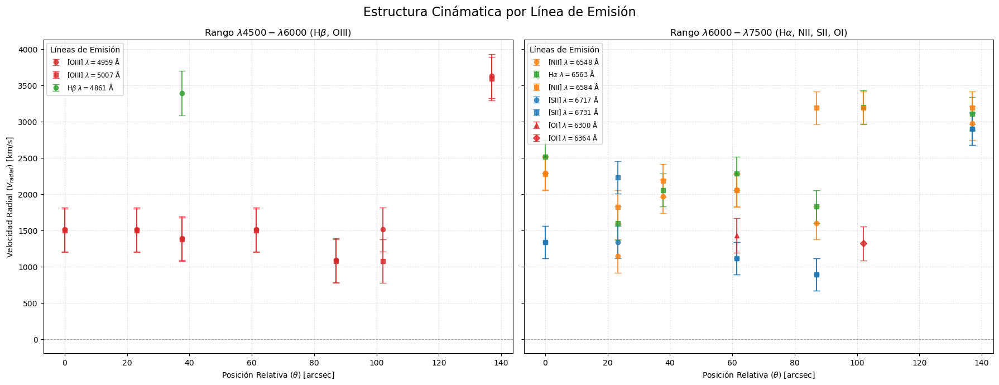

In [277]:
import numpy as np
import matplotlib.pyplot as plt
import os
import warnings
warnings.filterwarnings('ignore')

# Las variables VELOCIDADES_POR_PIXEL deben estar definidas en el entorno.
if 'VELOCIDADES_POR_PIXEL' not in globals():
    VELOCIDADES_POR_PIXEL = []
    # print("ADVERTENCIA: La lista 'VELOCIDADES_POR_PIXEL' no está definida.")


# ==============================================================================
# 🛑 CONFIGURACIÓN DE PARÁMETROS 🛑
# ==============================================================================

FACTOR_CONVERSION_ARCSEC = 0.58 # arcseg por píxel

# --- RUTA DE GUARDADO ---
RUTA_BASE_DESEADA = r"D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Picos_espectro_por_posicion"
os.makedirs(RUTA_BASE_DESEADA, exist_ok=True)
GRAFICOS_OUTPUT_DIR = RUTA_BASE_DESEADA 

# Rango de longitudes de onda para dividir el gráfico
RANGO_PLOT_1 = (4500, 6000) # H_beta, O_III
RANGO_PLOT_2 = (6000, 7500) # O_I, N_II, H_alpha, S_II

# Diccionario de referencia de las líneas (las claves permanecen como están en tus datos)
LINEAS_LAB = {
    'H_beta': 4861.32, 
    'O_III_2': 4959.0, 
    'O_III': 5007.0,   
    'O_I_1': 6300.3, 
    'O_I_2': 6363.8, 
    'N_II': 6548.1, 
    'H_alpha': 6562.8, 
    'N_II_2': 6583.4, 
    'S_II_1': 6717.0, 
    'S_II_2': 6731.0 
}

# Etiquetas ajustadas: "Símbolo $\lambda = \text{Longitud de onda Å}$"
LINEAS_ETIQUETAS = {
    'H_beta': r"H$\beta\ \lambda = 4861\ \text{Å}$", 
    'O_III_2': r"[OIII] $\lambda = 4959\ \text{Å}$", 
    'O_III': r"[OIII] $\lambda = 5007\ \text{Å}$", 
    'O_I_1': r"[OI] $\lambda = 6300\ \text{Å}$", 
    'O_I_2': r"[OI] $\lambda = 6364\ \text{Å}$", 
    'N_II': r"[NII] $\lambda = 6548\ \text{Å}$", 
    'H_alpha': r"H$\alpha\ \lambda = 6563\ \text{Å}$", 
    'N_II_2': r"[NII] $\lambda = 6584\ \text{Å}$", 
    'S_II_1': r"[SII] $\lambda = 6717\ \text{Å}$", 
    'S_II_2': r"[SII] $\lambda = 6731\ \text{Å}$" 
}
# ==============================================================================
# 1. ASIGNACIÓN DE COLORES POR GRUPO DE ELEMENTOS (Se mantiene igual)
# ==============================================================================

COLOR_MAP_GRUPOS = {
    'H': '#2ca02c',     # Hidrógeno (Verde)
    'O': '#d62728',     # Oxígeno (Rojo)
    'N': '#ff7f0e',     # Nitrógeno (Naranja)
    'S': '#1f77b4',     # Azufre (Azul)
}

COLOR_LINEAS = {}
MARCADOR_LINEAS = {}
MARCADORES = ['o', 's', '^', 'D', 'p', 'v']

def get_line_prefix(line_name):
    if line_name.startswith('H'):
        return 'H'
    elif line_name.startswith('O'): 
        return 'O'
    elif line_name.startswith('N'):
        return 'N'
    elif line_name.startswith('S'):
        return 'S'
    return None

marcadores_usados = {group: 0 for group in COLOR_MAP_GRUPOS.keys()}

for line_name in LINEAS_LAB.keys():
    prefix = get_line_prefix(line_name)
    if prefix:
        COLOR_LINEAS[line_name] = COLOR_MAP_GRUPOS[prefix]
        
        idx = marcadores_usados[prefix] % len(MARCADORES)
        MARCADOR_LINEAS[line_name] = MARCADORES[idx]
        marcadores_usados[prefix] += 1
    else:
        COLOR_LINEAS[line_name] = '#9467bd' 
        MARCADOR_LINEAS[line_name] = 'x'


# ==============================================================================
# 2. PREPARACIÓN Y CONSOLIDACIÓN DE DATOS (Se mantiene igual)
# ==============================================================================

datos_por_elemento = {}
nombres_elementos_registrados = set()
PIXEL_ORIGEN = 0 # Valor por defecto

if VELOCIDADES_POR_PIXEL:
    pixels_ordenados = sorted([d['Pixel_Central'] for d in VELOCIDADES_POR_PIXEL])
    PIXEL_ORIGEN = pixels_ordenados[0] if pixels_ordenados else 0

    for entrada in VELOCIDADES_POR_PIXEL:
        pixel = entrada['Pixel_Central']
        posicion_arcsec = (pixel - PIXEL_ORIGEN) * FACTOR_CONVERSION_ARCSEC
        
        for elemento, datos_v in entrada['V_Lineas'].items():
            
            if elemento not in datos_por_elemento:
                datos_por_elemento[elemento] = {
                    'posiciones': [],
                    'velocidades': [],
                    'errores': [],
                    'lambda_0': LINEAS_LAB.get(elemento, 0)
                }
                
            datos_por_elemento[elemento]['posiciones'].append(posicion_arcsec)
            datos_por_elemento[elemento]['velocidades'].append(datos_v['v'])
            datos_por_elemento[elemento]['errores'].append(datos_v['Delta_v'])
else:
    print("No hay datos para graficar.")


# ==============================================================================
# 3. GENERACIÓN DEL GRÁFICO DE DOBLE SUBPLOT (AJUSTADO)
# ==============================================================================

if datos_por_elemento:
    fig, axes = plt.subplots(1, 2, figsize=(18, 7), sharey=True)

    ax1 = axes[0] # Rango H_beta, O_III
    ax2 = axes[1] # Rango H_alpha, N_II, S_II

    # 3.1. Plotear los datos en los subplots correspondientes
    for elemento, datos in datos_por_elemento.items():
        
        if not datos['velocidades']:
            continue
            
        pos = np.array(datos['posiciones'])
        vel = np.array(datos['velocidades'])
        err = np.array(datos['errores'])
        lambda_0 = datos['lambda_0']
        
        color_asignado = COLOR_LINEAS.get(elemento, 'black')
        marcador_asignado = MARCADOR_LINEAS.get(elemento, 'x')
        
        if RANGO_PLOT_1[0] <= lambda_0 <= RANGO_PLOT_1[1]:
            ax = ax1
        elif RANGO_PLOT_2[0] <= lambda_0 <= RANGO_PLOT_2[1]:
            ax = ax2
        else:
            continue

        # --- Trazar Puntos con Error ---
        ax.errorbar(
            pos, 
            vel, 
            yerr=err, 
            fmt=marcador_asignado, 
            linestyle='', # Sin línea de tendencia
            color=color_asignado, 
            capsize=4, 
            label=LINEAS_ETIQUETAS.get(elemento, elemento), 
            alpha=0.8,
            linewidth=1.5
        )

    # 3.2. Configuración y Etiquetas del Subplot 1 (Azul/Verde)
    ax1.set_title(r"Rango $\lambda 4500 - \lambda 6000$ ($\text{H}\beta$, $\text{OIII}$)")
    ax1.set_xlabel(r"Posición Relativa ($\theta$) [arcsec]")
    ax1.set_ylabel(r"Velocidad Radial ($V_{radial}$) [km/s]")
    ax1.axhline(0, color='gray', linestyle='--', linewidth=0.8, alpha=0.7)
    ax1.grid(True, linestyle=':', alpha=0.6)
    ax1.legend(title="Líneas de Emisión", loc='upper left', fontsize='small')


    # 3.3. Configuración y Etiquetas del Subplot 2 (Rojo)
    ax2.set_title(r"Rango $\lambda 6000 - \lambda 7500$ ($\text{H}\alpha$, $\text{NII}$, $\text{SII}$, $\text{OI}$)")
    ax2.set_xlabel(r"Posición Relativa ($\theta$) [arcsec]")
    ax2.axhline(0, color='gray', linestyle='--', linewidth=0.8, alpha=0.7)
    ax2.grid(True, linestyle=':', alpha=0.6)
    ax2.legend(title="Líneas de Emisión", loc='upper left', fontsize='small')

    # ✅ TÍTULO PRINCIPAL TOTALMENTE SIMPLIFICADO
    fig.suptitle("Estructura Cinámatica por Línea de Emisión", fontsize=16)

    plt.tight_layout() 
    
    nombre_archivo = "Velocidad_Lineas_vs_Posicion_arcsec.png"
    ruta_guardado_png = os.path.join(GRAFICOS_OUTPUT_DIR, nombre_archivo)
    plt.savefig(ruta_guardado_png, dpi=300)
    print(f"\n✅ Gráfico doble de velocidad por elemento (título principal simple) guardado: {ruta_guardado_png}")
        
    plt.show() 
    plt.close()

# Velocidad media


✅ Gráfico de velocidad media (sin tendencia ni origen) guardado: D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Picos_espectro_por_posicion\Velocidad_Media_vs_Posicion_arcseg_sin_ajuste.png


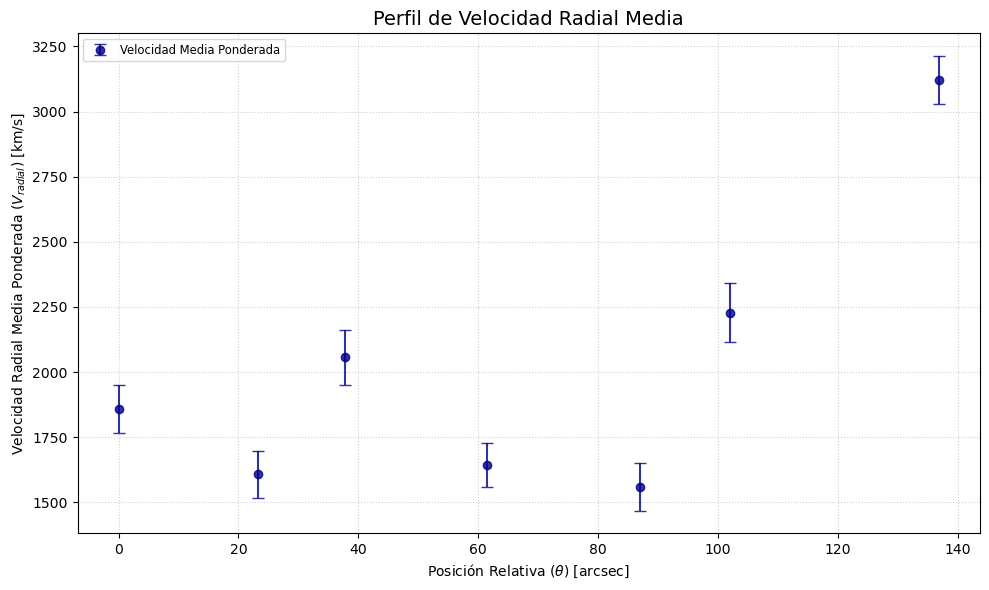

In [281]:
import numpy as np
import matplotlib.pyplot as plt
import os

# ==============================================================================
# 🛑 CONFIGURACIÓN DE PARÁMETROS 🛑
# ==============================================================================

# Asumimos que VELOCIDADES_POR_PIXEL está definida y contiene todos los datos.
FACTOR_CONVERSION_ARCSEC = 0.58 # arcseg por píxel

# --- RUTA DE GUARDADO ---
RUTA_BASE_DESEADA = r"D:\Documents\Grado en física\IV\TEA\Proyecto\M1\Picos_espectro_por_posicion"
os.makedirs(RUTA_BASE_DESEADA, exist_ok=True)
GRAFICOS_OUTPUT_DIR = RUTA_BASE_DESEADA 

# ==============================================================================
# 1. PREPARACIÓN Y CONSOLIDACIÓN DE DATOS DE LA MEDIA
# ==============================================================================

posiciones_arcsec = []
velocidades_medias = []
errores_medias = []

if 'VELOCIDADES_POR_PIXEL' not in globals() or not VELOCIDADES_POR_PIXEL:
    print("ERROR: La lista 'VELOCIDADES_POR_PIXEL' está vacía o no está definida.")
    pass

else:
    pixels_ordenados = sorted([d['Pixel_Central'] for d in VELOCIDADES_POR_PIXEL])
    PIXEL_ORIGEN = pixels_ordenados[0] if pixels_ordenados else 0

    # Extraer los datos y calcular las posiciones en arcseg
    for entrada in VELOCIDADES_POR_PIXEL:
        pixel = entrada['Pixel_Central']
        
        # Calcular la posición en arcseg
        posicion_arcsec = (pixel - PIXEL_ORIGEN) * FACTOR_CONVERSION_ARCSEC
        
        # Almacenar la media y el error calculados en el bloque anterior
        posiciones_arcsec.append(posicion_arcsec)
        velocidades_medias.append(entrada['V_Media'])
        errores_medias.append(entrada['Delta_V_Media'])
        
# Convertir a arrays de NumPy
pos_array = np.array(posiciones_arcsec)
vel_media_array = np.array(velocidades_medias)
err_media_array = np.array(errores_medias)


# ==============================================================================
# 2. GENERACIÓN DEL GRÁFICO DE VELOCIDAD MEDIA (AJUSTADO)
# ==============================================================================

if len(pos_array) > 0:
    
    plt.figure(figsize=(10, 6))
    
    # Trazar la Velocidad Media Ponderada con barras de error
    # ✅ LÍNEA DE TENDENCIA DENTRO DE errorbar ELIMINADA (fmt='o-')
    # fmt='o' asegura que solo haya puntos y barras de error
    plt.errorbar(
        pos_array, 
        vel_media_array, 
        yerr=err_media_array, 
        fmt='o', # Solo puntos (sin la línea de conexión)
        color='darkblue', 
        capsize=4, 
        label='Velocidad Media Ponderada', 
        alpha=0.8,
        linewidth=1.5
    )

    # 🛑 Bloque de Tendencia Lineal ELIMINADO 🛑
    # Se eliminan las siguientes líneas que calculaban y ploteaban la línea de ajuste:
    # m, b, r_value, p_value, std_err = linregress(pos_array, vel_media_array)
    # plt.plot(pos_array, linea_ajuste, ...)

    # --- Configuración del Título y Ejes ---
    
    # ✅ TÍTULO SIMPLIFICADO
    plt.title("Perfil de Velocidad Radial Media", fontsize=14)
    plt.xlabel(r"Posición Relativa ($\theta$) [arcsec]")
    plt.ylabel(r"Velocidad Radial Media Ponderada ($V_{radial}$) [km/s]")
    
    ##plt.axhline(0, color='gray', linestyle='--', linewidth=0.8, alpha=0.7, label='Referencia $V=0$')
    
    plt.grid(True, linestyle=':', alpha=0.6)
    plt.legend(loc='upper left', fontsize='small')
    plt.tight_layout()
    
    # 💾 Guardar y mostrar
    nombre_archivo = "Velocidad_Media_vs_Posicion_arcseg_sin_ajuste.png"
    ruta_guardado_png = os.path.join(GRAFICOS_OUTPUT_DIR, nombre_archivo)
    plt.savefig(ruta_guardado_png, dpi=300)
    print(f"\n✅ Gráfico de velocidad media (sin tendencia ni origen) guardado: {ruta_guardado_png}")
    
    plt.show() 
    plt.close()

else:
    print("Advertencia: No se pudo generar el gráfico de velocidad media. Los arrays están vacíos.")

Now we apply the response curve... and we get the calibrated (in wavelength and flux) spectra!

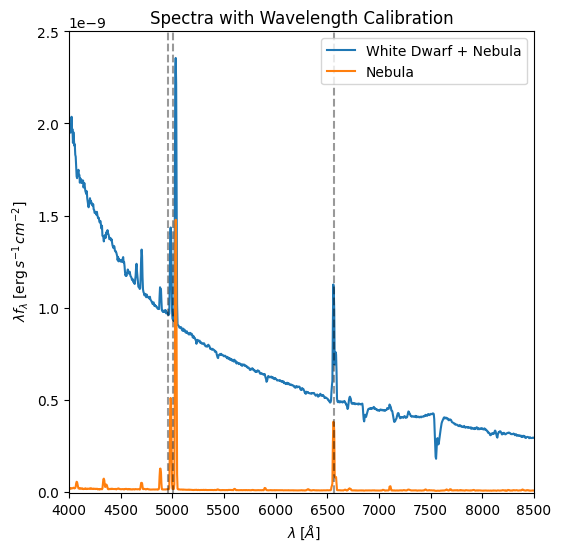

In [ ]:
wd_spec_cal  = wd_spec*response
neb_spec_cal = neb_spec*response

plt.figure(figsize=[6,6],dpi=100)
plt.plot(wavelength_array,wd_spec_cal*wavelength_array,label='White Dwarf + Nebula')
plt.plot(wavelength_array,neb_spec_cal*wavelength_array,label='Nebula')
plt.xlabel(r' $ \lambda \; [\AA]$')
plt.ylabel(r' $ \lambda f_{\lambda} \; [{\rm erg}\, s^{-1}\,cm^{-2}]$')
plt.title('Spectra with Wavelength Calibration')

plt.axvline(6563,color='k',ls='dashed',alpha=0.4) #Halpha
plt.axvline(5007,color='k',ls='dashed',alpha=0.4) #OIII
plt.axvline(4959,color='k',ls='dashed',alpha=0.4) #OIII
plt.ylim(-1e-11,2.5e-9)
plt.xlim(4000,8500)
plt.legend()